# Оптимизация маркетинговых затрат в Яндекс.Афише

## Шаг 1. Загрузка данных и подготовка их к анализу

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display
import seaborn as sns

In [2]:
pd.set_option('display.max_columns', None)
sns.set(style='white')
tables = []

In [3]:
figsize_small = (15, 5)
figsize_pie = (15, 3)

### Загрузка данных о визитах, заказах и расходах в переменные

In [4]:
visits = pd.read_csv('datasets/visits_log.csv')
tables.append(visits)
visits.name = 'visits'
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


In [5]:
orders = pd.read_csv('datasets/orders_log.csv')
tables.append(orders)
orders.name = 'orders'
orders.head()

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [6]:
costs = pd.read_csv('datasets/costs.csv')
tables.append(costs)
costs.name = 'costs'
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


### Оптимизация данных для анализа

In [7]:
# функция вывода информации о таблицах
def tables_information():
    for table in tables:
        print(f'Информация о таблице {table.name}:')
        display(table.columns)
        display(table.info())
        display(table.describe())
        print(f'Количество дублей {table.duplicated().sum()}\n')

In [8]:
tables_information()

Информация о таблице visits:


Index(['Device', 'End Ts', 'Source Id', 'Start Ts', 'Uid'], dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB


None

,Source Id,Uid
count,359400.000000,3.594000e+05
mean,3.750515,9.202557e+18
std,1.917116,5.298433e+18
min,1.000000,1.186350e+13
25%,3.000000,4.613407e+18
50%,4.000000,9.227413e+18
75%,5.000000,1.372824e+19
max,10.000000,1.844668e+19


Количество дублей 0

Информация о таблице orders:


Index(['Buy Ts', 'Revenue', 'Uid'], dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB


None

,Revenue,Uid
count,50415.000000,5.041500e+04
mean,4.999647,9.098161e+18
std,21.818359,5.285742e+18
min,0.000000,3.135781e+14
25%,1.220000,4.533567e+18
50%,2.500000,9.102274e+18
75%,4.890000,1.368290e+19
max,2633.280000,1.844617e+19


Количество дублей 0

Информация о таблице costs:


Index(['source_id', 'dt', 'costs'], dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB


None

,source_id,costs
count,2542.000000,2542.000000
mean,4.857199,129.477427
std,3.181581,156.296628
min,1.000000,0.540000
25%,2.000000,21.945000
50%,4.000000,77.295000
75%,9.000000,170.065000
max,10.000000,1788.280000


Количество дублей 0



In [9]:
# перевод имен колонок к нижнему регистру и замена пробелов
for table in tables:
    for column in table.columns:
        table.rename(columns={column: str.lower(column).replace(' ', '_')}, inplace=True)           

In [10]:
# преобразование типов колонок с датами к datetime
visits['end_ts'] = visits['end_ts'].astype('datetime64')
visits['start_ts'] = visits['start_ts'].astype('datetime64')
orders['buy_ts'] = orders['buy_ts'].astype('datetime64')
costs['dt'] = costs['dt'].astype('datetime64')

In [11]:
tables_information()

Информация о таблице visits:


Index(['device', 'end_ts', 'source_id', 'start_ts', 'uid'], dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  object        
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int64         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint64        
dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)
memory usage: 13.7+ MB


None

,source_id,uid
count,359400.000000,3.594000e+05
mean,3.750515,9.202557e+18
std,1.917116,5.298433e+18
min,1.000000,1.186350e+13
25%,3.000000,4.613407e+18
50%,4.000000,9.227413e+18
75%,5.000000,1.372824e+19
max,10.000000,1.844668e+19


Количество дублей 0

Информация о таблице orders:


Index(['buy_ts', 'revenue', 'uid'], dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   buy_ts   50415 non-null  datetime64[ns]
 1   revenue  50415 non-null  float64       
 2   uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


None

,revenue,uid
count,50415.000000,5.041500e+04
mean,4.999647,9.098161e+18
std,21.818359,5.285742e+18
min,0.000000,3.135781e+14
25%,1.220000,4.533567e+18
50%,2.500000,9.102274e+18
75%,4.890000,1.368290e+19
max,2633.280000,1.844617e+19


Количество дублей 0

Информация о таблице costs:


Index(['source_id', 'dt', 'costs'], dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


None

,source_id,costs
count,2542.000000,2542.000000
mean,4.857199,129.477427
std,3.181581,156.296628
min,1.000000,0.540000
25%,2.000000,21.945000
50%,4.000000,77.295000
75%,9.000000,170.065000
max,10.000000,1788.280000


Количество дублей 0



In [12]:
foo = visits.query('start_ts >= end_ts').shape[0] / visits.shape[0]
print(f'Количество сессий с неположительной длительностью {foo:.1%}')

Количество сессий с неположительной длительностью 10.0%


In [13]:
visits.drop(index=visits.query('start_ts >= end_ts').index, inplace=True)
foo = visits.query('start_ts >= end_ts').shape[0] / visits.shape[0]
print(f'Количество сессий с неположительной длительностью {foo:.1%}')

Количество сессий с неположительной длительностью 0.0%


In [14]:
foo = orders.query('revenue <= 0').shape[0] / orders.shape[0]
print(f'Количество платежей с неположительной суммой {foo:.1%}')

Количество платежей с неположительной суммой 0.1%


In [15]:
orders.drop(index=orders.query('revenue == 0').index, inplace=True)
foo = orders.query('revenue <= 0').shape[0] / orders.shape[0]
print(f'Количество платежей с неположительной суммой {foo:.1%}')

Количество платежей с неположительной суммой 0.0%


### Дополнительные колонки и таблицы

In [16]:
# расширенная таблица visits
table = (visits
 .groupby('uid')
 .agg({'start_ts': 'min'})
 .rename(columns={'start_ts': 'first_start_ts'})
 .merge(visits, on='uid', how='right')
)
table['session_duration'] = (table['end_ts'] - table['start_ts']) / np.timedelta64(1, 'm')
table['start_day'] = table['start_ts'].astype('datetime64[D]')
table['start_week'] = ((table['start_ts'] - pd.to_timedelta(table['start_ts'].dt.dayofweek, unit='d'))
                       .astype('datetime64[D]'))
table['start_month'] = table['start_ts'].astype('datetime64[M]')
table['first_start_day'] = table['first_start_ts'].astype('datetime64[D]')
table['first_start_week'] = ((table['first_start_ts'] - 
       pd.to_timedelta(table['first_start_ts'].dt.dayofweek, unit='d')).astype('datetime64[D]'))
table['first_start_month'] = table['first_start_ts'].astype('datetime64[M]')
table['cohort_lifetime_week'] = (((table['start_ts'] - table['first_start_ts']) /
                                   np.timedelta64(1,'W')).astype('int'))
table['cohort_lifetime_month'] = (((table['start_ts'] - table['first_start_ts']) /
                                    np.timedelta64(1,'M')).round().astype('int'))
visits_advance = table.copy()
visits_advance.name = 'visits_advance'
del table
visits_advance.head()

,uid,first_start_ts,device,end_ts,source_id,start_ts,session_duration,start_day,start_week,start_month,first_start_day,first_start_week,first_start_month,cohort_lifetime_week,cohort_lifetime_month
0,11863502262781,2018-03-01 17:27:00,touch,2018-03-01 17:33:00,3,2018-03-01 17:27:00,6.0,2018-03-01,2018-02-26,2018-03-01,2018-03-01,2018-02-26,2018-03-01,0,0
1,49537067089222,2018-02-06 15:55:00,touch,2018-02-06 15:57:00,2,2018-02-06 15:55:00,2.0,2018-02-06,2018-02-05,2018-02-01,2018-02-06,2018-02-05,2018-02-01,0,0
2,297729379853735,2017-06-07 18:47:00,desktop,2017-06-07 18:48:00,3,2017-06-07 18:47:00,1.0,2017-06-07,2017-06-05,2017-06-01,2017-06-07,2017-06-05,2017-06-01,0,0
3,313578113262317,2017-09-18 22:49:00,desktop,2018-03-11 17:29:00,2,2018-03-11 17:23:00,6.0,2018-03-11,2018-03-05,2018-03-01,2017-09-18,2017-09-18,2017-09-01,24,6
4,313578113262317,2017-09-18 22:49:00,desktop,2017-09-18 23:07:00,2,2017-09-18 22:49:00,18.0,2017-09-18,2017-09-18,2017-09-01,2017-09-18,2017-09-18,2017-09-01,0,0


In [17]:
# сессия сразу перед (во время) каждой покупкой
the_session_before_the_buy = (orders
 .merge(visits[['uid', 'start_ts']], on='uid', how='left')
 .query('buy_ts >= start_ts')
 .groupby(['uid', 'buy_ts'])
 .agg({'start_ts': 'max'})
 .reset_index()
 .rename(columns={'start_ts': 'start_ts_before_the_buy'})
)
the_session_before_the_buy.head()

,uid,buy_ts,start_ts_before_the_buy
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,1575281904278712,2017-06-03 17:39:00,2017-06-03 17:36:00
3,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00
4,2464366381792757,2018-01-28 15:54:00,2018-01-28 14:37:00


In [18]:
foo = (1 - the_session_before_the_buy.shape[0] / 
         orders.groupby(['uid', 'buy_ts']).agg({'revenue': 'count'}).shape[0])
print(f'Количество покупок без предварительного использования продукта {foo:.1%}')

Количество покупок без предварительного использования продукта 1.4%


In [19]:
# таблица: самая первая покупка для каждого пользователя, который делал покупки
orders_first_buy_only = (orders
 .groupby('uid')
 .agg({'buy_ts': 'min'})
 .reset_index()
 .rename(columns={'buy_ts': 'first_buy_ts'})
)
orders_first_buy_only.head()

,uid,first_buy_ts
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00


In [20]:
# расширенная таблица orders
table = (the_session_before_the_buy
 .merge(orders, on=['uid', 'buy_ts'], how='left')
 .merge(visits_advance, left_on=['uid', 'start_ts_before_the_buy'], right_on=['uid', 'start_ts'], how='left')
 .drop(columns='start_ts')
 .merge(orders_first_buy_only, on='uid', how='left')
)
table['source_id'] = table['source_id'].astype('int')
table['start_ts_before_the_buy_day'] = table['start_ts_before_the_buy'].astype('datetime64[D]')
table['start_ts_before_the_buy_week'] = ((table['start_ts_before_the_buy'] - 
    pd.to_timedelta(table['start_ts_before_the_buy'].dt.dayofweek, unit='d')).astype('datetime64[D]'))
table['start_ts_before_the_buy_month'] = table['start_ts_before_the_buy'].astype('datetime64[M]')
table['buy_day'] = table['buy_ts'].astype('datetime64[D]')
table['buy_week'] = ((table['buy_ts'] - pd.to_timedelta(table['buy_ts'].dt.dayofweek, unit='d'))
                                                      .astype('datetime64[D]'))
table['buy_month'] = table['buy_ts'].astype('datetime64[M]')
table['buy_minutes'] = (table['buy_ts'] - table['start_ts_before_the_buy']) / np.timedelta64(1,'m')
table['first_buy_minutes'] = (table['first_buy_ts'] - table['first_start_ts']) / np.timedelta64(1,'m')
table['first_buy_week'] = ((table['first_buy_ts'] - pd.to_timedelta(table['first_buy_ts'].dt.dayofweek, unit='d'))
                                                      .astype('datetime64[D]'))
table['first_buy_month'] = table['first_buy_ts'].astype('datetime64[M]')
orders_advance = table.copy()
orders_advance.name = 'orders_advance'
del table
orders_advance.head()

,uid,buy_ts,start_ts_before_the_buy,revenue,first_start_ts,device,end_ts,source_id,session_duration,start_day,start_week,start_month,first_start_day,first_start_week,first_start_month,cohort_lifetime_week,cohort_lifetime_month,first_buy_ts,start_ts_before_the_buy_day,start_ts_before_the_buy_week,start_ts_before_the_buy_month,buy_day,buy_week,buy_month,buy_minutes,first_buy_minutes,first_buy_week,first_buy_month
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,0.55,2017-09-18 22:49:00,desktop,2017-09-18 23:07:00,2,18.0,2017-09-18,2017-09-18,2017-09-01,2017-09-18,2017-09-18,2017-09-01,0,0,2018-01-03 21:51:00,2017-09-18,2017-09-18,2017-09-01,2018-01-03,2018-01-01,2018-01-01,154022.0,154022.0,2018-01-01,2018-01-01
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,1.22,2017-06-03 10:13:00,touch,2017-06-03 10:17:00,10,4.0,2017-06-03,2017-05-29,2017-06-01,2017-06-03,2017-05-29,2017-06-01,0,0,2017-06-03 10:13:00,2017-06-03,2017-05-29,2017-06-01,2017-06-03,2017-05-29,2017-06-01,0.0,0.0,2017-05-29,2017-06-01
2,1575281904278712,2017-06-03 17:39:00,2017-06-03 17:36:00,1.83,2017-06-03 10:13:00,touch,2017-06-03 17:48:00,10,12.0,2017-06-03,2017-05-29,2017-06-01,2017-06-03,2017-05-29,2017-06-01,0,0,2017-06-03 10:13:00,2017-06-03,2017-05-29,2017-06-01,2017-06-03,2017-05-29,2017-06-01,3.0,0.0,2017-05-29,2017-06-01
3,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,73.33,2017-10-11 17:14:00,desktop,2017-10-11 17:27:00,3,13.0,2017-10-11,2017-10-09,2017-10-01,2017-10-11,2017-10-09,2017-10-01,0,0,2017-10-11 18:33:00,2017-10-11,2017-10-09,2017-10-01,2017-10-11,2017-10-09,2017-10-01,79.0,79.0,2017-10-09,2017-10-01
4,2464366381792757,2018-01-28 15:54:00,2018-01-28 14:37:00,2.44,2018-01-27 20:10:00,desktop,2018-01-28 14:49:00,5,12.0,2018-01-28,2018-01-22,2018-01-01,2018-01-27,2018-01-22,2018-01-01,0,0,2018-01-28 15:54:00,2018-01-28,2018-01-22,2018-01-01,2018-01-28,2018-01-22,2018-01-01,77.0,1184.0,2018-01-22,2018-01-01


In [21]:
orders_advance.query('buy_month == "2018-06-01"')

,uid,buy_ts,start_ts_before_the_buy,revenue,first_start_ts,device,end_ts,source_id,session_duration,start_day,start_week,start_month,first_start_day,first_start_week,first_start_month,cohort_lifetime_week,cohort_lifetime_month,first_buy_ts,start_ts_before_the_buy_day,start_ts_before_the_buy_week,start_ts_before_the_buy_month,buy_day,buy_week,buy_month,buy_minutes,first_buy_minutes,first_buy_week,first_buy_month
225,83872787173869366,2018-06-01 00:02:00,2018-05-31 23:59:00,3.42,2018-05-31 23:59:00,desktop,2018-06-01 00:04:00,4,5.0,2018-05-31,2018-05-28,2018-05-01,2018-05-31,2018-05-28,2018-05-01,0,0,2018-06-01 00:02:00,2018-05-31,2018-05-28,2018-05-01,2018-06-01,2018-05-28,2018-06-01,3.0,3.0,2018-05-28,2018-06-01


In [22]:
orders_advance.drop(index=orders_advance.query('buy_month == "2018-06-01"').index, inplace=True)
orders_advance.query('buy_month == "2018-06-01"').shape[0]

0

In [23]:
orders_advance_first_buy_only = orders_advance.query('buy_ts == first_buy_ts')
orders_advance_first_buy_only.head()

,uid,buy_ts,start_ts_before_the_buy,revenue,first_start_ts,device,end_ts,source_id,session_duration,start_day,start_week,start_month,first_start_day,first_start_week,first_start_month,cohort_lifetime_week,cohort_lifetime_month,first_buy_ts,start_ts_before_the_buy_day,start_ts_before_the_buy_week,start_ts_before_the_buy_month,buy_day,buy_week,buy_month,buy_minutes,first_buy_minutes,first_buy_week,first_buy_month
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,0.55,2017-09-18 22:49:00,desktop,2017-09-18 23:07:00,2,18.000000,2017-09-18,2017-09-18,2017-09-01,2017-09-18,2017-09-18,2017-09-01,0,0,2018-01-03 21:51:00,2017-09-18,2017-09-18,2017-09-01,2018-01-03,2018-01-01,2018-01-01,154022.0,154022.0,2018-01-01,2018-01-01
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,1.22,2017-06-03 10:13:00,touch,2017-06-03 10:17:00,10,4.000000,2017-06-03,2017-05-29,2017-06-01,2017-06-03,2017-05-29,2017-06-01,0,0,2017-06-03 10:13:00,2017-06-03,2017-05-29,2017-06-01,2017-06-03,2017-05-29,2017-06-01,0.0,0.0,2017-05-29,2017-06-01
3,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,73.33,2017-10-11 17:14:00,desktop,2017-10-11 17:27:00,3,13.000000,2017-10-11,2017-10-09,2017-10-01,2017-10-11,2017-10-09,2017-10-01,0,0,2017-10-11 18:33:00,2017-10-11,2017-10-09,2017-10-01,2017-10-11,2017-10-09,2017-10-01,79.0,79.0,2017-10-09,2017-10-01
4,2464366381792757,2018-01-28 15:54:00,2018-01-28 14:37:00,2.44,2018-01-27 20:10:00,desktop,2018-01-28 14:49:00,5,12.000000,2018-01-28,2018-01-22,2018-01-01,2018-01-27,2018-01-22,2018-01-01,0,0,2018-01-28 15:54:00,2018-01-28,2018-01-22,2018-01-01,2018-01-28,2018-01-22,2018-01-01,77.0,1184.0,2018-01-22,2018-01-01
5,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,6.32,2017-11-24 10:14:00,desktop,2017-11-24 10:14:19,5,0.316667,2017-11-24,2017-11-20,2017-11-01,2017-11-24,2017-11-20,2017-11-01,0,0,2017-11-24 10:14:00,2017-11-24,2017-11-20,2017-11-01,2017-11-24,2017-11-20,2017-11-01,0.0,0.0,2017-11-20,2017-11-01


In [24]:
# таблица: к каждой сессии добавлена колонка с суммой покупки в эту сессию
visits_advance_with_buys = (visits_advance
 .merge(orders_advance[['uid', 'start_ts_before_the_buy', 'revenue']],
        left_on=['uid', 'start_ts'], right_on=['uid', 'start_ts_before_the_buy'], how='left')
 .drop(columns='start_ts_before_the_buy')
 .fillna(0)
)
visits_advance_with_buys.head()

,uid,first_start_ts,device,end_ts,source_id,start_ts,session_duration,start_day,start_week,start_month,first_start_day,first_start_week,first_start_month,cohort_lifetime_week,cohort_lifetime_month,revenue
0,11863502262781,2018-03-01 17:27:00,touch,2018-03-01 17:33:00,3,2018-03-01 17:27:00,6.0,2018-03-01,2018-02-26,2018-03-01,2018-03-01,2018-02-26,2018-03-01,0,0,0.00
1,49537067089222,2018-02-06 15:55:00,touch,2018-02-06 15:57:00,2,2018-02-06 15:55:00,2.0,2018-02-06,2018-02-05,2018-02-01,2018-02-06,2018-02-05,2018-02-01,0,0,0.00
2,297729379853735,2017-06-07 18:47:00,desktop,2017-06-07 18:48:00,3,2017-06-07 18:47:00,1.0,2017-06-07,2017-06-05,2017-06-01,2017-06-07,2017-06-05,2017-06-01,0,0,0.00
3,313578113262317,2017-09-18 22:49:00,desktop,2018-03-11 17:29:00,2,2018-03-11 17:23:00,6.0,2018-03-11,2018-03-05,2018-03-01,2017-09-18,2017-09-18,2017-09-01,24,6,0.00
4,313578113262317,2017-09-18 22:49:00,desktop,2017-09-18 23:07:00,2,2017-09-18 22:49:00,18.0,2017-09-18,2017-09-18,2017-09-01,2017-09-18,2017-09-18,2017-09-01,0,0,0.55


In [25]:
# расширенная таблица costs по всем посетителям
visitors = (visits_advance_with_buys
 .groupby(['first_start_day', 'source_id'])
 .agg({'uid': 'nunique'})
 .reset_index()
 .rename(columns={'uid': 'members'})
)
table = (costs
 .groupby(['dt', 'source_id'])
 .agg({'costs': 'sum'})
 .reset_index()
 .merge(visitors, left_on=['dt', 'source_id'], right_on=['first_start_day', 'source_id'], how='left')
 .drop(columns='first_start_day')
)
table['costs_week'] = ((table['dt'] - pd.to_timedelta(table['dt'].dt.dayofweek, unit='d'))
                                                      .astype('datetime64[D]'))
table['costs_month'] = table['dt'].astype('datetime64[M]')
costs_advance_all_visitors = table.copy()
del visitors, table
costs_advance_all_visitors.head()

,dt,source_id,costs,members,costs_week,costs_month
0,2017-06-01,1,75.20,106.0,2017-05-29,2017-06-01
1,2017-06-01,2,132.56,128.0,2017-05-29,2017-06-01
2,2017-06-01,3,349.38,234.0,2017-05-29,2017-06-01
3,2017-06-01,4,76.74,186.0,2017-05-29,2017-06-01
4,2017-06-01,5,73.24,161.0,2017-05-29,2017-06-01


In [26]:
# расширенная таблица costs только по покупателям
buyers = (orders_advance
 .groupby(['first_start_day', 'source_id'])
 .agg({'uid': 'nunique'})
 .reset_index()
 .rename(columns={'uid': 'members'})
)
table = (costs
 .groupby(['dt', 'source_id'])
 .agg({'costs': 'sum'})
 .reset_index()
 .merge(buyers, left_on=['dt', 'source_id'], right_on=['first_start_day', 'source_id'], how='left')
 .drop(columns='first_start_day')
)
table['costs_week'] = ((table['dt'] - pd.to_timedelta(table['dt'].dt.dayofweek, unit='d'))
                                                      .astype('datetime64[D]'))
table['costs_month'] = table['dt'].astype('datetime64[M]')
costs_advance_buyers_only = table.copy()
del buyers, table
costs_advance_buyers_only.head()

,dt,source_id,costs,members,costs_week,costs_month
0,2017-06-01,1,75.20,46.0,2017-05-29,2017-06-01
1,2017-06-01,2,132.56,39.0,2017-05-29,2017-06-01
2,2017-06-01,3,349.38,59.0,2017-05-29,2017-06-01
3,2017-06-01,4,76.74,45.0,2017-05-29,2017-06-01
4,2017-06-01,5,73.24,35.0,2017-05-29,2017-06-01


In [27]:
# таблица: CAC по каждому источнику за каждую неделю по всем посетителям
cac_week_by_source = (costs_advance_all_visitors
 .groupby(['costs_week', 'source_id'])
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac = lambda x: x.costs / x.members)
 .reset_index()
 .rename(columns={'cac': 'cac_by_source'})
)
cac_week_all_visitors = (costs_advance_all_visitors
 .groupby('costs_week')
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac_all_sources = lambda x: x.costs / x.members)
 .reset_index()
 .drop(columns=['costs', 'members'])
 .merge(cac_week_by_source, on='costs_week')
)
del cac_week_by_source
cac_week_all_visitors.head()

,costs_week,cac_all_sources,source_id,costs,members,cac_by_source
0,2017-05-29,0.964039,1,228.98,273.0,0.838755
1,2017-05-29,0.964039,2,421.22,381.0,1.105564
2,2017-05-29,0.964039,3,1249.59,728.0,1.716470
3,2017-05-29,0.964039,4,357.31,640.0,0.558297
4,2017-05-29,0.964039,5,314.76,506.0,0.622055


In [28]:
# таблица: CAC по каждому источнику за каждый месяц по всем посетителям
cac_month_by_source = (costs_advance_all_visitors
 .groupby(['costs_month', 'source_id'])
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac = lambda x: x.costs / x.members)
 .reset_index()
 .rename(columns={'cac': 'cac_by_source'})
)
cac_month_all_visitors = (costs_advance_all_visitors
 .groupby('costs_month')
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac_all_sources = lambda x: x.costs / x.members)
 .reset_index()
 .drop(columns=['costs', 'members'])
 .merge(cac_month_by_source, on='costs_month')
)
del cac_month_by_source
cac_month_all_visitors.head()

,costs_month,cac_all_sources,source_id,costs,members,cac_by_source
0,2017-06-01,1.088191,1,1125.61,1372.0,0.820415
1,2017-06-01,1.088191,2,2427.38,1956.0,1.240992
2,2017-06-01,1.088191,3,7731.65,4577.0,1.689240
3,2017-06-01,1.088191,4,3514.80,4066.0,0.864437
4,2017-06-01,1.088191,5,2616.12,3164.0,0.826839


In [29]:
# таблица: CAC по каждому источнику за каждую неделю только по покупателям
cac_week_by_source = (costs_advance_buyers_only
 .groupby(['costs_week', 'source_id'])
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac = lambda x: x.costs / x.members)
 .reset_index()
 .rename(columns={'cac': 'cac_by_source'})
)
cac_week_buyers_only = (costs_advance_buyers_only
 .groupby('costs_week')
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac_all_sources = lambda x: x.costs / x.members)
 .reset_index()
 .drop(columns=['costs', 'members'])
 .merge(cac_week_by_source, on='costs_week')
)
del cac_week_by_source
cac_week_buyers_only.head()

,costs_week,cac_all_sources,source_id,costs,members,cac_by_source
0,2017-05-29,4.195692,1,228.98,101.0,2.267129
1,2017-05-29,4.195692,2,421.22,108.0,3.900185
2,2017-05-29,4.195692,3,1249.59,152.0,8.220987
3,2017-05-29,4.195692,4,357.31,137.0,2.608102
4,2017-05-29,4.195692,5,314.76,90.0,3.497333


In [30]:
# таблица: CAC по каждому источнику за каждый месяц только по покупателям
cac_month_by_source = (costs_advance_buyers_only
 .groupby(['costs_month', 'source_id'])
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac = lambda x: x.costs / x.members)
 .reset_index()
 .rename(columns={'cac': 'cac_by_source'})
)
cac_month_buyers_only = (costs_advance_buyers_only
 .groupby('costs_month')
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac_all_sources = lambda x: x.costs / x.members)
 .reset_index()
 .drop(columns=['costs', 'members'])
 .merge(cac_month_by_source, on='costs_month')
)
del cac_month_by_source
cac_month_buyers_only.head()

,costs_month,cac_all_sources,source_id,costs,members,cac_by_source
0,2017-06-01,5.347284,1,1125.61,452.0,2.490288
1,2017-06-01,5.347284,2,2427.38,516.0,4.704225
2,2017-06-01,5.347284,3,7731.65,845.0,9.149882
3,2017-06-01,5.347284,4,3514.80,702.0,5.006838
4,2017-06-01,5.347284,5,2616.12,589.0,4.441630


### Шаг 1. Вывод

Представленные таблицы не содержат дубли и пропуски. В таблицах visits и orders названия колонок преобразованы к нижнему регистру, пробелы заменены на нижнее подчеркивание. Во всех таблицах типы колонок с датами преобразованы к datetime. Обнаружены некорректные данные: в таблице visits сессии с неположительной длительностью (10%), в таблице orders неположительные платежи (0.1%). Некорректные данные могли появиться из-за технического сбоя. Удалены ввиду малого количества. 

Сформированы расширенные таблицы с дополнительными колонками. За июнь 18 года обнаружен всего один платеж, который помешает рассчитывать средние значения. Удален. Количество покупок без предварительного использования продукта составляет 1.4%. Такие покупки не будут использоваться в анализе.

## Шаг 2. Построение отчётов и вычисление метрик

### Продукт: сколько людей пользуются в день, неделю, месяц?

In [31]:
# функция вывода значений (в день) по периодам
def values_by_periods(table=visits,
                      period='start_week',
                      title='Длительность сессий',
                      values='session_duration',
                      values_ct_in='',
                      agg='mean',
                      date='',
                      round=0,
                      show_cohorts=False):
    
    if date != '' and show_cohorts == True:
        print('Параметр date должен быть пустым при show_cohorts == True')
        return None
    
    if values_ct_in == '':
        values_ct = values
    else:
        values_ct = values_ct_in
        
    # список агрегаторов, по которым будут выводиться долевые графики (долевые агрегаторы)
    quantitative_aggs = ['nunique', 'count', 'sum']  
    
    common_table = table.groupby(period).agg({values_ct: agg})
    
    if date == '':
        common_table.plot(kind='line', figsize=figsize_small, title=f'{title}\n', grid=True)
        plt.show()
        display(common_table.round(round))
    else:
        print(f'{title} {date}')
        max_index = common_table.query('index <= @date').index.max()
        if agg not in quantitative_aggs:
            print('Распределение данных за период:')
            f, ax = plt.subplots(figsize=(15, 2))
            ax.xaxis.grid(True)
            data = table[table[period] == max_index][[period, values]]
            data[period] = data[period].astype('str')
            fig = sns.boxplot(x=values, y=period, data=data)
            plt.show()
        display(common_table.query('index == @max_index').round(round))
    
    if date == '' and values_ct_in == '':
        # таблица с итогами за всё время
        common_totals = pd.DataFrame()
        if agg in quantitative_aggs:
            common_totals.loc[f'all_time_{agg}', values] = table[values].agg(agg)
            common_totals.loc['all_time_mean', values] = (common_totals.loc[f'all_time_{agg}', values] /
                                                             common_table.shape[0])
            common_totals.loc['all_periods_mean', values] = common_table[values].mean()            
        else:
            common_totals.loc[f'all_time_{agg}', values] = table[values].agg(agg)
            common_totals.loc[f'all_periods_{agg}', values] = common_table[values].agg(agg)
        print(f'{title} за всё время:')
        display(common_totals.round(round))
    
        # таблица с когортами
        if show_cohorts == True:
            if 'month' in period:
                cohort_period = 'month'
            elif 'week' in period:
                cohort_period = 'week'
            cohort_table = (table.pivot_table(index=f'first_start_{cohort_period}',
                        columns=f'cohort_lifetime_{cohort_period}', values=values, aggfunc=agg))
            cohort_table_totals = pd.DataFrame()
            for col in cohort_table:
                if agg in quantitative_aggs:
                    all_data_agg_in_column = (table[table[f'cohort_lifetime_{cohort_period}'] == col]
                                                                                [values].agg(agg))
                    cohort_table_totals.loc['all_data_mean', col] = (all_data_agg_in_column /
                                                       cohort_table[~cohort_table[col].isna()].shape[0])
                    cohort_table_totals.loc['all_cohorts_mean', col] = cohort_table[col].mean()
                else:
                    cohort_table_totals.loc[f'all_data_{agg}', col] = (table
                                                       [table[f'cohort_lifetime_{cohort_period}'] == col]
                                                       [values].agg(agg)) 
                    cohort_table_totals.loc[f'all_cohorts_{agg}', col] = cohort_table[col].agg(agg)
            plt.figure(figsize=figsize_small)
            plt.title(f'{title} по когортам пользователей \n')
            (sns.heatmap(pd.concat([cohort_table, cohort_table_totals]), annot=True,
                        fmt=f'.{round}f', linewidths=0.5, linecolor='gray'))
            plt.show()
            
    for group in [['device', 'по устройствам'], ['source_id', 'по рекламным источникам']]:
        if group[0] in table.columns:
            pivot = table.pivot_table(index=period, columns=group[0], values=values, aggfunc=agg)

            if date == '':
                pivot.plot(kind='line', figsize=figsize_small, title=f'{title} {group[1]}\n', grid=True)
                plt.show()

            # дополнительная таблица с долями
            if values_ct_in == '':
                add_columns = pd.DataFrame()
                for col in pivot.columns:
                    add_columns[str(col) + '_%'] = pivot[col] / common_table[values] * 100

            if date == '' and values_ct_in == '':
                display(pivot.merge(add_columns, on=period).round(round))
                # таблица с итогами за всё время
                totals = pd.DataFrame()
                print(f'{title} за всё время {group[1]}:')
                for col in pivot.columns:
                    totals.loc[f'all_time_{agg}', col] = table[table[group[0]] == col][values].agg(agg)
                    if agg in quantitative_aggs:
                        totals.loc['all_time_mean', col] = (totals.loc[f'all_time_{agg}', col] /
                                                               common_table.shape[0])
                        totals.loc['all_periods_mean', col] = pivot[col].mean()
                    else:
                        totals.loc[f'all_periods_{agg}', col] = pivot[col].agg(agg)
                plt.subplots(figsize=figsize_pie)
                (totals.iloc[totals.shape[0]-2].T.sort_values(ascending=False).plot(kind='pie',
                    ax=plt.subplot(1, 2, 1), title=f'Доли {group[1]},\nсреднее за всё время'))
                (totals.iloc[totals.shape[0]-1].T.sort_values(ascending=False).plot(kind='pie',
                    ax=plt.subplot(1, 2, 2), title=f'Доли {group[1]},\nсреднее по всем периодам'))
                # вычисление процентов
                for col in totals.columns:
                    totals.loc[f'all_time_{agg}', str(col) + '_%'] = ((totals.loc[f'all_time_{agg}', col] /
                                                         common_totals.loc[f'all_time_{agg}', values]) * 100)
                    if agg in quantitative_aggs:
                        totals.loc['all_time_mean', str(col) + '_%'] = ((totals.loc['all_time_mean', col] /
                                                       common_totals.loc['all_time_mean', values]) * 100)
                        totals.loc['all_periods_mean', str(col) + '_%'] = ((totals.loc['all_periods_mean', col] /
                                                       common_totals.loc['all_periods_mean', values]) * 100)
                    else:
                        totals.loc[f'all_periods_{agg}', str(col) + '_%'] = ((totals.loc[f'all_periods_{agg}', col] /
                                                         common_totals.loc[f'all_periods_{agg}', values]) * 100)                
                display(totals.round(round))
                plt.show()
            elif date != '':
                pivot = pivot.query('index <= @date').iloc[[pivot.query('index <= @date').shape[0]-1]]
                print(f'{title} {date} {group[1]}:')
                if values_ct_in == '':
                    display(pivot.merge(add_columns, on=period).round(round))
                else:
                    display(pivot.round(round))
                (pivot.iloc[0].sort_values(ascending=False)
                     .plot(kind='pie', figsize=figsize_pie, title=f'Доли {group[1]}'))
                plt.show()    
            elif values_ct_in != '':
                display(pivot.round(round))

#### Продукт: сколько людей пользуются в день?

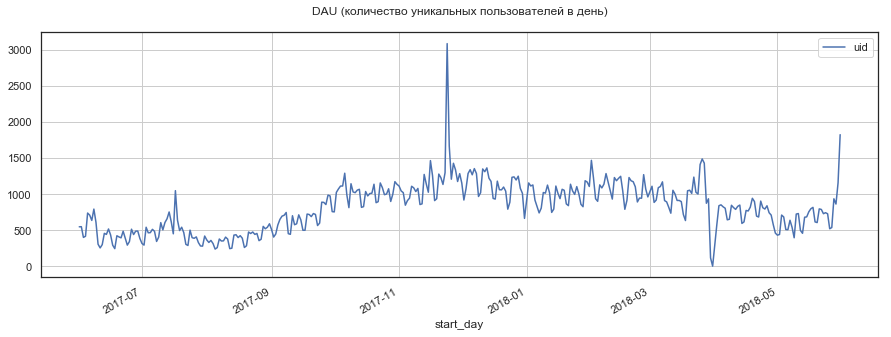

,uid
start_day,
2017-06-01,547
2017-06-02,549
2017-06-03,400
2017-06-04,416
2017-06-05,738
...,...
2018-05-27,537
2018-05-28,936
2018-05-29,863


DAU (количество уникальных пользователей в день) за всё время:


,uid
all_time_nunique,207051.0
all_time_mean,569.0
all_periods_mean,818.0


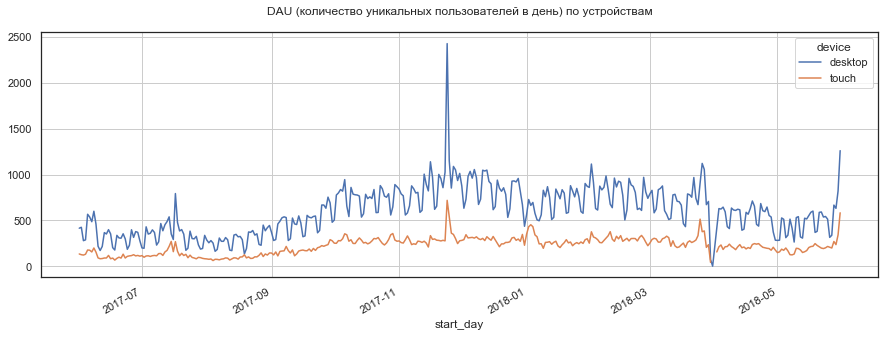

,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-06-01,415.0,134.0,76.0,24.0
2017-06-02,425.0,126.0,77.0,23.0
2017-06-03,279.0,122.0,70.0,30.0
2017-06-04,288.0,131.0,69.0,31.0
2017-06-05,567.0,177.0,77.0,24.0
...,...,...,...,...
2018-05-27,338.0,199.0,63.0,37.0
2018-05-28,667.0,270.0,71.0,29.0
2018-05-29,632.0,236.0,73.0,27.0


DAU (количество уникальных пользователей в день) за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_nunique,150671.0,63057.0,73.0,30.0
all_time_mean,414.0,173.0,73.0,30.0
all_periods_mean,600.0,221.0,73.0,27.0


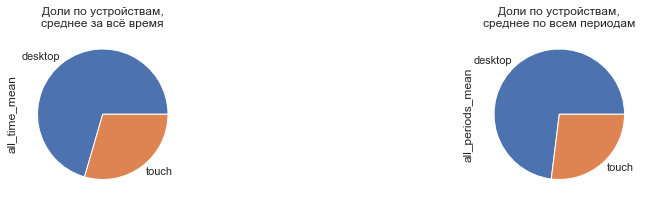

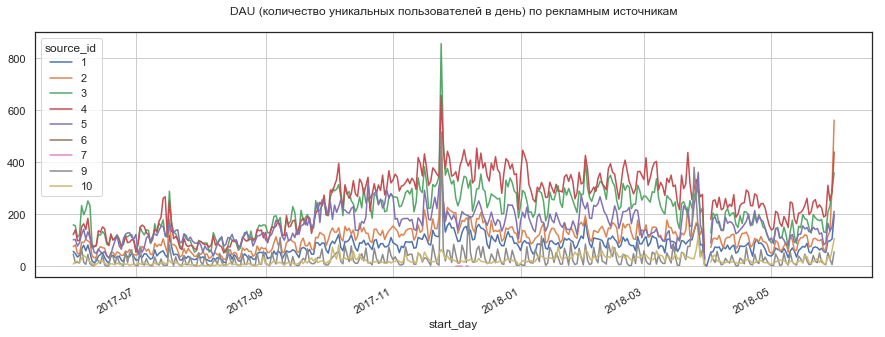

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-06-01,58.0,76.0,160.0,122.0,102.0,NaN,NaN,47.0,9.0,11.0,14.0,29.0,22.0,19.0,NaN,NaN,9.0,2.0
2017-06-02,49.0,83.0,156.0,141.0,104.0,NaN,NaN,14.0,20.0,9.0,15.0,28.0,26.0,19.0,NaN,NaN,3.0,4.0
2017-06-03,36.0,51.0,112.0,99.0,78.0,NaN,NaN,16.0,19.0,9.0,13.0,28.0,25.0,20.0,NaN,NaN,4.0,5.0
2017-06-04,43.0,46.0,123.0,100.0,91.0,NaN,NaN,13.0,16.0,10.0,11.0,30.0,24.0,22.0,NaN,NaN,3.0,4.0
2017-06-05,68.0,93.0,234.0,152.0,123.0,NaN,NaN,70.0,30.0,9.0,13.0,32.0,21.0,17.0,NaN,NaN,9.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-05-27,54.0,69.0,130.0,196.0,91.0,NaN,NaN,6.0,9.0,10.0,13.0,24.0,36.0,17.0,NaN,NaN,1.0,2.0
2018-05-28,97.0,118.0,209.0,312.0,166.0,NaN,NaN,53.0,38.0,10.0,13.0,22.0,33.0,18.0,NaN,NaN,6.0,4.0
2018-05-29,98.0,135.0,233.0,253.0,136.0,NaN,NaN,27.0,29.0,11.0,16.0,27.0,29.0,16.0,NaN,NaN,3.0,3.0


DAU (количество уникальных пользователей в день) за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_nunique,17960.0,24152.0,67284.0,75080.0,50921.0,5.0,33.0,8504.0,7208.0,9.0,12.0,32.0,36.0,25.0,0.0,0.0,4.0,3.0
all_time_mean,49.0,66.0,185.0,206.0,140.0,0.0,0.0,23.0,20.0,9.0,12.0,32.0,36.0,25.0,0.0,0.0,4.0,3.0
all_periods_mean,76.0,110.0,208.0,246.0,157.0,1.0,1.0,33.0,23.0,9.0,13.0,25.0,30.0,19.0,0.0,0.0,4.0,3.0


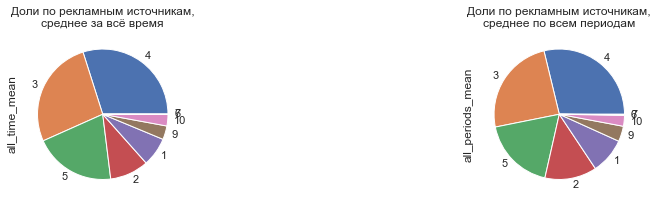

In [32]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='DAU (количество уникальных пользователей в день)',
                  values='uid',
                  agg='nunique',)

DAU: в среднем по дневным периодам, продуктом пользуются 818 человек в день, из них 73% десктопными и 27% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (30%), 3 (25%), 5 (19%).

В среднем за всё время, продуктом пользуются 569 человек в день, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (25%), 5 (19%).

DAU (количество уникальных пользователей в день) на дату 2017-09-22


,uid
start_day,
2017-09-22,719


DAU (количество уникальных пользователей в день) на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-09-22,548.0,173.0,76.0,24.0


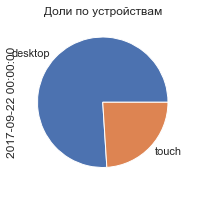

DAU (количество уникальных пользователей в день) на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-09-22,65.0,93.0,181.0,184.0,188.0,NaN,1.0,18.0,27.0,9.0,13.0,25.0,26.0,26.0,NaN,0.0,3.0,4.0


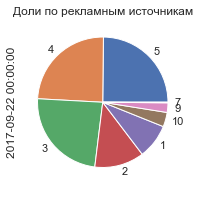

In [33]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='DAU (количество уникальных пользователей в день) на дату',
                  values='uid',
                  agg='nunique',
                  date='2017-09-22',)

#### Продукт: сколько людей пользуются в неделю?

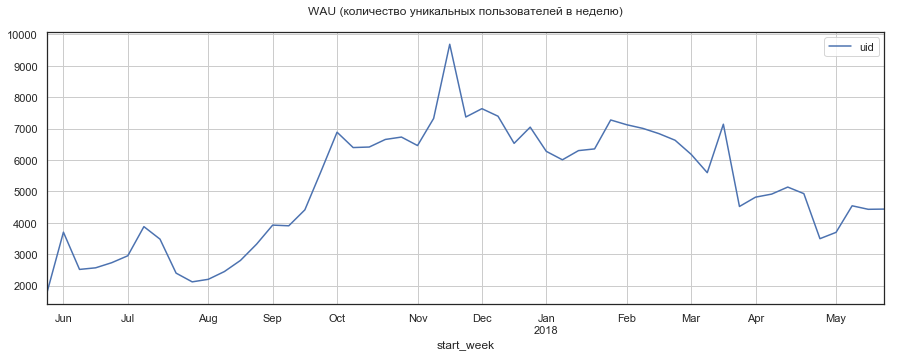

,uid
start_week,
2017-05-29,1816
2017-06-05,3700
2017-06-12,2514
2017-06-19,2565
2017-06-26,2728
2017-07-03,2949
2017-07-10,3876
2017-07-17,3478
2017-07-24,2396


WAU (количество уникальных пользователей в неделю) за всё время:


,uid
all_time_nunique,207051.0
all_time_mean,3907.0
all_periods_mean,5148.0


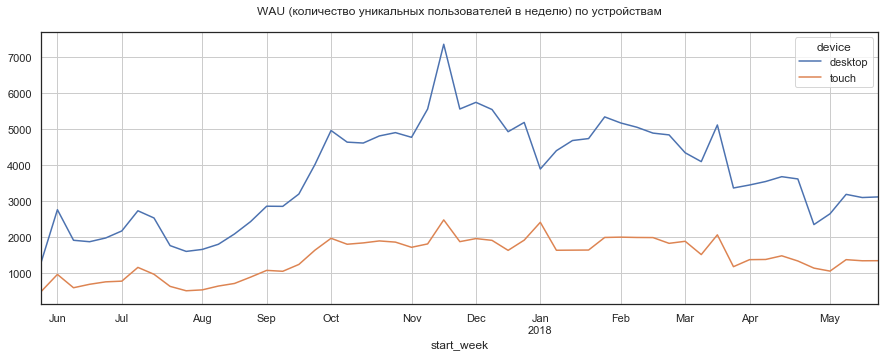

,desktop,touch,desktop_%,touch_%
start_week,,,,
2017-05-29,1326,502,73.0,28.0
2017-06-05,2769,972,75.0,26.0
2017-06-12,1920,602,76.0,24.0
2017-06-19,1880,698,73.0,27.0
2017-06-26,1984,766,73.0,28.0
2017-07-03,2179,785,74.0,27.0
2017-07-10,2739,1167,71.0,30.0
2017-07-17,2539,976,73.0,28.0
2017-07-24,1772,640,74.0,27.0


WAU (количество уникальных пользователей в неделю) за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_nunique,150671.0,63057.0,73.0,30.0
all_time_mean,2843.0,1190.0,73.0,30.0
all_periods_mean,3757.0,1434.0,73.0,28.0


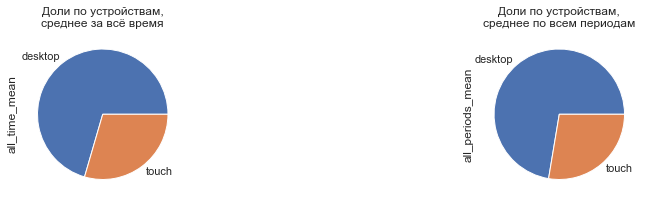

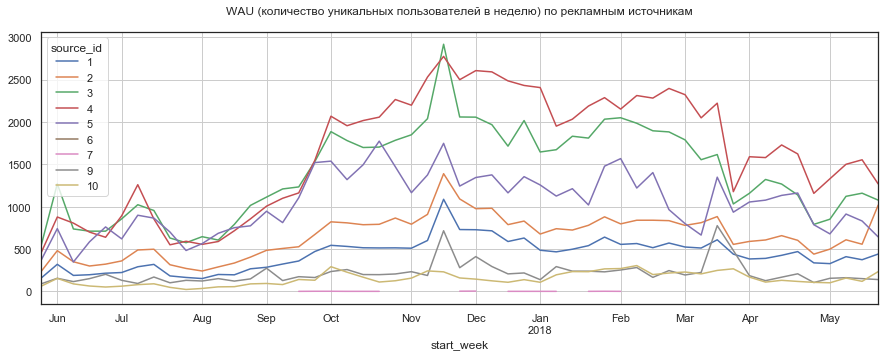

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_week,,,,,,,,,,,,,,,,,,
2017-05-29,158.0,236.0,544.0,458.0,369.0,NaN,NaN,90.0,62.0,9.0,13.0,30.0,25.0,20.0,NaN,NaN,5.0,3.0
2017-06-05,320.0,481.0,1270.0,878.0,741.0,NaN,1.0,155.0,154.0,9.0,13.0,34.0,24.0,20.0,NaN,0.0,4.0,4.0
2017-06-12,189.0,350.0,737.0,806.0,347.0,NaN,NaN,116.0,89.0,8.0,14.0,29.0,32.0,14.0,NaN,NaN,5.0,4.0
2017-06-19,197.0,300.0,711.0,700.0,585.0,NaN,1.0,151.0,64.0,8.0,12.0,28.0,27.0,23.0,NaN,0.0,6.0,2.0
2017-06-26,215.0,322.0,711.0,639.0,761.0,1.0,NaN,202.0,52.0,8.0,12.0,26.0,23.0,28.0,0.0,NaN,7.0,2.0
2017-07-03,223.0,360.0,856.0,892.0,620.0,NaN,1.0,131.0,62.0,8.0,12.0,29.0,30.0,21.0,NaN,0.0,4.0,2.0
2017-07-10,291.0,489.0,1023.0,1259.0,899.0,NaN,NaN,94.0,80.0,8.0,13.0,26.0,32.0,23.0,NaN,NaN,2.0,2.0
2017-07-17,319.0,498.0,955.0,855.0,865.0,NaN,NaN,170.0,90.0,9.0,14.0,27.0,25.0,25.0,NaN,NaN,5.0,3.0
2017-07-24,183.0,315.0,630.0,550.0,701.0,NaN,1.0,102.0,48.0,8.0,13.0,26.0,23.0,29.0,NaN,0.0,4.0,2.0


WAU (количество уникальных пользователей в неделю) за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_nunique,17960.0,24152.0,67284.0,75080.0,50921.0,5.0,33.0,8504.0,7208.0,9.0,12.0,32.0,36.0,25.0,0.0,0.0,4.0,3.0
all_time_mean,339.0,456.0,1270.0,1417.0,961.0,0.0,1.0,160.0,136.0,9.0,12.0,32.0,36.0,25.0,0.0,0.0,4.0,3.0
all_periods_mean,438.0,654.0,1402.0,1636.0,1041.0,1.0,1.0,216.0,148.0,9.0,13.0,27.0,32.0,20.0,0.0,0.0,4.0,3.0


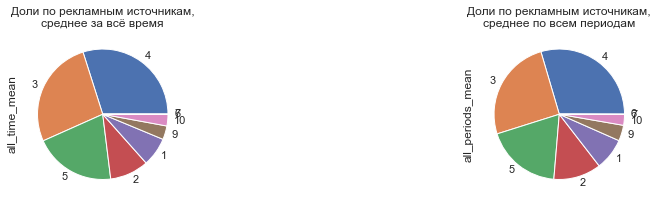

In [34]:
values_by_periods(table=visits_advance,
                  period='start_week',
                  title='WAU (количество уникальных пользователей в неделю)',
                  values='uid',
                  agg='nunique',)

WAU: в среднем по недельным периодам, продуктом пользуются 5148 человек в неделю, из них 73% десктопными и 28% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (32%), 3 (27%), 5 (20%).

В среднем за всё время, продуктом пользуются 3907 человек в неделю, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

WAU (количество уникальных пользователей в неделю) на дату 2017-09-22


,uid
start_week,
2017-09-18,4411


WAU (количество уникальных пользователей в неделю) на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_week,,,,
2017-09-18,3204,1249,73.0,28.0


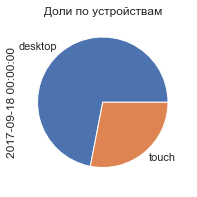

WAU (количество уникальных пользователей в неделю) на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_week,,,,,,,,,,,,,,,,,,
2017-09-18,359.0,527.0,1233.0,1162.0,1105.0,NaN,1.0,174.0,141.0,8.0,12.0,28.0,26.0,25.0,NaN,0.0,4.0,3.0


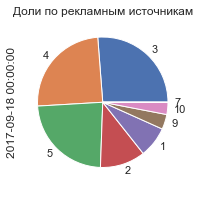

In [35]:
values_by_periods(table=visits_advance,
                  period='start_week',
                  title='WAU (количество уникальных пользователей в неделю) на дату',
                  values='uid',
                  agg='nunique',
                  date='2017-09-22',)

#### Продукт: сколько людей пользуются в месяц?

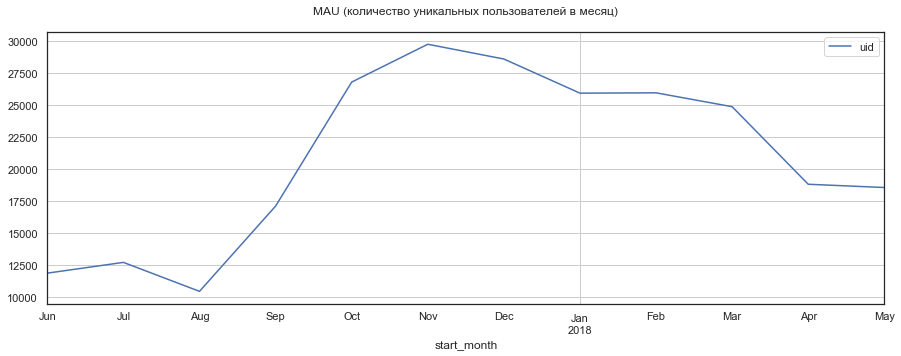

,uid
start_month,
2017-06-01,11885
2017-07-01,12725
2017-08-01,10465
2017-09-01,17117
2017-10-01,26794
2017-11-01,29745
2017-12-01,28593
2018-01-01,25930
2018-02-01,25955


MAU (количество уникальных пользователей в месяц) за всё время:


,uid
all_time_nunique,207051.0
all_time_mean,17254.0
all_periods_mean,20956.0


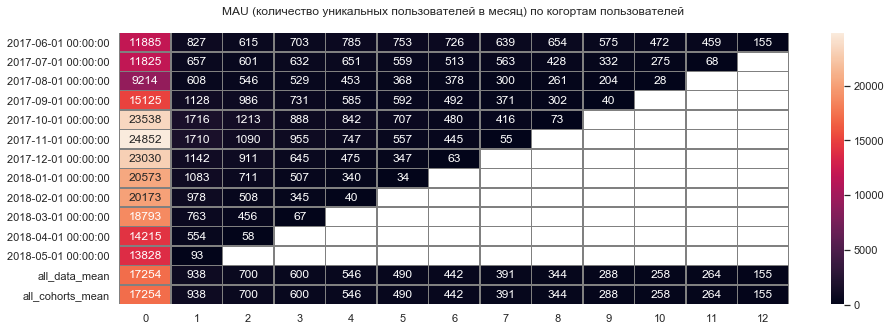

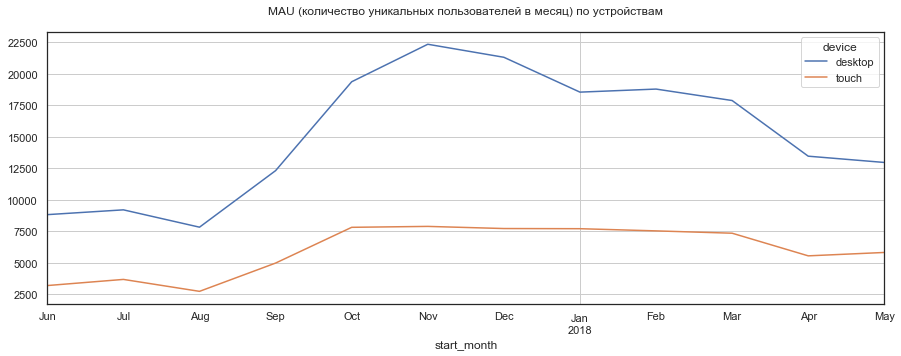

,desktop,touch,desktop_%,touch_%
start_month,,,,
2017-06-01,8825,3195,74.0,27.0
2017-07-01,9205,3682,72.0,29.0
2017-08-01,7829,2735,75.0,26.0
2017-09-01,12318,4980,72.0,29.0
2017-10-01,19374,7818,72.0,29.0
2017-11-01,22351,7891,75.0,27.0
2017-12-01,21317,7721,75.0,27.0
2018-01-01,18550,7708,72.0,30.0
2018-02-01,18793,7535,72.0,29.0


MAU (количество уникальных пользователей в месяц) за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_nunique,150671.0,63057.0,73.0,30.0
all_time_mean,12556.0,5255.0,73.0,30.0
all_periods_mean,15240.0,5999.0,73.0,29.0


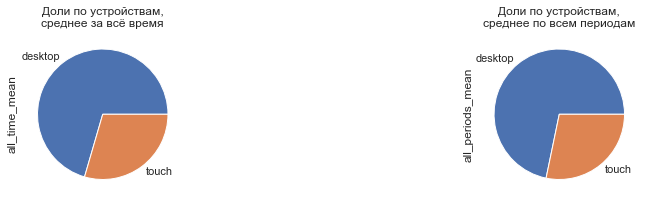

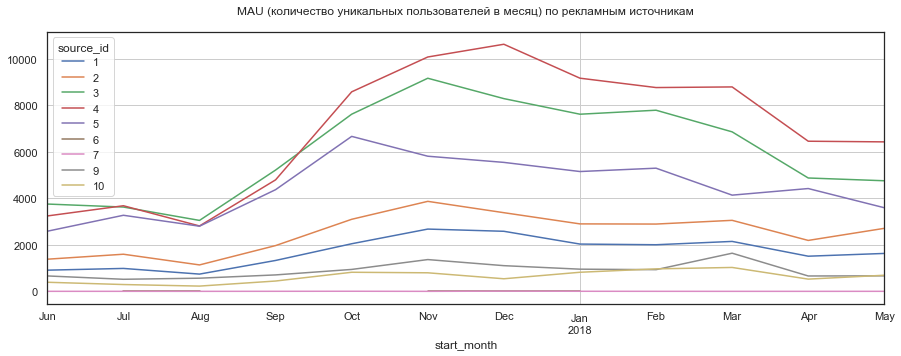

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_month,,,,,,,,,,,,,,,,,,
2017-06-01,912.0,1384.0,3757.0,3245.0,2588.0,NaN,2.0,664.0,392.0,8.0,12.0,32.0,27.0,22.0,NaN,0.0,6.0,3.0
2017-07-01,987.0,1598.0,3628.0,3684.0,3274.0,1.0,2.0,520.0,294.0,8.0,13.0,29.0,29.0,26.0,0.0,0.0,4.0,2.0
2017-08-01,743.0,1138.0,3053.0,2814.0,2804.0,1.0,1.0,567.0,227.0,7.0,11.0,29.0,27.0,27.0,0.0,0.0,5.0,2.0
2017-09-01,1330.0,1970.0,5220.0,4798.0,4376.0,NaN,3.0,708.0,445.0,8.0,12.0,30.0,28.0,26.0,NaN,0.0,4.0,3.0
2017-10-01,2049.0,3101.0,7623.0,8585.0,6668.0,NaN,5.0,944.0,822.0,8.0,12.0,28.0,32.0,25.0,NaN,0.0,4.0,3.0
2017-11-01,2680.0,3873.0,9170.0,10084.0,5815.0,1.0,1.0,1368.0,799.0,9.0,13.0,31.0,34.0,20.0,0.0,0.0,5.0,3.0
2017-12-01,2585.0,3385.0,8293.0,10632.0,5549.0,1.0,9.0,1106.0,542.0,9.0,12.0,29.0,37.0,19.0,0.0,0.0,4.0,2.0
2018-01-01,2035.0,2903.0,7622.0,9172.0,5156.0,1.0,4.0,955.0,822.0,8.0,11.0,29.0,35.0,20.0,0.0,0.0,4.0,3.0
2018-02-01,2006.0,2896.0,7794.0,8769.0,5300.0,NaN,2.0,934.0,968.0,8.0,11.0,30.0,34.0,20.0,NaN,0.0,4.0,4.0


MAU (количество уникальных пользователей в месяц) за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_nunique,17960.0,24152.0,67284.0,75080.0,50921.0,5.0,33.0,8504.0,7208.0,9.0,12.0,32.0,36.0,25.0,0.0,0.0,4.0,3.0
all_time_mean,1497.0,2013.0,5607.0,6257.0,4243.0,0.0,3.0,709.0,601.0,9.0,12.0,32.0,36.0,25.0,0.0,0.0,4.0,3.0
all_periods_mean,1718.0,2517.0,6055.0,6956.0,4474.0,1.0,3.0,895.0,630.0,8.0,12.0,29.0,33.0,21.0,0.0,0.0,4.0,3.0


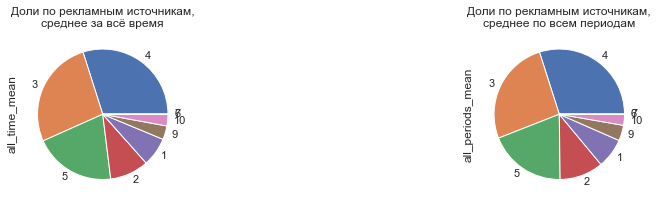

In [36]:
values_by_periods(table=visits_advance,
                  period='start_month',
                  title='MAU (количество уникальных пользователей в месяц)',
                  values='uid',
                  agg='nunique',
                  show_cohorts=True,)

MAU: в среднем по месячным периодам, продуктом пользуются 20956 человек в месяц, из них 73% десктопными и 29% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (33%), 3 (29%), 5 (21%).

В среднем за всё время, продуктом пользуются 17254 человек в месяц, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

За всё время продуктом воспользовались 207051 человек, из них из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

Количество пользователей снижается в 10-30 раз по разным когортам уже через месяц использования продукта.

Количество пользователей в нулевом месяце использования продукта было максимальным в ноябре 17 года (24852), после чего стало снижаться до 13828 в мае 18 года. Падение за этот период составило 44%.

MAU (количество уникальных пользователей в месяц) на дату 2017-09-22


,uid
start_month,
2017-09-01,17117


MAU (количество уникальных пользователей в месяц) на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_month,,,,
2017-09-01,12318,4980,72.0,29.0


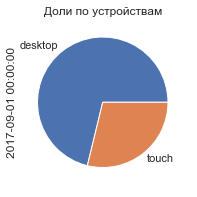

MAU (количество уникальных пользователей в месяц) на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_month,,,,,,,,,,,,,,,,,,
2017-09-01,1330.0,1970.0,5220.0,4798.0,4376.0,NaN,3.0,708.0,445.0,8.0,12.0,30.0,28.0,26.0,NaN,0.0,4.0,3.0


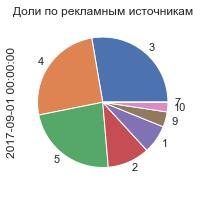

In [37]:
values_by_periods(table=visits_advance,
                  period='start_month',
                  title='MAU (количество уникальных пользователей в месяц) на дату',
                  values='uid',
                  agg='nunique',
                  date='2017-09-22',)

#### Продукт: сколько людей пользуются в день, неделю, месяц? Вывод

DAU: в среднем по дневным периодам, продуктом пользуются 818 человек в день, из них 73% десктопными и 27% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (30%), 3 (25%), 5 (19%).

В среднем за всё время, продуктом пользуются 569 человек в день, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (25%), 5 (19%).

WAU: в среднем по недельным периодам, продуктом пользуются 5148 человек в неделю, из них 73% десктопными и 28% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (32%), 3 (27%), 5 (20%).

В среднем за всё время, продуктом пользуются 3907 человек в неделю, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

MAU: в среднем по месячным периодам, продуктом пользуются 20956 человек в месяц, из них 73% десктопными и 29% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (33%), 3 (29%), 5 (21%).

В среднем за всё время, продуктом пользуются 17254 человек в месяц, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

За всё время продуктом воспользовались 207051 человек, из них из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

Количество пользователей снижается в 10-30 раз по разным когортам уже через месяц использования продукта.

Количество пользователей в нулевом месяце использования продукта было максимальным в ноябре 17 года (24852), после чего стало снижаться до 13828 в мае 18 года. Падение за этот период составило 44%.

### Продукт: сколько сессий в день?

#### Продукт: сколько сессий в день?

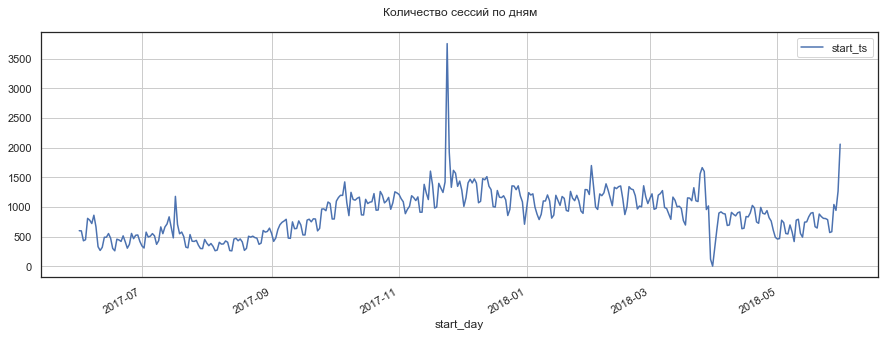

,start_ts
start_day,
2017-06-01,599
2017-06-02,596
2017-06-03,429
2017-06-04,447
2017-06-05,807
...,...
2018-05-27,582
2018-05-28,1041
2018-05-29,942


Количество сессий по дням за всё время:


,start_ts
all_time_count,323604.0
all_time_mean,889.0
all_periods_mean,889.0


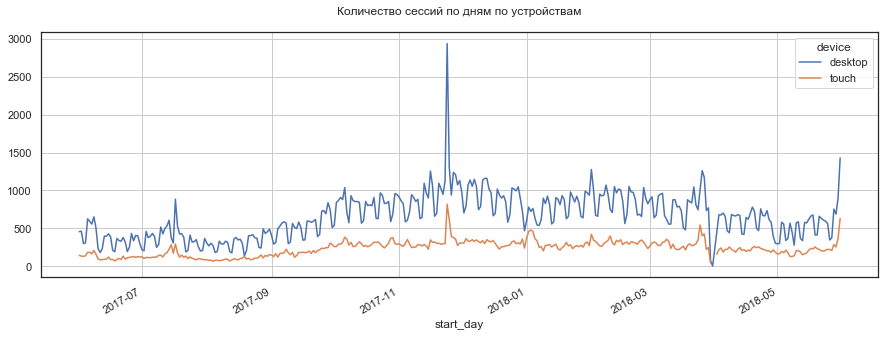

,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-06-01,456.0,143.0,76.0,24.0
2017-06-02,462.0,134.0,78.0,22.0
2017-06-03,299.0,130.0,70.0,30.0
2017-06-04,309.0,138.0,69.0,31.0
2017-06-05,625.0,182.0,77.0,23.0
...,...,...,...,...
2018-05-27,373.0,209.0,64.0,36.0
2018-05-28,754.0,287.0,72.0,28.0
2018-05-29,688.0,254.0,73.0,27.0


Количество сессий по дням за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_count,238876.0,84728.0,74.0,26.0
all_time_mean,656.0,233.0,74.0,26.0
all_periods_mean,656.0,233.0,74.0,26.0


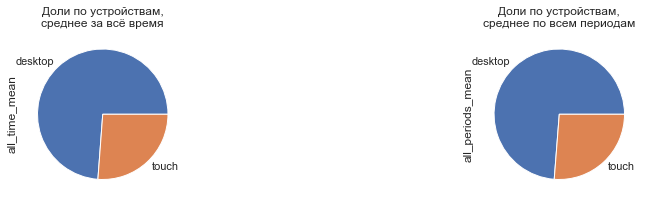

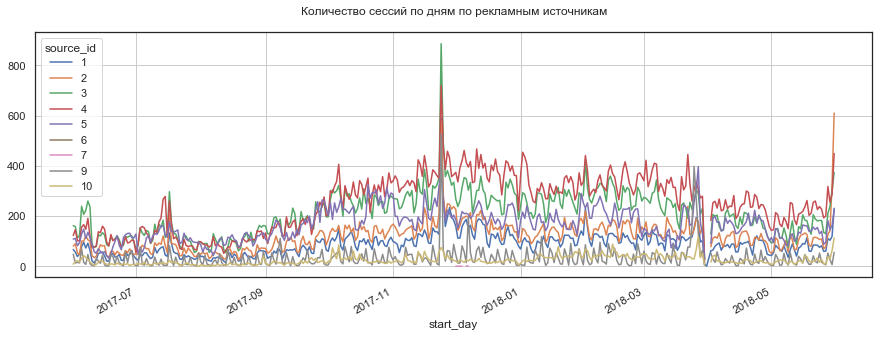

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-06-01,67.0,81.0,162.0,123.0,109.0,NaN,NaN,48.0,9.0,11.0,14.0,27.0,21.0,18.0,NaN,NaN,8.0,2.0
2017-06-02,57.0,90.0,158.0,146.0,111.0,NaN,NaN,14.0,20.0,10.0,15.0,27.0,24.0,19.0,NaN,NaN,2.0,3.0
2017-06-03,39.0,54.0,113.0,102.0,82.0,NaN,NaN,16.0,23.0,9.0,13.0,26.0,24.0,19.0,NaN,NaN,4.0,5.0
2017-06-04,50.0,47.0,123.0,102.0,94.0,NaN,NaN,14.0,17.0,11.0,11.0,28.0,23.0,21.0,NaN,NaN,3.0,4.0
2017-06-05,79.0,101.0,239.0,156.0,129.0,NaN,NaN,70.0,33.0,10.0,13.0,30.0,19.0,16.0,NaN,NaN,9.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-05-27,61.0,79.0,130.0,201.0,96.0,NaN,NaN,6.0,9.0,10.0,14.0,22.0,35.0,16.0,NaN,NaN,1.0,2.0
2018-05-28,111.0,127.0,211.0,318.0,182.0,NaN,NaN,53.0,39.0,11.0,12.0,20.0,31.0,17.0,NaN,NaN,5.0,4.0
2018-05-29,104.0,142.0,238.0,255.0,146.0,NaN,NaN,27.0,30.0,11.0,15.0,25.0,27.0,15.0,NaN,NaN,3.0,3.0


Количество сессий по дням за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_count,32146.0,43468.0,76584.0,90896.0,59520.0,5.0,35.0,11979.0,8971.0,10.0,13.0,24.0,28.0,18.0,0.0,0.0,4.0,3.0
all_time_mean,88.0,119.0,210.0,250.0,164.0,0.0,0.0,33.0,25.0,10.0,13.0,24.0,28.0,18.0,0.0,0.0,4.0,3.0
all_periods_mean,88.0,120.0,211.0,250.0,164.0,1.0,1.0,33.0,25.0,10.0,13.0,24.0,28.0,18.0,0.0,0.0,4.0,3.0


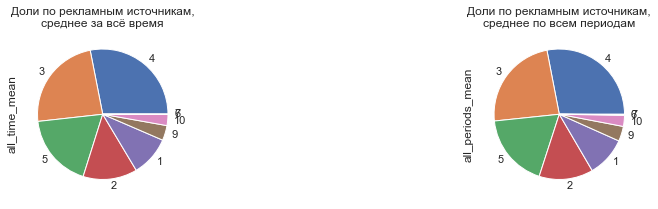

In [38]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='Количество сессий по дням',
                  values='start_ts',
                  agg='count',)

Количество сессий в день на дату 2017-09-22


,start_ts
start_day,
2017-09-22,796


Количество сессий в день на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-09-22,617.0,179.0,78.0,22.0


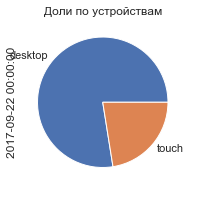

Количество сессий в день на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-09-22,78.0,100.0,183.0,189.0,200.0,NaN,1.0,18.0,27.0,10.0,13.0,23.0,24.0,25.0,NaN,0.0,2.0,3.0


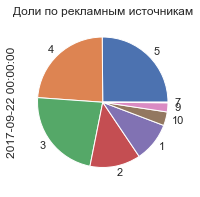

In [39]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='Количество сессий в день на дату',
                  values='start_ts',
                  agg='count',
                  date='2017-09-22',)

#### Продукт: сколько сессий в день? Вывод

В среднем за всё время, количество сессий составляет 889 в день, из них 74% десктопные и 26% мобильные версиии. Топ-3 рекламных источников: 4 (28%), 3 (24%), 5 (18%).

За весь период продуктом воспользовались 238876 раза.

### Продукт: сколько длится одна сессия?

#### Продукт: сколько длится одна сессия? (дни)

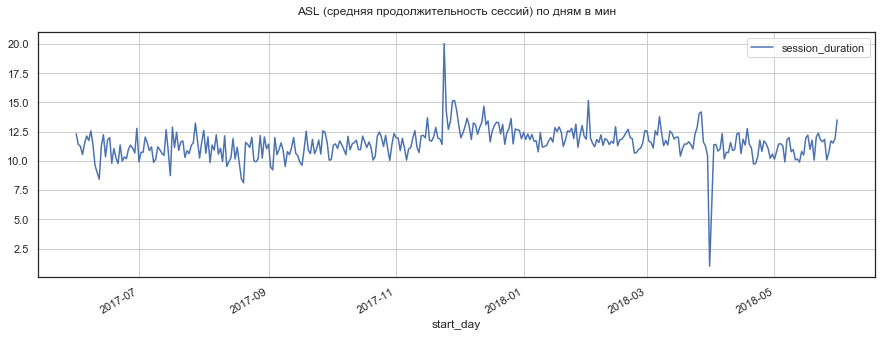

,session_duration
start_day,
2017-06-01,12.0
2017-06-02,11.0
2017-06-03,11.0
2017-06-04,11.0
2017-06-05,12.0
...,...
2018-05-27,11.0
2018-05-28,12.0
2018-05-29,12.0


ASL (средняя продолжительность сессий) по дням в мин за всё время:


,session_duration
all_time_mean,12.0
all_periods_mean,12.0


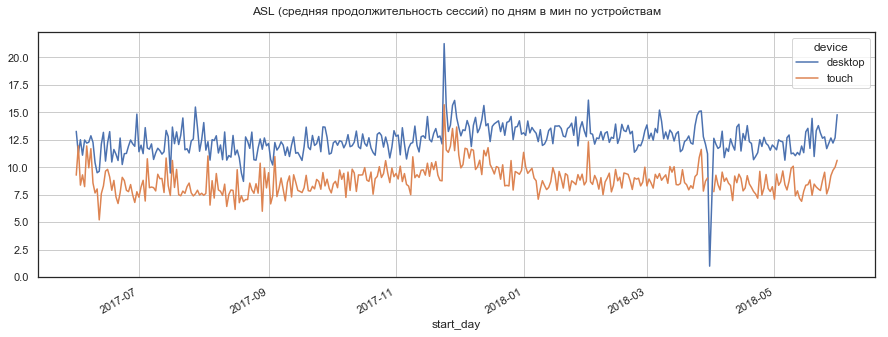

,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-06-01,13.0,9.0,108.0,75.0
2017-06-02,11.0,12.0,99.0,105.0
2017-06-03,12.0,8.0,111.0,74.0
2017-06-04,11.0,9.0,105.0,88.0
2017-06-05,12.0,8.0,108.0,71.0
...,...,...,...,...
2018-05-27,12.0,8.0,113.0,76.0
2018-05-28,13.0,9.0,108.0,79.0
2018-05-29,12.0,10.0,106.0,84.0


ASL (средняя продолжительность сессий) по дням в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,13.0,9.0,108.0,77.0
all_periods_mean,12.0,9.0,108.0,77.0


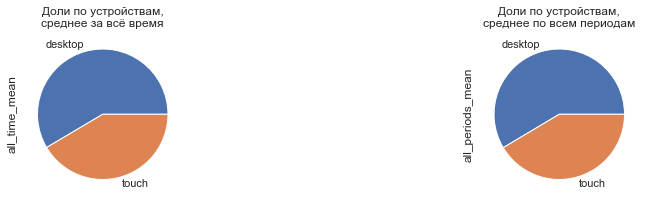

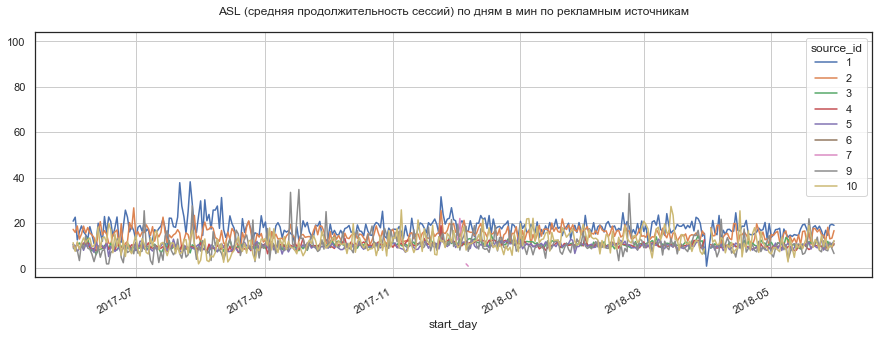

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-06-01,21.0,17.0,10.0,10.0,11.0,NaN,NaN,9.0,11.0,169.0,140.0,84.0,80.0,86.0,NaN,NaN,74.0,92.0
2017-06-02,23.0,16.0,9.0,9.0,10.0,NaN,NaN,8.0,8.0,198.0,139.0,79.0,78.0,87.0,NaN,NaN,70.0,66.0
2017-06-03,13.0,19.0,10.0,11.0,7.0,NaN,NaN,8.0,12.0,111.0,166.0,93.0,99.0,66.0,NaN,NaN,70.0,104.0
2017-06-04,16.0,13.0,11.0,9.0,9.0,NaN,NaN,3.0,8.0,152.0,123.0,106.0,84.0,83.0,NaN,NaN,33.0,80.0
2017-06-05,19.0,15.0,10.0,10.0,10.0,NaN,NaN,11.0,11.0,162.0,131.0,83.0,85.0,89.0,NaN,NaN,98.0,97.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-05-27,17.0,12.0,9.0,9.0,12.0,NaN,NaN,8.0,13.0,157.0,111.0,87.0,81.0,112.0,NaN,NaN,76.0,122.0
2018-05-28,15.0,18.0,12.0,10.0,10.0,NaN,NaN,8.0,8.0,124.0,155.0,102.0,87.0,83.0,NaN,NaN,66.0,72.0
2018-05-29,19.0,13.0,10.0,10.0,11.0,NaN,NaN,12.0,10.0,165.0,113.0,83.0,88.0,92.0,NaN,NaN,100.0,87.0


ASL (средняя продолжительность сессий) по дням в мин за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_mean,18.0,15.0,11.0,10.0,10.0,27.0,10.0,10.0,12.0,154.0,130.0,90.0,88.0,83.0,230.0,87.0,88.0,104.0
all_periods_mean,18.0,15.0,10.0,10.0,10.0,27.0,11.0,10.0,11.0,155.0,130.0,90.0,88.0,85.0,238.0,93.0,91.0,100.0


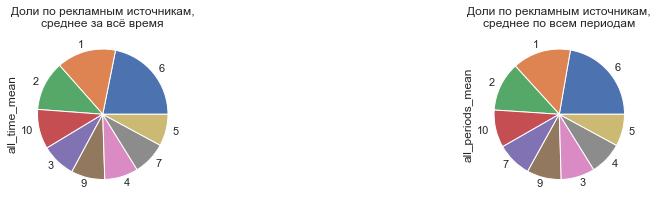

In [40]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='ASL (средняя продолжительность сессий) по дням в мин',
                  values='session_duration',
                  agg='mean',)

Средняя длительность сессии за всё время составляет 12 мин. По устройствам: десктопные 13 мин, мобильные 9 мин. Топ-3 рекламных источников: 6 (27 мин), 1 (18 мин), 2 (15 мин).

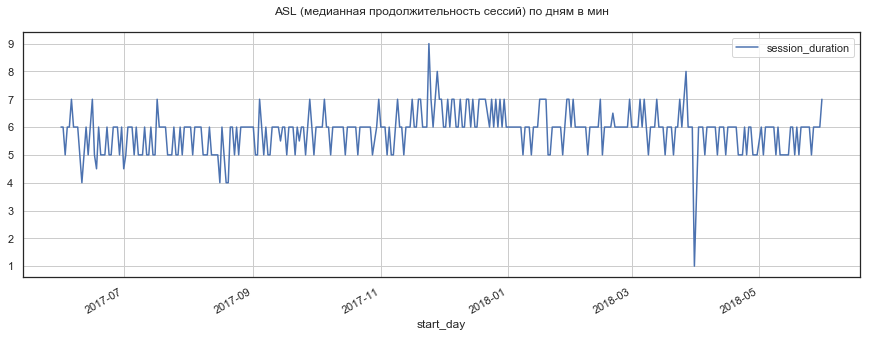

,session_duration
start_day,
2017-06-01,6.0
2017-06-02,6.0
2017-06-03,5.0
2017-06-04,6.0
2017-06-05,6.0
...,...
2018-05-27,6.0
2018-05-28,6.0
2018-05-29,6.0


ASL (медианная продолжительность сессий) по дням в мин за всё время:


,session_duration
all_time_median,6.0
all_periods_median,6.0


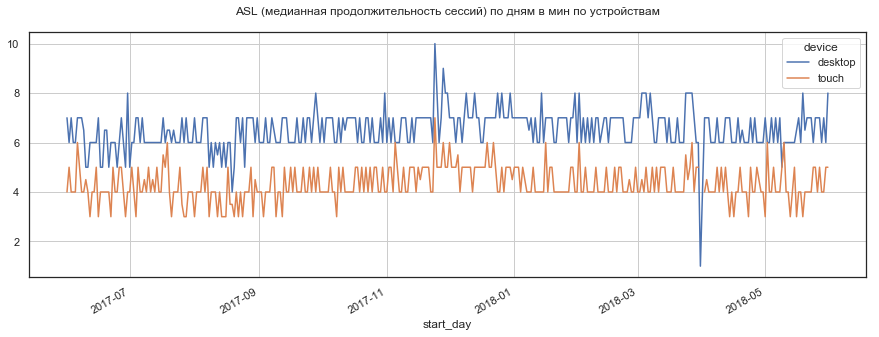

,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-06-01,7.0,4.0,117.0,67.0
2017-06-02,6.0,5.0,100.0,83.0
2017-06-03,7.0,4.0,140.0,80.0
2017-06-04,6.0,4.0,100.0,67.0
2017-06-05,6.0,4.0,100.0,67.0
...,...,...,...,...
2018-05-27,7.0,5.0,117.0,83.0
2018-05-28,6.0,4.0,100.0,67.0
2018-05-29,7.0,4.0,117.0,67.0


ASL (медианная продолжительность сессий) по дням в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,7.0,4.0,117.0,67.0
all_periods_median,7.0,4.0,117.0,67.0


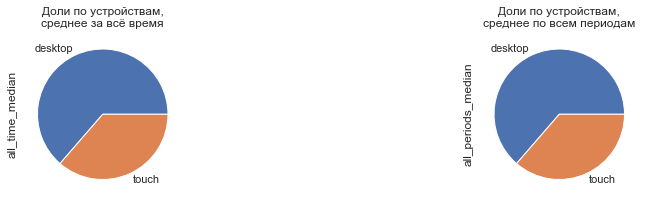

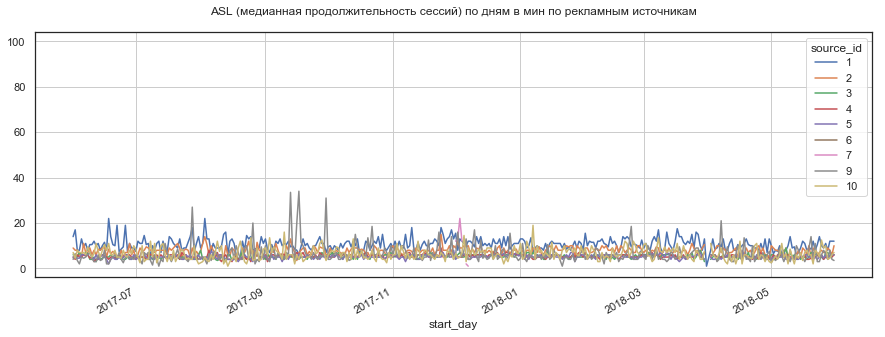

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-06-01,14.0,9.0,6.0,5.0,5.0,NaN,NaN,4.0,7.0,233.0,150.0,100.0,83.0,83.0,NaN,NaN,67.0,117.0
2017-06-02,17.0,8.0,6.0,4.0,5.0,NaN,NaN,6.0,4.0,283.0,133.0,100.0,67.0,83.0,NaN,NaN,108.0,75.0
2017-06-03,8.0,8.0,5.0,6.0,4.0,NaN,NaN,4.0,8.0,160.0,160.0,100.0,120.0,90.0,NaN,NaN,70.0,160.0
2017-06-04,8.0,6.0,7.0,5.0,4.0,NaN,NaN,2.0,7.0,133.0,100.0,117.0,83.0,75.0,NaN,NaN,33.0,117.0
2017-06-05,13.0,5.0,6.0,5.0,6.0,NaN,NaN,5.0,7.0,217.0,83.0,100.0,83.0,100.0,NaN,NaN,83.0,117.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-05-27,11.0,7.0,7.0,5.0,6.0,NaN,NaN,6.0,10.0,183.0,117.0,117.0,83.0,100.0,NaN,NaN,108.0,167.0
2018-05-28,8.0,9.0,7.0,6.0,4.0,NaN,NaN,4.0,4.0,133.0,150.0,117.0,92.0,67.0,NaN,NaN,67.0,67.0
2018-05-29,12.0,8.0,5.0,5.0,6.0,NaN,NaN,8.0,4.0,200.0,133.0,83.0,83.0,92.0,NaN,NaN,133.0,75.0


ASL (медианная продолжительность сессий) по дням в мин за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_median,11.0,8.0,5.0,5.0,5.0,8.0,3.0,5.0,6.0,183.0,133.0,83.0,83.0,83.0,133.0,50.0,83.0,100.0
all_periods_median,10.0,8.0,5.0,5.0,5.0,8.0,3.0,5.0,6.0,175.0,133.0,83.0,83.0,83.0,133.0,50.0,83.0,100.0


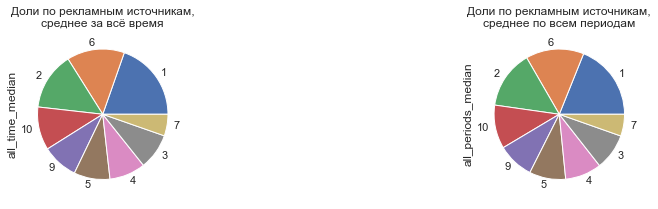

In [41]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='ASL (медианная продолжительность сессий) по дням в мин',
                  values='session_duration',
                  agg='median',)

Медианная длительность сессии за всё время составляет 6 мин. По устройствам: десктопные 7 мин, мобильные 4 мин. Топ-3 рекламных источников: 1 (11 мин), 6 (8 мин), 2 (8 мин).

ASL (средняя продолжительность сессий по дням) в мин на дату 2017-09-22
Распределение данных за период:


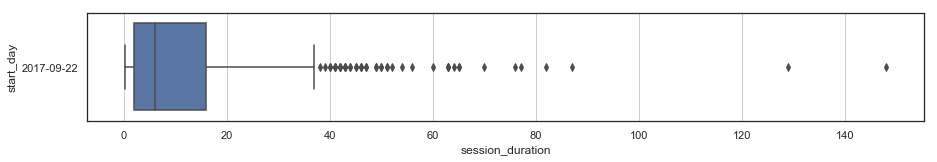

,session_duration
start_day,
2017-09-22,12.0


ASL (средняя продолжительность сессий по дням) в мин на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-09-22,13.0,8.0,109.0,70.0


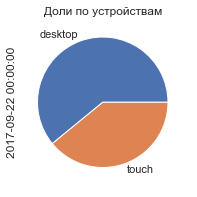

ASL (средняя продолжительность сессий по дням) в мин на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-09-22,16.0,14.0,11.0,11.0,11.0,NaN,20.0,11.0,12.0,137.0,119.0,90.0,92.0,92.0,NaN,169.0,96.0,105.0


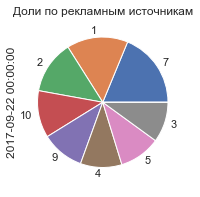

In [42]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='ASL (средняя продолжительность сессий по дням) в мин на дату',
                  values='session_duration',
                  agg='mean',
                  date='2017-09-22',)

ASL (медианная продолжительность сессий по дням) в мин на дату 2017-09-22
Распределение данных за период:


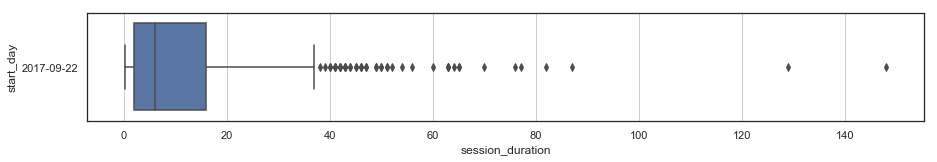

,session_duration
start_day,
2017-09-22,6.0


ASL (медианная продолжительность сессий по дням) в мин на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_day,,,,
2017-09-22,7.0,5.0,117.0,83.0


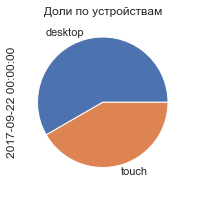

ASL (медианная продолжительность сессий по дням) в мин на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_day,,,,,,,,,,,,,,,,,,
2017-09-22,9.0,8.0,6.0,6.0,5.0,NaN,20.0,6.0,5.0,150.0,125.0,100.0,100.0,83.0,NaN,333.0,92.0,83.0


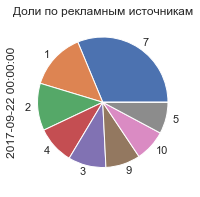

In [43]:
values_by_periods(table=visits_advance,
                  period='start_day',
                  title='ASL (медианная продолжительность сессий по дням) в мин на дату',
                  values='session_duration',
                  agg='median',
                  date='2017-09-22',)

#### Продукт: сколько длится одна сессия? (недели)

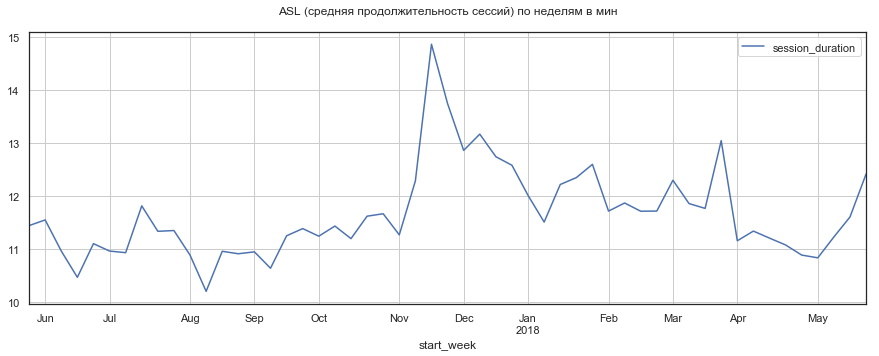

,session_duration
start_week,
2017-05-29,11.0
2017-06-05,12.0
2017-06-12,11.0
2017-06-19,10.0
2017-06-26,11.0
2017-07-03,11.0
2017-07-10,11.0
2017-07-17,12.0
2017-07-24,11.0


ASL (средняя продолжительность сессий) по неделям в мин за всё время:


,session_duration
all_time_mean,12.0
all_periods_mean,12.0


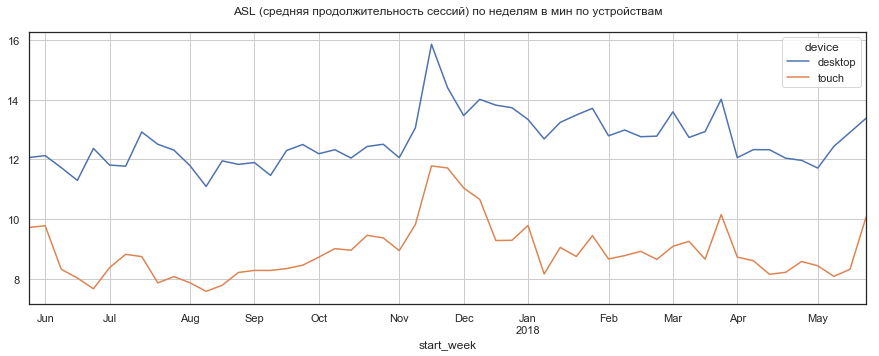

,desktop,touch,desktop_%,touch_%
start_week,,,,
2017-05-29,12.0,10.0,105.0,85.0
2017-06-05,12.0,10.0,105.0,85.0
2017-06-12,12.0,8.0,107.0,76.0
2017-06-19,11.0,8.0,108.0,77.0
2017-06-26,12.0,8.0,111.0,69.0
2017-07-03,12.0,8.0,108.0,76.0
2017-07-10,12.0,9.0,108.0,81.0
2017-07-17,13.0,9.0,109.0,74.0
2017-07-24,13.0,8.0,110.0,69.0


ASL (средняя продолжительность сессий) по неделям в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,13.0,9.0,108.0,77.0
all_periods_mean,13.0,9.0,108.0,76.0


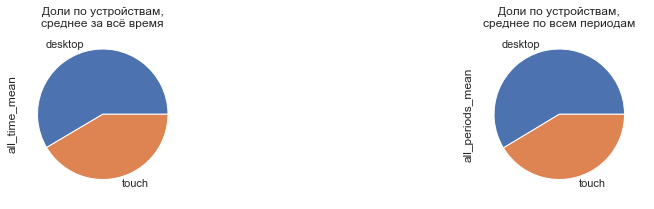

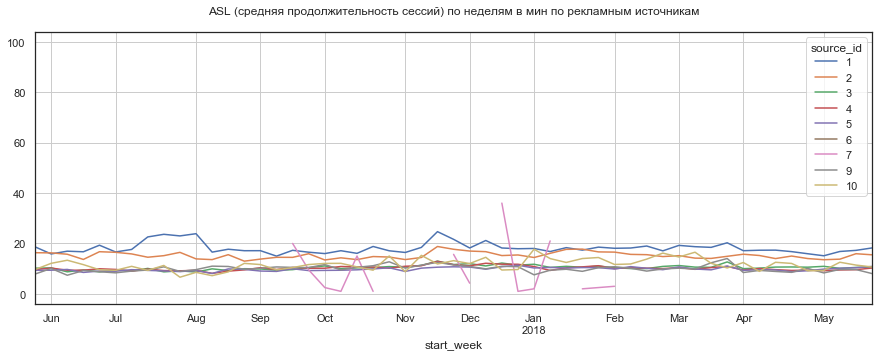

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_week,,,,,,,,,,,,,,,,,,
2017-05-29,19.0,16.0,10.0,10.0,9.0,NaN,NaN,8.0,10.0,163.0,143.0,89.0,84.0,82.0,NaN,NaN,69.0,84.0
2017-06-05,16.0,16.0,10.0,10.0,9.0,NaN,3.0,10.0,12.0,137.0,141.0,89.0,89.0,81.0,NaN,26.0,87.0,105.0
2017-06-12,17.0,16.0,9.0,9.0,10.0,NaN,NaN,7.0,13.0,154.0,143.0,80.0,85.0,88.0,NaN,NaN,67.0,122.0
2017-06-19,17.0,14.0,9.0,9.0,9.0,NaN,2.0,9.0,12.0,159.0,130.0,91.0,90.0,81.0,NaN,19.0,88.0,111.0
2017-06-26,19.0,17.0,9.0,10.0,9.0,6.0,NaN,9.0,10.0,174.0,151.0,78.0,90.0,82.0,54.0,NaN,79.0,86.0
2017-07-03,17.0,16.0,9.0,10.0,9.0,NaN,7.0,8.0,9.0,152.0,150.0,86.0,88.0,82.0,NaN,64.0,76.0,85.0
2017-07-10,18.0,16.0,9.0,9.0,10.0,NaN,NaN,9.0,11.0,161.0,145.0,83.0,83.0,88.0,NaN,NaN,83.0,100.0
2017-07-17,23.0,15.0,10.0,10.0,9.0,NaN,NaN,9.0,9.0,191.0,123.0,85.0,83.0,79.0,NaN,NaN,80.0,79.0
2017-07-24,24.0,15.0,9.0,9.0,9.0,NaN,7.0,11.0,11.0,208.0,134.0,77.0,81.0,80.0,NaN,62.0,94.0,99.0


ASL (средняя продолжительность сессий) по неделям в мин за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_mean,18.0,15.0,11.0,10.0,10.0,27.0,10.0,10.0,12.0,154.0,130.0,90.0,88.0,83.0,230.0,87.0,88.0,104.0
all_periods_mean,18.0,15.0,10.0,10.0,10.0,27.0,12.0,10.0,12.0,156.0,131.0,89.0,87.0,84.0,235.0,100.0,86.0,100.0


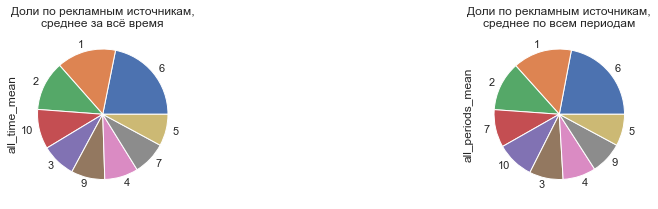

In [44]:
values_by_periods(table=visits_advance,
                  period='start_week',
                  title='ASL (средняя продолжительность сессий) по неделям в мин',
                  values='session_duration',
                  agg='mean')

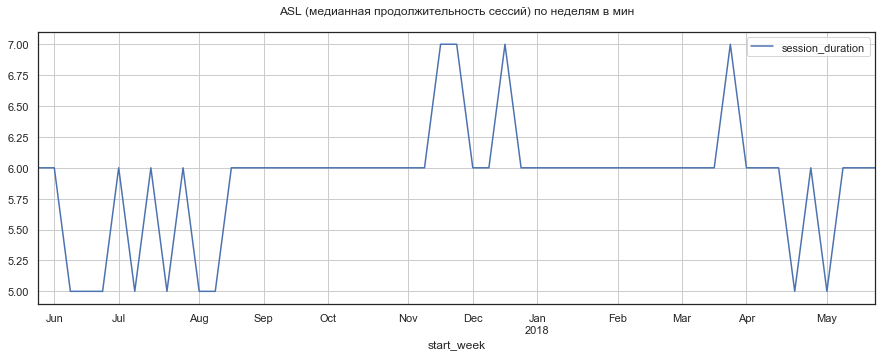

,session_duration
start_week,
2017-05-29,6.0
2017-06-05,6.0
2017-06-12,5.0
2017-06-19,5.0
2017-06-26,5.0
2017-07-03,6.0
2017-07-10,5.0
2017-07-17,6.0
2017-07-24,5.0


ASL (медианная продолжительность сессий) по неделям в мин за всё время:


,session_duration
all_time_median,6.0
all_periods_median,6.0


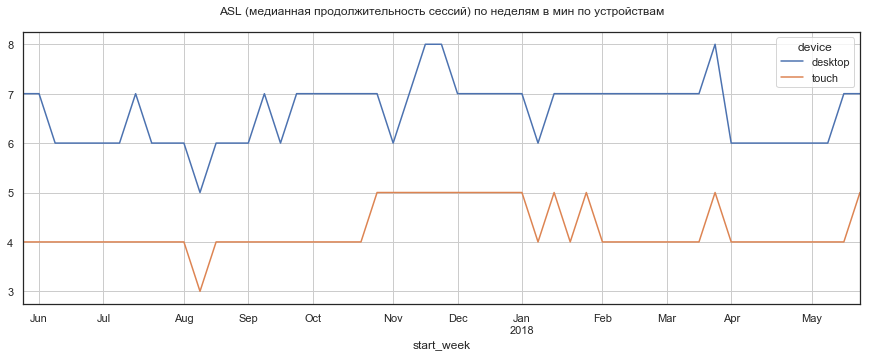

,desktop,touch,desktop_%,touch_%
start_week,,,,
2017-05-29,7.0,4.0,117.0,67.0
2017-06-05,7.0,4.0,117.0,67.0
2017-06-12,6.0,4.0,120.0,80.0
2017-06-19,6.0,4.0,120.0,80.0
2017-06-26,6.0,4.0,120.0,80.0
2017-07-03,6.0,4.0,100.0,67.0
2017-07-10,6.0,4.0,120.0,80.0
2017-07-17,7.0,4.0,117.0,67.0
2017-07-24,6.0,4.0,120.0,80.0


ASL (медианная продолжительность сессий) по неделям в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,7.0,4.0,117.0,67.0
all_periods_median,7.0,4.0,117.0,67.0


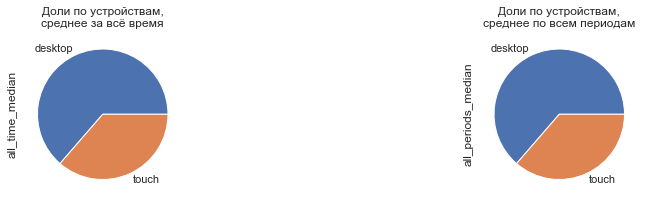

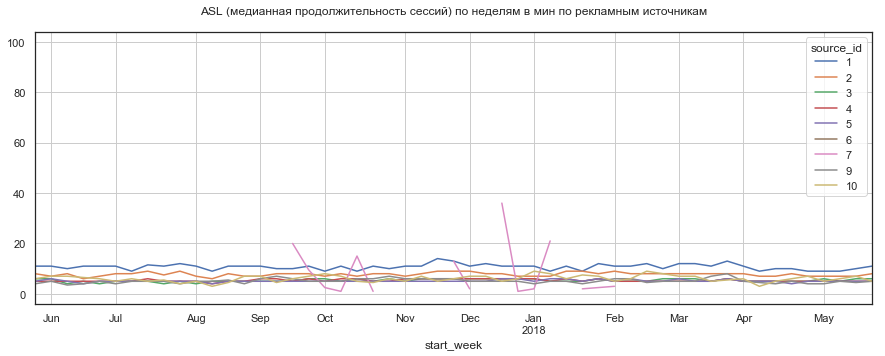

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_week,,,,,,,,,,,,,,,,,,
2017-05-29,11.0,8.0,6.0,5.0,5.0,NaN,NaN,4.0,6.0,183.0,133.0,100.0,83.0,83.0,NaN,NaN,67.0,100.0
2017-06-05,11.0,7.0,6.0,5.0,6.0,NaN,3.0,5.0,7.0,183.0,117.0,100.0,83.0,100.0,NaN,50.0,83.0,117.0
2017-06-12,10.0,8.0,4.0,5.0,5.0,NaN,NaN,4.0,7.0,200.0,160.0,80.0,100.0,100.0,NaN,NaN,70.0,140.0
2017-06-19,11.0,6.0,5.0,5.0,4.0,NaN,2.0,4.0,6.0,220.0,120.0,100.0,100.0,80.0,NaN,40.0,80.0,130.0
2017-06-26,11.0,7.0,4.0,5.0,5.0,6.0,NaN,5.0,6.0,220.0,140.0,80.0,100.0,100.0,120.0,NaN,100.0,120.0
2017-07-03,11.0,8.0,5.0,5.0,5.0,NaN,7.0,4.0,5.0,183.0,133.0,83.0,83.0,83.0,NaN,117.0,67.0,83.0
2017-07-10,9.0,8.0,5.0,5.0,5.0,NaN,NaN,5.0,6.0,180.0,160.0,100.0,100.0,100.0,NaN,NaN,100.0,120.0
2017-07-17,12.0,9.0,5.0,6.0,5.0,NaN,NaN,5.0,5.0,192.0,150.0,83.0,100.0,83.0,NaN,NaN,83.0,83.0
2017-07-24,11.0,8.0,4.0,5.0,5.0,NaN,7.0,5.0,6.0,220.0,150.0,80.0,100.0,100.0,NaN,140.0,100.0,110.0


ASL (медианная продолжительность сессий) по неделям в мин за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_median,11.0,8.0,5.0,5.0,5.0,8.0,3.0,5.0,6.0,183.0,133.0,83.0,83.0,83.0,133.0,50.0,83.0,100.0
all_periods_median,11.0,8.0,5.0,5.0,5.0,8.0,3.0,5.0,6.0,183.0,133.0,83.0,83.0,83.0,133.0,50.0,83.0,100.0


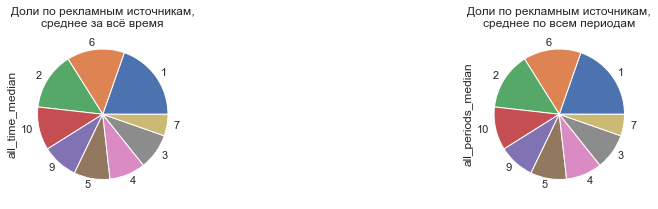

In [45]:
values_by_periods(table=visits_advance,
                  period='start_week',
                  title='ASL (медианная продолжительность сессий) по неделям в мин',
                  values='session_duration',
                  agg='median')

ASL (средняя продолжительность сесси)й по неделям в мин на дату 2017-09-22
Распределение данных за период:


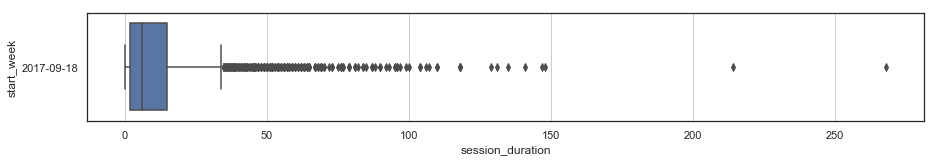

,session_duration
start_week,
2017-09-18,11.0


ASL (средняя продолжительность сесси)й по неделям в мин на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_week,,,,
2017-09-18,12.0,8.0,109.0,74.0


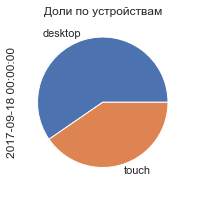

ASL (средняя продолжительность сесси)й по неделям в мин на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_week,,,,,,,,,,,,,,,,,,
2017-09-18,17.0,14.0,10.0,10.0,10.0,NaN,20.0,10.0,10.0,153.0,129.0,85.0,93.0,89.0,NaN,178.0,93.0,93.0


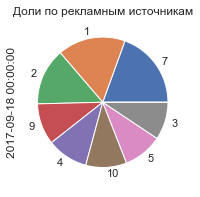

In [46]:
values_by_periods(table=visits_advance,
                  period='start_week',
                  title='ASL (средняя продолжительность сесси)й по неделям в мин на дату',
                  values='session_duration',
                  agg='mean',
                  date='2017-09-22',)

ASL (медианная продолжительность сессий) по неделям в мин на дату 2017-09-22
Распределение данных за период:


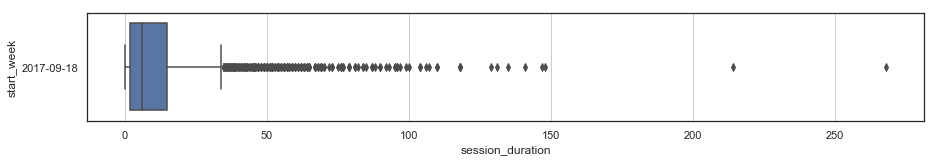

,session_duration
start_week,
2017-09-18,6.0


ASL (медианная продолжительность сессий) по неделям в мин на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_week,,,,
2017-09-18,6.0,4.0,100.0,67.0


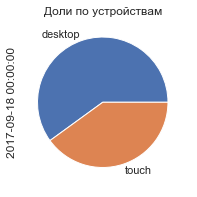

ASL (медианная продолжительность сессий) по неделям в мин на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_week,,,,,,,,,,,,,,,,,,
2017-09-18,10.0,8.0,5.0,5.0,5.0,NaN,20.0,6.0,6.0,167.0,133.0,83.0,83.0,83.0,NaN,333.0,100.0,100.0


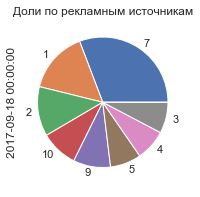

In [47]:
values_by_periods(table=visits_advance,
                  period='start_week',
                  title='ASL (медианная продолжительность сессий) по неделям в мин на дату',
                  values='session_duration',
                  agg='median',
                  date='2017-09-22',)

#### Продукт: сколько длится одна сессия? (месяцы)

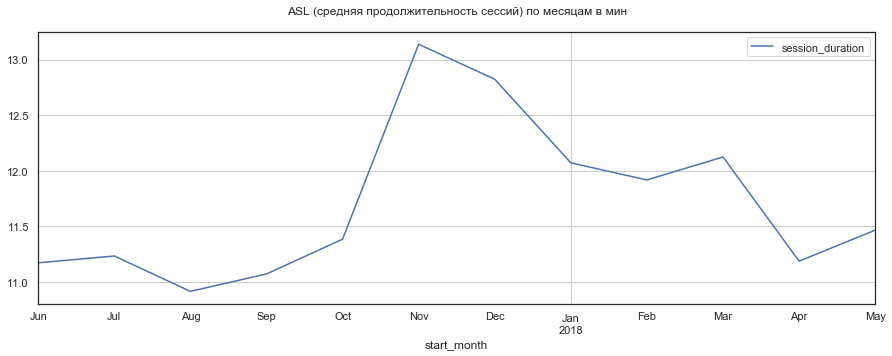

,session_duration
start_month,
2017-06-01,11.0
2017-07-01,11.0
2017-08-01,11.0
2017-09-01,11.0
2017-10-01,11.0
2017-11-01,13.0
2017-12-01,13.0
2018-01-01,12.0
2018-02-01,12.0


ASL (средняя продолжительность сессий) по месяцам в мин за всё время:


,session_duration
all_time_mean,12.0
all_periods_mean,12.0


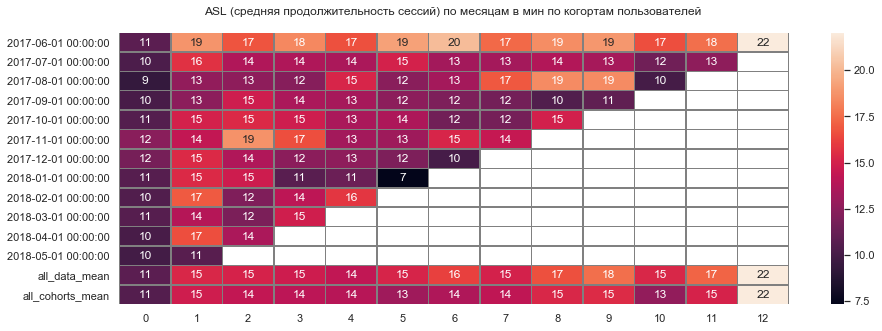

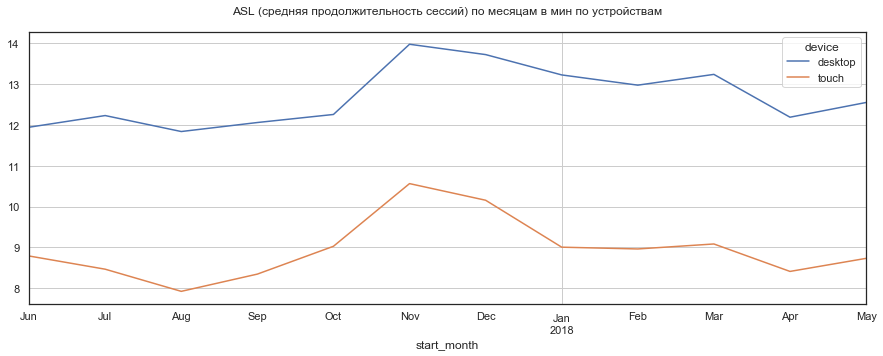

,desktop,touch,desktop_%,touch_%
start_month,,,,
2017-06-01,12.0,9.0,107.0,79.0
2017-07-01,12.0,8.0,109.0,75.0
2017-08-01,12.0,8.0,108.0,73.0
2017-09-01,12.0,8.0,109.0,75.0
2017-10-01,12.0,9.0,108.0,79.0
2017-11-01,14.0,11.0,106.0,80.0
2017-12-01,14.0,10.0,107.0,79.0
2018-01-01,13.0,9.0,110.0,75.0
2018-02-01,13.0,9.0,109.0,75.0


ASL (средняя продолжительность сессий) по месяцам в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,13.0,9.0,108.0,77.0
all_periods_mean,13.0,9.0,108.0,76.0


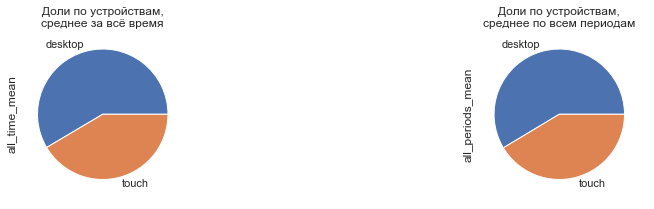

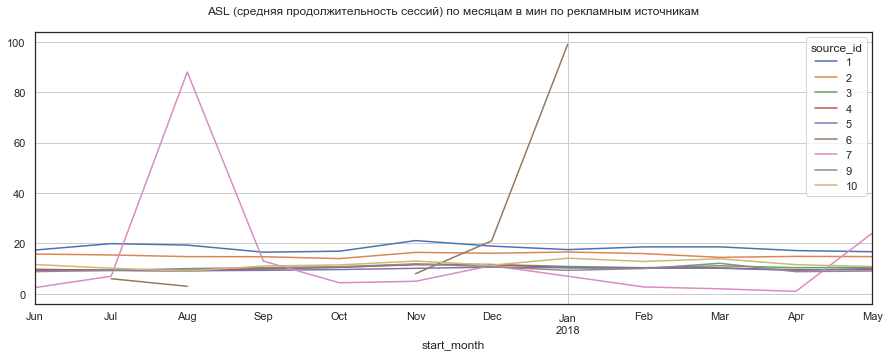

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_month,,,,,,,,,,,,,,,,,,
2017-06-01,17.0,16.0,10.0,10.0,9.0,NaN,2.0,9.0,12.0,156.0,141.0,86.0,87.0,82.0,NaN,22.0,79.0,104.0
2017-07-01,20.0,15.0,9.0,9.0,9.0,6.0,7.0,9.0,10.0,177.0,137.0,83.0,84.0,82.0,53.0,62.0,83.0,90.0
2017-08-01,19.0,15.0,9.0,9.0,9.0,3.0,88.0,10.0,9.0,177.0,135.0,87.0,83.0,84.0,27.0,806.0,92.0,83.0
2017-09-01,17.0,15.0,10.0,10.0,9.0,NaN,13.0,10.0,11.0,149.0,133.0,88.0,91.0,84.0,NaN,117.0,94.0,100.0
2017-10-01,17.0,14.0,11.0,11.0,10.0,NaN,4.0,11.0,11.0,149.0,123.0,92.0,93.0,85.0,NaN,39.0,95.0,101.0
2017-11-01,21.0,16.0,12.0,12.0,10.0,8.0,5.0,12.0,13.0,161.0,125.0,89.0,88.0,77.0,61.0,38.0,91.0,99.0
2017-12-01,19.0,16.0,12.0,12.0,11.0,21.0,11.0,11.0,11.0,148.0,126.0,91.0,90.0,83.0,164.0,88.0,84.0,89.0
2018-01-01,18.0,17.0,11.0,10.0,10.0,99.0,7.0,9.0,14.0,145.0,138.0,90.0,86.0,86.0,820.0,58.0,77.0,117.0
2018-02-01,19.0,16.0,10.0,10.0,10.0,NaN,3.0,10.0,13.0,156.0,134.0,87.0,87.0,85.0,NaN,23.0,84.0,108.0


ASL (средняя продолжительность сессий) по месяцам в мин за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_mean,18.0,15.0,11.0,10.0,10.0,27.0,10.0,10.0,12.0,154.0,130.0,90.0,88.0,83.0,230.0,87.0,88.0,104.0
all_periods_mean,18.0,15.0,10.0,10.0,10.0,27.0,14.0,10.0,12.0,156.0,131.0,89.0,87.0,84.0,234.0,119.0,86.0,100.0


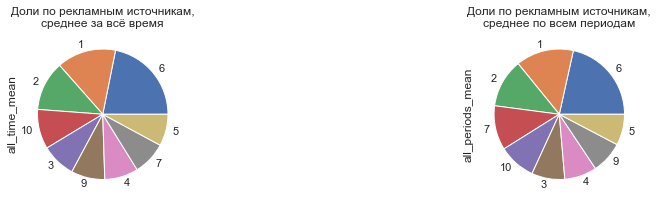

In [48]:
values_by_periods(table=visits_advance,
                  period='start_month',
                  title='ASL (средняя продолжительность сессий) по месяцам в мин',
                  values='session_duration',
                  agg='mean',
                  show_cohorts=True,)

Средняя длительность сессии по когортам пользователей увеличивается со временем с 11 до 22 мин.

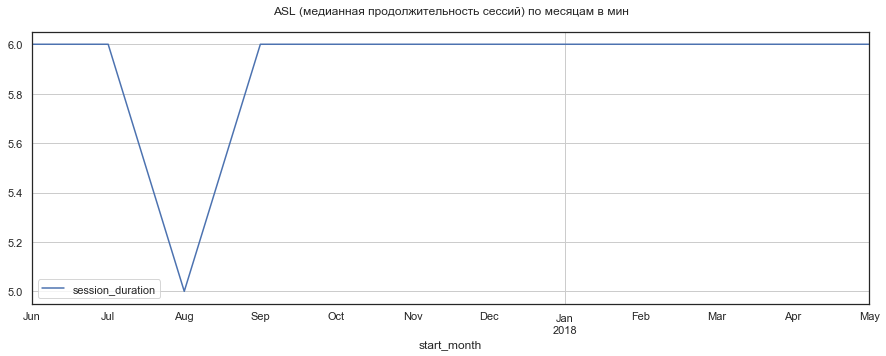

,session_duration
start_month,
2017-06-01,6.0
2017-07-01,6.0
2017-08-01,5.0
2017-09-01,6.0
2017-10-01,6.0
2017-11-01,6.0
2017-12-01,6.0
2018-01-01,6.0
2018-02-01,6.0


ASL (медианная продолжительность сессий) по месяцам в мин за всё время:


,session_duration
all_time_median,6.0
all_periods_median,6.0


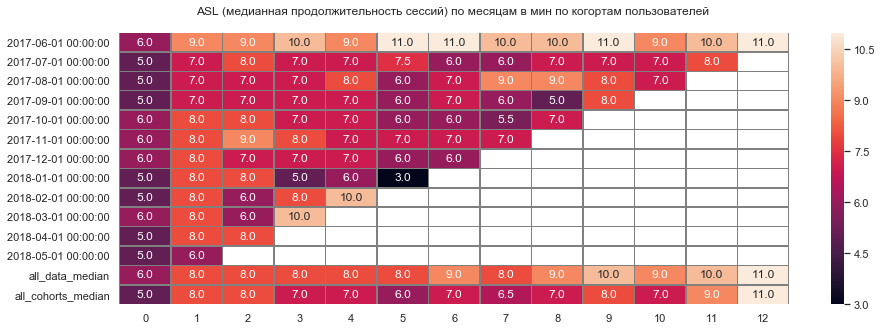

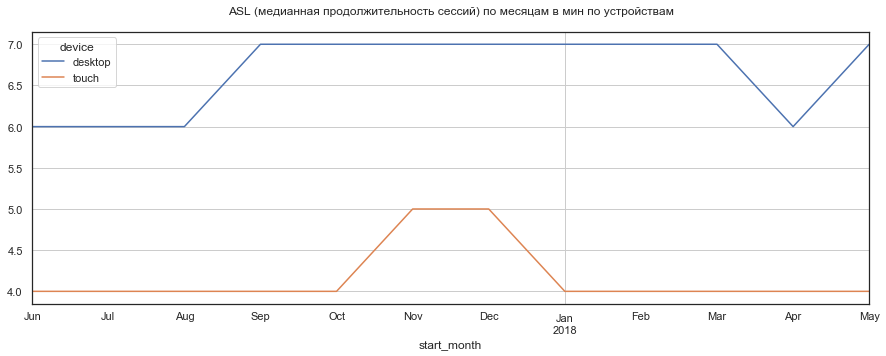

,desktop,touch,desktop_%,touch_%
start_month,,,,
2017-06-01,6.0,4.0,100.0,66.7
2017-07-01,6.0,4.0,100.0,66.7
2017-08-01,6.0,4.0,120.0,80.0
2017-09-01,7.0,4.0,116.7,66.7
2017-10-01,7.0,4.0,116.7,66.7
2017-11-01,7.0,5.0,116.7,83.3
2017-12-01,7.0,5.0,116.7,83.3
2018-01-01,7.0,4.0,116.7,66.7
2018-02-01,7.0,4.0,116.7,66.7


ASL (медианная продолжительность сессий) по месяцам в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,7.0,4.0,116.7,66.7
all_periods_median,7.0,4.0,116.7,66.7


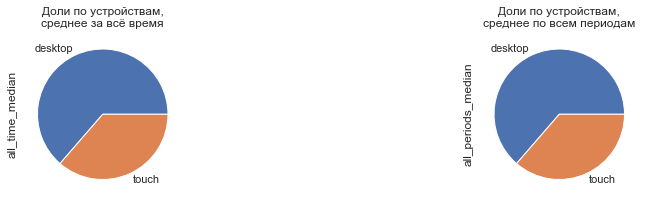

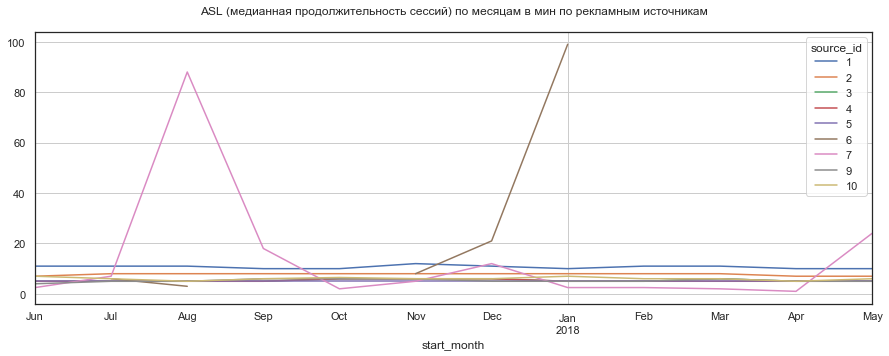

,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_month,,,,,,,,,,,,,,,,,,
2017-06-01,11.0,7.0,5.0,5.0,5.0,NaN,2.5,4.0,7.0,183.3,116.7,83.3,83.3,83.3,NaN,41.7,66.7,116.7
2017-07-01,11.0,8.0,5.0,5.0,5.0,6.0,7.0,5.0,6.0,183.3,133.3,83.3,83.3,83.3,100.0,116.7,83.3,100.0
2017-08-01,11.0,8.0,5.0,5.0,5.0,3.0,88.0,5.0,5.0,220.0,160.0,100.0,100.0,100.0,60.0,1760.0,100.0,100.0
2017-09-01,10.0,8.0,5.0,5.0,5.0,NaN,18.0,6.0,6.0,166.7,133.3,83.3,83.3,83.3,NaN,300.0,100.0,100.0
2017-10-01,10.0,8.0,6.0,6.0,5.0,NaN,2.0,6.0,6.5,166.7,133.3,100.0,100.0,83.3,NaN,33.3,100.0,108.3
2017-11-01,12.0,8.0,6.0,6.0,5.0,8.0,5.0,6.0,6.0,200.0,133.3,100.0,100.0,83.3,133.3,83.3,100.0,100.0
2017-12-01,11.0,8.0,6.0,6.0,5.0,21.0,12.0,5.0,6.0,183.3,133.3,100.0,100.0,83.3,350.0,200.0,83.3,100.0
2018-01-01,10.0,8.0,5.0,5.0,5.0,99.0,2.5,5.0,7.0,166.7,133.3,83.3,83.3,83.3,1650.0,41.7,83.3,116.7
2018-02-01,11.0,8.0,5.0,5.0,5.0,NaN,2.5,5.0,6.0,183.3,133.3,83.3,83.3,83.3,NaN,41.7,83.3,100.0


ASL (медианная продолжительность сессий) по месяцам в мин за всё время по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
all_time_median,11.0,8.0,5.0,5.0,5.0,8.0,3.0,5.0,6.0,183.3,133.3,83.3,83.3,83.3,133.3,50.0,83.3,100.0
all_periods_median,11.0,8.0,5.0,5.0,5.0,8.0,3.8,5.0,6.0,183.3,133.3,83.3,83.3,83.3,133.3,62.5,83.3,100.0


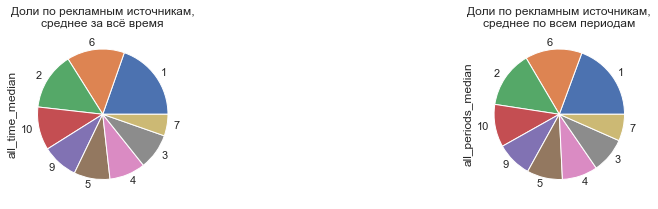

In [49]:
values_by_periods(table=visits_advance,
                  period='start_month',
                  title='ASL (медианная продолжительность сессий) по месяцам в мин',
                  values='session_duration',
                  agg='median',
                  round=1,
                  show_cohorts=True,)

Медианная длительность сессии по когортам пользователей увеличивается со временем с 6 до 11 мин.

ASL (средняя продолжительность сессий) по месяцам в мин на дату 2017-09-22
Распределение данных за период:


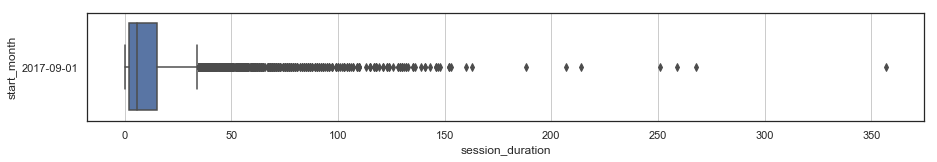

,session_duration
start_month,
2017-09-01,11.0


ASL (средняя продолжительность сессий) по месяцам в мин на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_month,,,,
2017-09-01,12.0,8.0,109.0,75.0


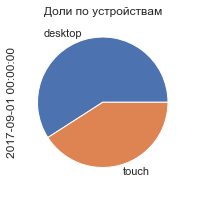

ASL (средняя продолжительность сессий) по месяцам в мин на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_month,,,,,,,,,,,,,,,,,,
2017-09-01,17.0,15.0,10.0,10.0,9.0,NaN,13.0,10.0,11.0,149.0,133.0,88.0,91.0,84.0,NaN,117.0,94.0,100.0


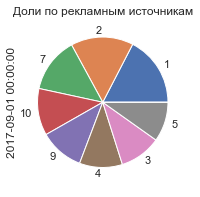

In [50]:
values_by_periods(table=visits_advance,
                  period='start_month',
                  title='ASL (средняя продолжительность сессий) по месяцам в мин на дату',
                  values='session_duration',
                  agg='mean',
                  date='2017-09-22',)

ASL (медианная продолжительность сессий) по месяцам в мин на дату 2017-09-22
Распределение данных за период:


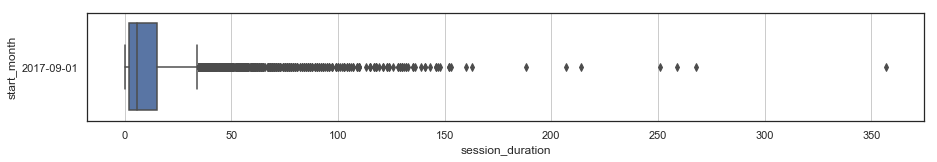

,session_duration
start_month,
2017-09-01,6.0


ASL (медианная продолжительность сессий) по месяцам в мин на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
start_month,,,,
2017-09-01,7.0,4.0,117.0,67.0


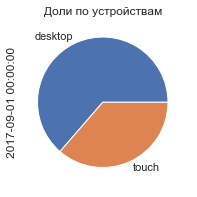

ASL (медианная продолжительность сессий) по месяцам в мин на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,6,7,9,10,1_%,2_%,3_%,4_%,5_%,6_%,7_%,9_%,10_%
start_month,,,,,,,,,,,,,,,,,,
2017-09-01,10.0,8.0,5.0,5.0,5.0,NaN,18.0,6.0,6.0,167.0,133.0,83.0,83.0,83.0,NaN,300.0,100.0,100.0


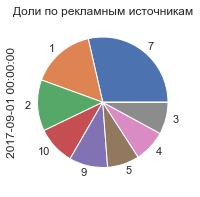

In [51]:
values_by_periods(table=visits_advance,
                  period='start_month',
                  title='ASL (медианная продолжительность сессий) по месяцам в мин на дату',
                  values='session_duration',
                  agg='median',
                  date='2017-09-22',)

#### Продукт: сколько длится одна сессия? Вывод

Средняя длительность сессии за всё время составляет 12 мин. По устройствам: десктопные 13 мин, мобильные 9 мин. Топ-3 рекламных источников: 6 (27 мин), 1 (18 мин), 2 (15 мин).

Медианная длительность сессии за всё время составляет 6 мин. По устройствам: десктопные 7 мин, мобильные 4 мин. Топ-3 рекламных источников: 1 (11 мин), 6 (8 мин), 2 (8 мин).

Средняя длительность сессии по когортам пользователей увеличивается со временем с 11 до 22 мин.

Медианная длительность сессии по когортам пользователей увеличивается со временем с 6 до 11 мин.

### Продукт: как часто люди возвращаются?

In [52]:
# функция вывода показателей по когортам
def cohorts(table=visits_advance,
            table_costs=costs_advance_all_visitors,
            query='',
            metrics='rt',
            period='start_month',
            title='по месяцам',
            title_6_months='',
            heatmap=True,):   
    
    def fail():
        print('There are no much values to calculate', '\n')
    
    if query != '':
        table = table.query(query)
        
    if metrics == 'rt':
        if 'week' in period:
            period = 'week'
        elif 'month' in period:
            period = 'month'
        else:
            return 'There is a strange period'
        cohorts = (table
                   .groupby([f'first_start_{period}',f'cohort_lifetime_{period}'])
                   .agg({'uid':'nunique'}).reset_index())
        initial_users_count = cohorts.query(f'cohort_lifetime_{period} == 0')[[f'first_start_{period}','uid']]        
        initial_users_count.rename(columns={'uid': 'cohort_users'}, inplace=True)
        cohorts = cohorts.merge(initial_users_count,on=f'first_start_{period}')        
        cohorts['retention'] = cohorts['uid'] / cohorts['cohort_users']
        title = f'Retention Rate (доля вернувшихся пользователей) {title} в процентах:'
        try:
            pivot = (cohorts
                     .pivot_table(index=f'first_start_{period}',
                         columns=f'cohort_lifetime_{period}', values='retention', aggfunc='sum')
                     .drop(columns=0))
            pivot.loc['all_table_mean'] = pivot.mean(axis=0)
            for col in pivot.columns:
                pivot.loc['all_data_mean', col] = (cohorts
                                                   [cohorts[f'cohort_lifetime_{period}'] == col]
                                                   ['retention']
                                                   .mean())
            pivot = (pivot * 100).round(1)
            all_table_mean = pivot.loc['all_data_mean'].mean()
        except:
            fail()
            return None
        if pivot.shape[0] != (len(pivot.columns) + 2):
            fail()
            return None
        print(f'Retention Rate (доля вернувшихся пользователей) за всё время: {all_table_mean:.1f}')
    if metrics in ['ltv', 'romi', 'cac']:
        if metrics in ['cac', 'romi'] and query != '':
            table_costs = table_costs.query(query)
        if metrics == 'romi':
            revenue_total = table['revenue'].sum()
            costs_total = table_costs['costs'].sum()
            romi_total = revenue_total / costs_total
            print(f'ROMI за всё время {romi_total:.2f}')
        title_period = 'месяцев'
        cohort_sizes = (table
                        .groupby(f'first_{period}')
                        .agg({'uid': 'nunique'})
                        .reset_index()
                        .rename(columns={'uid': 'n_buyers'}))
        cohorts = (table
                   .groupby([f'first_{period}', period])
                   .agg({'revenue': 'sum'})
                   .reset_index())
        try:
            report = pd.merge(cohort_sizes, cohorts, on=f'first_{period}')
            if report.shape[0] < 2:
                fail()
                return None
            report['age'] = (report[period] - report[f'first_{period}']) / np.timedelta64(1, 'M')
            report['age'] = report['age'].round().astype('int')
            report['ltv'] = report['revenue'] / report['n_buyers']
        except:
            fail()
            return None
        if metrics == 'ltv':
            pivot = report.pivot_table(index=f'first_{period}', columns='age',
                                       values='ltv', aggfunc='mean')
            try:
                period6_cum_ltv = pivot.mean(axis=0).cumsum()[11].round(1)
            except:
                fail()
                return None
            pivot.loc['all_cohorts_cumsum'] = pivot.mean(axis=0).cumsum()
            pivot = pivot.round(1)
            print(f'Средний накопительный LTV за 12 {title_period} {title_6_months}:', period6_cum_ltv)
        if metrics in ['cac', 'romi']:
            period_costs = table_costs.groupby('costs_month').agg({'costs': 'sum'})
            report_new = pd.merge(report, period_costs, left_on=f'first_{period}', right_on='costs_month')
            report_new['cac'] = report_new['costs'] / report_new['n_buyers']
        if metrics == 'romi':
            report_new['romi'] = report_new['ltv'] / report_new['cac']
            pivot = report_new.pivot_table(index=f'first_{period}', columns='age',
                                values='romi', aggfunc='mean').cumsum(axis=1).round(2)
            if pivot.shape[0] < 2:
                fail()
                return None
    if heatmap == False:
        print(title)
        display(pivot.fillna(''))
    else:
        plt.figure(figsize=(figsize_small))
        plt.title(f'{title} \n')
        sns.heatmap(pivot, annot=True, linewidths=0.5, linecolor='gray')
        plt.show()

#### Продукт: как часто люди возвращаются? (месячные когорты)

Retention Rate (доля вернувшихся пользователей) за всё время: 3.1


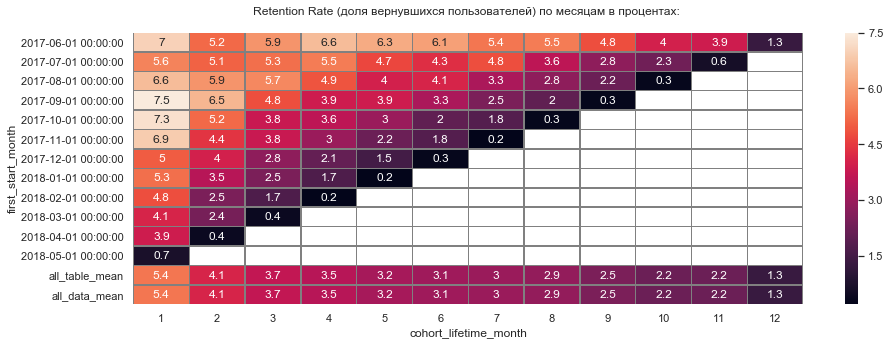

In [53]:
cohorts(table=visits_advance,
        metrics='rt',
        period='start_month',
        title='по месяцам',
        heatmap=True,)

source_id = 1:
Retention Rate (доля вернувшихся пользователей) за всё время: 6.3


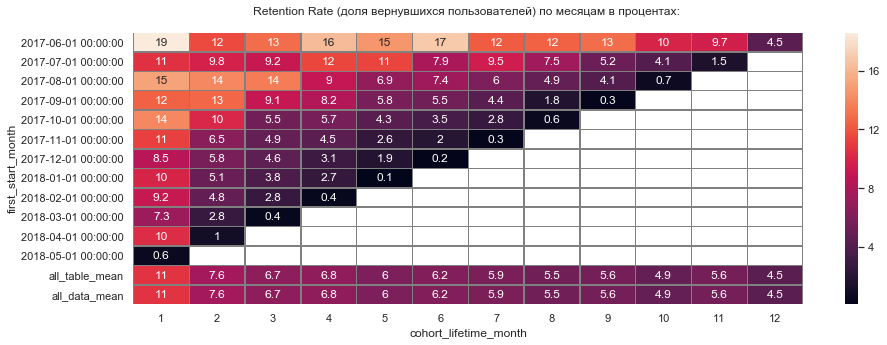

source_id = 2:
Retention Rate (доля вернувшихся пользователей) за всё время: 7.6


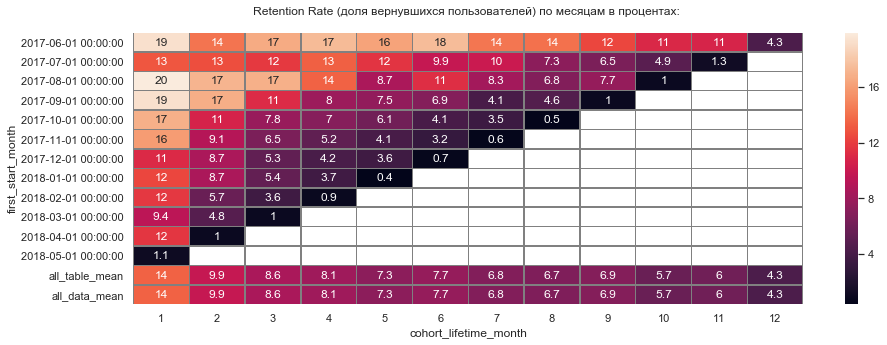

source_id = 3:
Retention Rate (доля вернувшихся пользователей) за всё время: 2.5


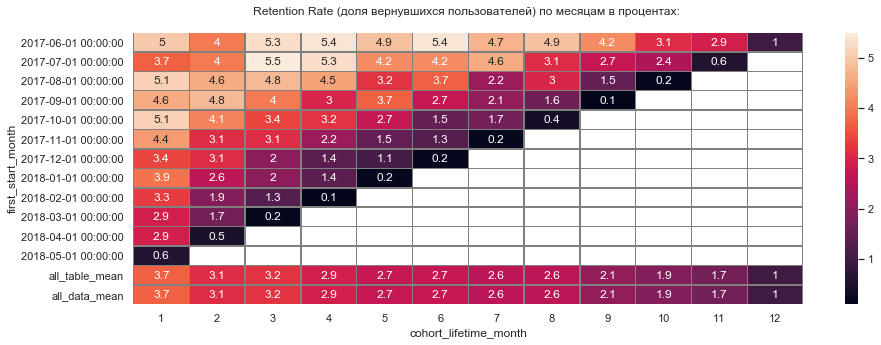

source_id = 4:
Retention Rate (доля вернувшихся пользователей) за всё время: 3.5


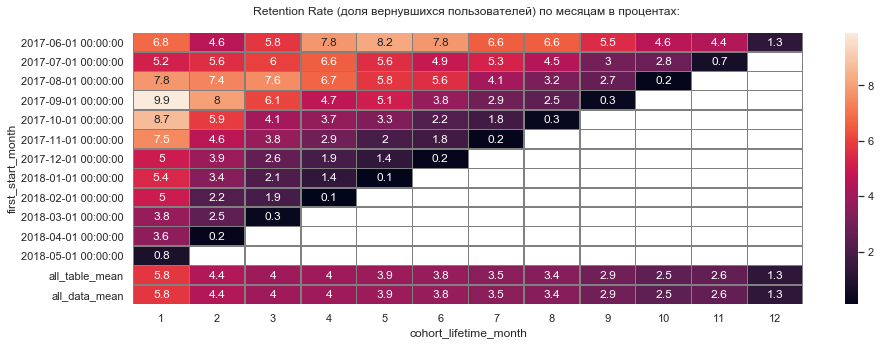

source_id = 5:
Retention Rate (доля вернувшихся пользователей) за всё время: 1.9


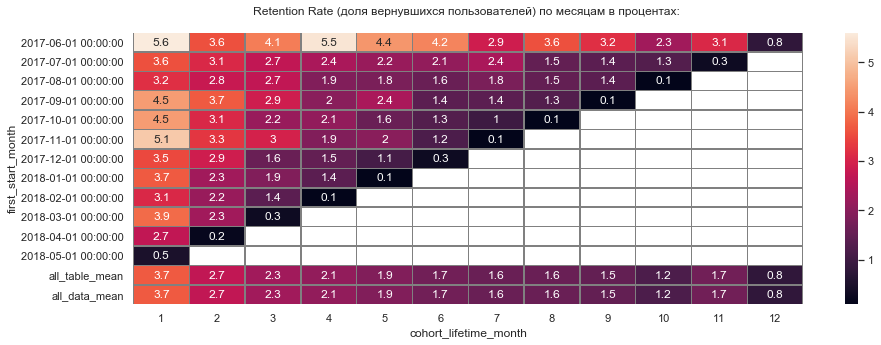

source_id = 6:
There are no much values to calculate 

source_id = 7:
There are no much values to calculate 

source_id = 9:
Retention Rate (доля вернувшихся пользователей) за всё время: 7.8


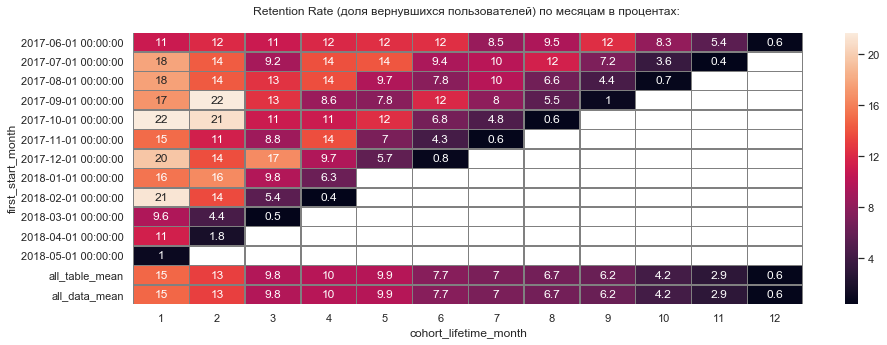

source_id = 10:
Retention Rate (доля вернувшихся пользователей) за всё время: 2.5


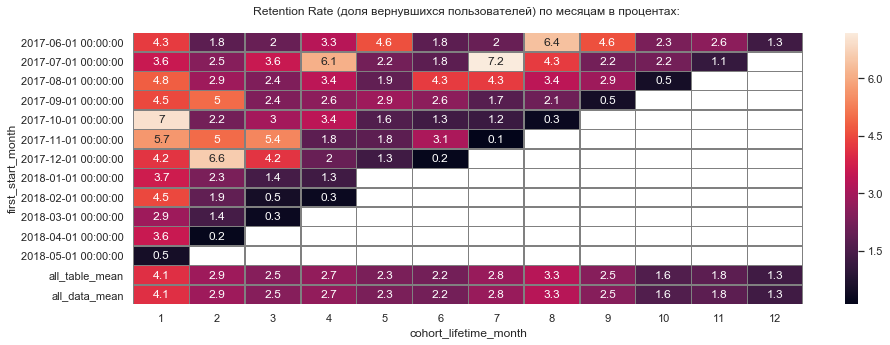

device = desktop:
Retention Rate (доля вернувшихся пользователей) за всё время: 3.3


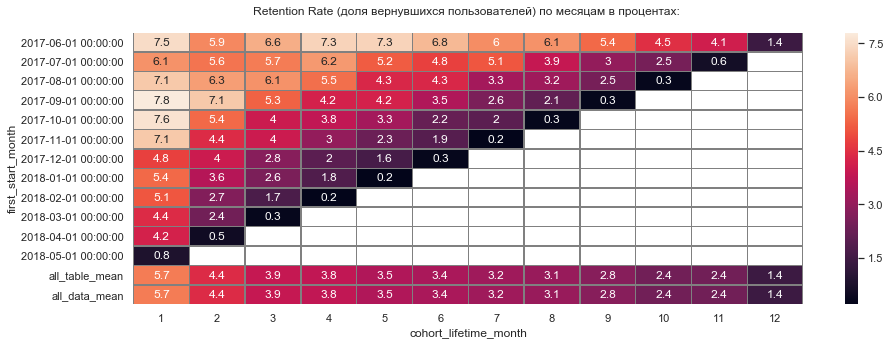

device = touch:
Retention Rate (доля вернувшихся пользователей) за всё время: 2.7


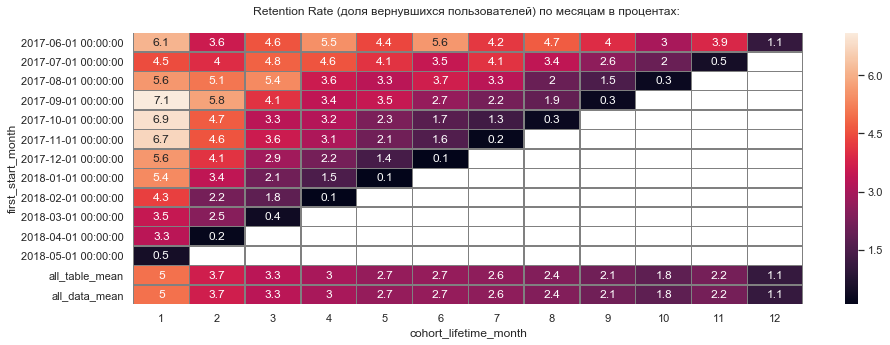

In [54]:
for j in visits_advance['source_id'].sort_values().unique():
    print(f'source_id = {j}:')
    cohorts(table=visits_advance.query('source_id == @j'),
            metrics='rt',
            period='start_month',
            title='по месяцам',
            heatmap=True,)
for j in visits_advance['device'].sort_values().unique():
    print(f'device = {j}:')
    cohorts(table=visits_advance.query('device == @j'),
            metrics='rt',
            period='start_month',
            title='по месяцам',
            heatmap=True,)

#### Продукт: как часто люди возвращаются? Вывод

Доля вернувшихся пользователей уменьшается по всем когортам, в среднем по когортам с 5.4% пользователей на первом месяце использования продукта (именно первом, есть еще нулевой) до 1.3% на двенадцатом месяце.

Топ-3 по доле вернувшихся пользователей по рекламным источникам: 9 (7.8%), 2 (7.6%), 1 (6.3%).

В среднем, чаще возвращаются на десктопах (3.3%), чем на мобильных (2.7%).

### Продукт. Вывод

#### Продукт:  сколько людей пользуются в день, неделю, месяц?

DAU: в среднем по дневным периодам, продуктом пользуются 818 человек в день, из них 73% десктопными и 27% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (30%), 3 (25%), 5 (19%).

В среднем за всё время, продуктом пользуются 569 человек в день, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (25%), 5 (19%).

WAU: в среднем по недельным периодам, продуктом пользуются 5148 человек в неделю, из них 73% десктопными и 28% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (32%), 3 (27%), 5 (20%).

В среднем за всё время, продуктом пользуются 3907 человек в неделю, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

MAU: в среднем по месячным периодам, продуктом пользуются 20956 человек в месяц, из них 73% десктопными и 29% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (33%), 3 (29%), 5 (21%).

В среднем за всё время, продуктом пользуются 17254 человек в месяц, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

За всё время продуктом воспользовались 207051 человек, из них из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

Количество пользователей снижается в 10-30 раз по разным когортам уже через месяц использования продукта.

Количество пользователей в нулевом месяце использования продукта было максимальным в ноябре 17 года (24852), после чего стало снижаться до 13828 в мае 18 года. Падение за этот период составило 44%

#### Продукт:  сколько сессий в день?

В среднем за всё время, количество сессий составляет 889 в день, из них 74% десктопные и 26% мобильные версиии. Топ-3 рекламных источников: 4 (28%), 3 (24%), 5 (18%).

За весь период продуктом воспользовались 238876 раза.

#### Продукт:  сколько длится одна сессия?

Средняя длительность сессии за всё время составляет 12 мин. По устройствам: десктопные 13 мин, мобильные 9 мин. Топ-3 рекламных источников: 6 (27 мин), 1 (18 мин), 2 (15 мин).

Медианная длительность сессии за всё время составляет 6 мин. По устройствам: десктопные 7 мин, мобильные 4 мин. Топ-3 рекламных источников: 1 (11 мин), 6 (8 мин), 2 (8 мин).

Средняя длительность сессии по когортам пользователей увеличивается со временем с 11 до 22 мин.

Медианная длительность сессии по когортам пользователей увеличивается со временем с 6 до 11 мин.

#### Продукт:  как часто люди возвращаются?

Доля вернувшихся пользователей уменьшается по всем когортам, в среднем по когортам с 5.4% пользователей на первом месяце использования продукта (именно первом, есть еще нулевой) до 1.3% на двенадцатом месяце.

Топ-3 по доле вернувшихся пользователей по рекламным источникам: 9 (7.8%), 2 (7.6%), 1 (6.3%).

В среднем, чаще возвращаются на десктопах (3.3%), чем на мобильных (2.7%).

### Продажи: когда люди начинают покупать?

In [55]:
foo = 1 - orders_first_buy_only.shape[0] / orders_advance.shape[0]
print(f'Доля повторных покупок от общего количества покупок {foo:.1%}')

Доля повторных покупок от общего количества покупок 26.5%


#### Продажи: когда люди начинают покупать? (месячные когорты пользователей)

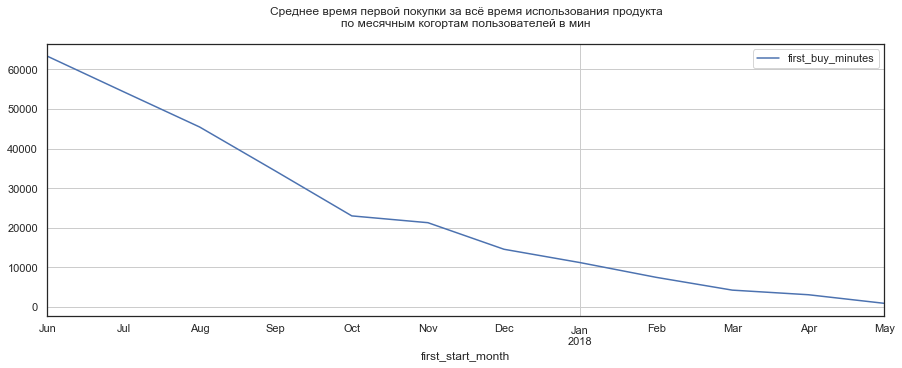

,first_buy_minutes
first_start_month,
2017-06-01,63333.0
2017-07-01,54356.0
2017-08-01,45437.0
2017-09-01,34265.0
2017-10-01,22955.0
2017-11-01,21237.0
2017-12-01,14516.0
2018-01-01,11144.0
2018-02-01,7416.0


Среднее время первой покупки за всё время использования продукта
по месячным когортам пользователей в мин за всё время:


,first_buy_minutes
all_time_mean,22691.0
all_periods_mean,23557.0


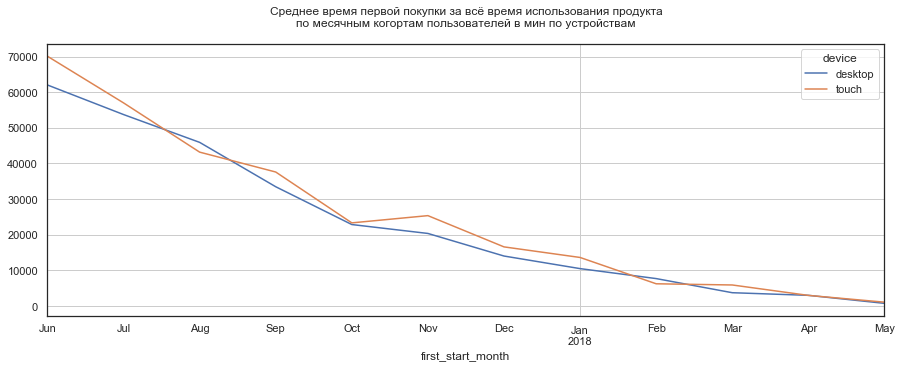

,desktop,touch,desktop_%,touch_%
first_start_month,,,,
2017-06-01,62021.0,70080.0,98.0,111.0
2017-07-01,53728.0,56999.0,99.0,105.0
2017-08-01,45925.0,43188.0,101.0,95.0
2017-09-01,33480.0,37609.0,98.0,110.0
2017-10-01,22876.0,23344.0,100.0,102.0
2017-11-01,20377.0,25373.0,96.0,119.0
2017-12-01,14043.0,16609.0,97.0,114.0
2018-01-01,10511.0,13640.0,94.0,122.0
2018-02-01,7716.0,6258.0,104.0,84.0


Среднее время первой покупки за всё время использования продукта
по месячным когортам пользователей в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,22432.0,23833.0,99.0,105.0
all_periods_mean,23185.0,25260.0,98.0,107.0


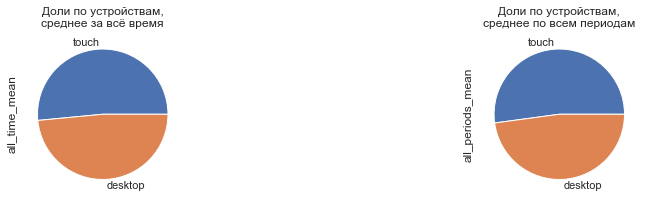

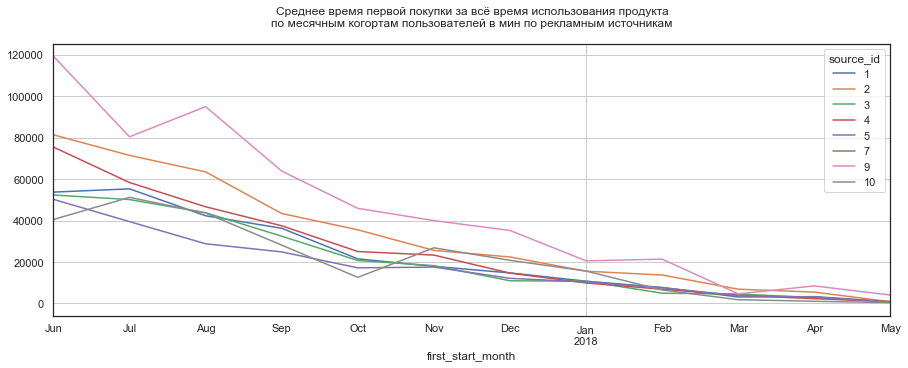

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
first_start_month,,,,,,,,,,,,,,,,
2017-06-01,53725.0,81341.0,52324.0,75442.0,50229.0,NaN,119268.0,40516.0,85.0,128.0,83.0,119.0,79.0,NaN,188.0,64.0
2017-07-01,55287.0,71440.0,50119.0,58343.0,39477.0,NaN,80395.0,51192.0,102.0,131.0,92.0,107.0,73.0,NaN,148.0,94.0
2017-08-01,42297.0,63476.0,43776.0,46639.0,28795.0,52.0,94967.0,43606.0,93.0,140.0,96.0,103.0,63.0,0.0,209.0,96.0
2017-09-01,36271.0,43389.0,32451.0,37477.0,24872.0,NaN,63863.0,28148.0,106.0,127.0,95.0,109.0,73.0,NaN,186.0,82.0
2017-10-01,21507.0,35531.0,20730.0,25054.0,17185.0,NaN,45870.0,12588.0,94.0,155.0,90.0,109.0,75.0,NaN,200.0,55.0
2017-11-01,17897.0,25599.0,18238.0,23334.0,17548.0,NaN,39981.0,26842.0,84.0,121.0,86.0,110.0,83.0,NaN,188.0,126.0
2017-12-01,14735.0,22424.0,10942.0,14636.0,12128.0,NaN,35213.0,20822.0,102.0,154.0,75.0,101.0,84.0,NaN,243.0,143.0
2018-01-01,10753.0,15553.0,10755.0,9875.0,10346.0,NaN,20558.0,15631.0,96.0,140.0,97.0,89.0,93.0,NaN,184.0,140.0
2018-02-01,7713.0,13718.0,4930.0,6854.0,7573.0,NaN,21368.0,6488.0,104.0,185.0,66.0,92.0,102.0,NaN,288.0,87.0


Среднее время первой покупки за всё время использования продукта
по месячным когортам пользователей в мин за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_mean,21588.0,32690.0,20009.0,22879.0,17831.0,52.0,53896.0,17711.0,95.0,144.0,88.0,101.0,79.0,0.0,238.0,78.0
all_periods_mean,22289.0,32138.0,21035.0,25398.0,17975.0,52.0,44887.0,20758.0,95.0,136.0,89.0,108.0,76.0,0.0,191.0,88.0


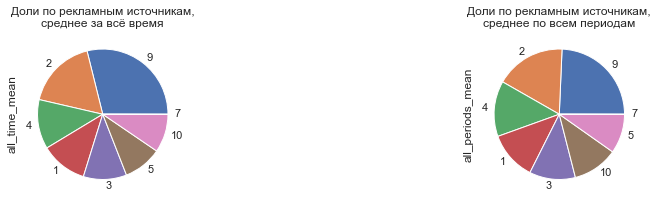

In [56]:
values_by_periods(table=orders_advance_first_buy_only,
                  period='first_start_month',
                  title='Среднее время первой покупки за всё время использования продукта' + '\n' +
                  'по месячным когортам пользователей в мин',
                  values='first_buy_minutes',
                  agg='mean',)

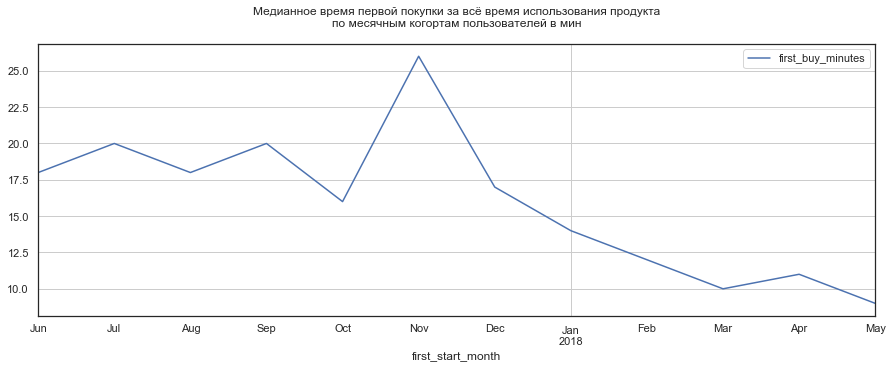

,first_buy_minutes
first_start_month,
2017-06-01,18.0
2017-07-01,20.0
2017-08-01,18.0
2017-09-01,20.0
2017-10-01,16.0
2017-11-01,26.0
2017-12-01,17.0
2018-01-01,14.0
2018-02-01,12.0


Медианное время первой покупки за всё время использования продукта
по месячным когортам пользователей в мин за всё время:


,first_buy_minutes
all_time_median,15.0
all_periods_median,16.0


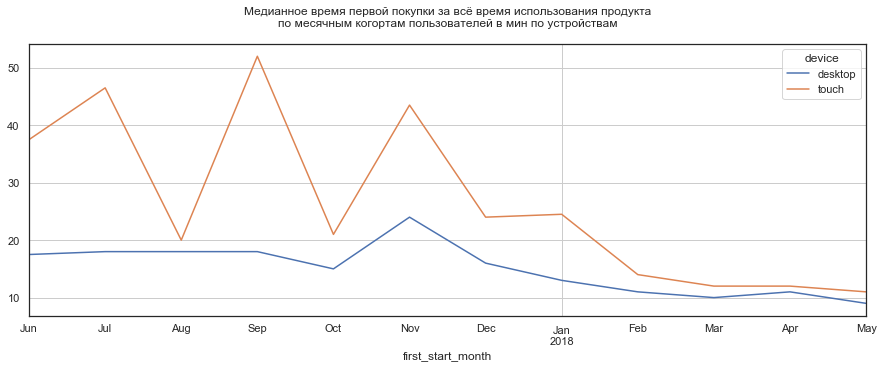

,desktop,touch,desktop_%,touch_%
first_start_month,,,,
2017-06-01,18.0,38.0,97.0,208.0
2017-07-01,18.0,46.0,90.0,233.0
2017-08-01,18.0,20.0,100.0,111.0
2017-09-01,18.0,52.0,90.0,260.0
2017-10-01,15.0,21.0,94.0,131.0
2017-11-01,24.0,44.0,92.0,167.0
2017-12-01,16.0,24.0,94.0,141.0
2018-01-01,13.0,24.0,93.0,175.0
2018-02-01,11.0,14.0,92.0,117.0


Медианное время первой покупки за всё время использования продукта
по месячным когортам пользователей в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,14.0,20.0,93.0,133.0
all_periods_median,16.0,22.0,94.0,136.0


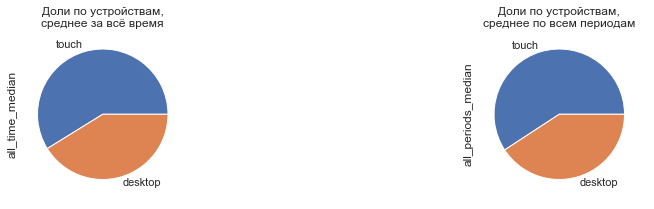

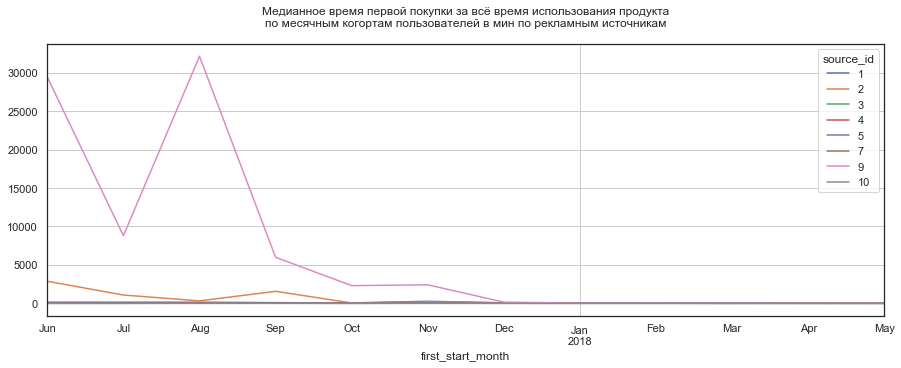

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
first_start_month,,,,,,,,,,,,,,,,
2017-06-01,154.0,2878.0,11.0,24.0,10.0,NaN,29414.0,9.0,858.0,15992.0,61.0,136.0,56.0,NaN,163411.0,50.0
2017-07-01,152.0,1090.0,11.0,23.0,10.0,NaN,8807.0,10.0,760.0,5450.0,55.0,115.0,50.0,NaN,44035.0,48.0
2017-08-01,148.0,326.0,13.0,18.0,9.0,52.0,32132.0,18.0,822.0,1814.0,72.0,100.0,50.0,289.0,178511.0,100.0
2017-09-01,97.0,1573.0,15.0,20.0,12.0,NaN,5993.0,16.0,485.0,7865.0,75.0,100.0,60.0,NaN,29965.0,82.0
2017-10-01,62.0,56.0,12.0,17.0,11.0,NaN,2308.0,7.0,388.0,353.0,75.0,106.0,69.0,NaN,14425.0,44.0
2017-11-01,271.0,187.0,17.0,21.0,14.0,NaN,2417.0,10.0,1042.0,719.0,65.0,81.0,54.0,NaN,9296.0,38.0
2017-12-01,70.0,78.0,13.0,15.0,14.0,NaN,162.0,9.0,412.0,462.0,76.0,88.0,82.0,NaN,953.0,53.0
2018-01-01,80.0,58.0,12.0,12.0,11.0,NaN,40.0,13.0,571.0,414.0,86.0,86.0,79.0,NaN,286.0,93.0
2018-02-01,38.0,28.0,9.0,13.0,9.0,NaN,40.0,11.0,312.0,238.0,75.0,108.0,75.0,NaN,333.0,92.0


Медианное время первой покупки за всё время использования продукта
по месячным когортам пользователей в мин за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_median,77.0,54.0,12.0,14.0,11.0,52.0,973.0,10.0,513.0,360.0,80.0,93.0,73.0,347.0,6487.0,67.0
all_periods_median,75.0,68.0,12.0,16.0,10.0,52.0,1235.0,10.0,455.0,414.0,70.0,97.0,64.0,315.0,7485.0,59.0


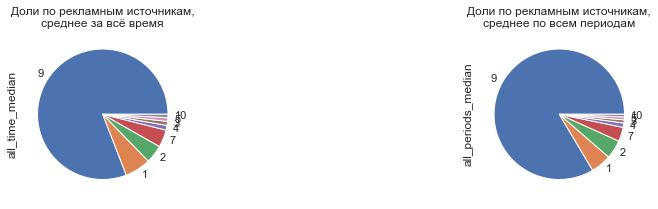

In [57]:
values_by_periods(table=orders_advance_first_buy_only,
                  period='first_start_month',
                  title='Медианное время первой покупки за всё время использования продукта' + '\n' +
                  'по месячным когортам пользователей в мин',
                  values='first_buy_minutes',
                  agg='median',)

Не имеет смысла рассчитывать начало покупок на больших периодах: всего одна покупка в конце рассматриваемого периода очень сильно сместит среднее и исказит результат.

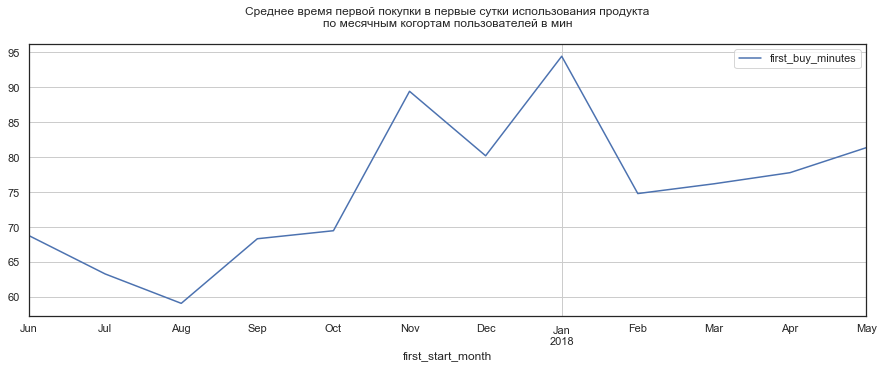

,first_buy_minutes
first_start_month,
2017-06-01,69.0
2017-07-01,63.0
2017-08-01,59.0
2017-09-01,68.0
2017-10-01,69.0
2017-11-01,89.0
2017-12-01,80.0
2018-01-01,94.0
2018-02-01,75.0


Среднее время первой покупки в первые сутки использования продукта
по месячным когортам пользователей в мин за всё время:


,first_buy_minutes
all_time_mean,77.0
all_periods_mean,75.0


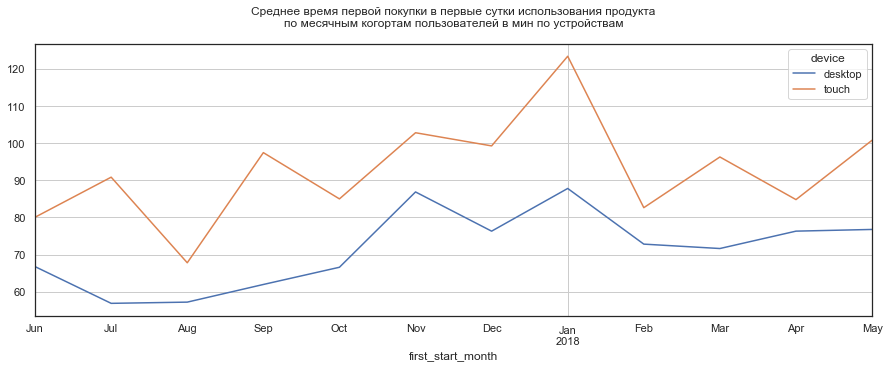

,desktop,touch,desktop_%,touch_%
first_start_month,,,,
2017-06-01,67.0,80.0,97.0,116.0
2017-07-01,57.0,91.0,90.0,144.0
2017-08-01,57.0,68.0,97.0,115.0
2017-09-01,62.0,97.0,91.0,143.0
2017-10-01,67.0,85.0,96.0,122.0
2017-11-01,87.0,103.0,97.0,115.0
2017-12-01,76.0,99.0,95.0,124.0
2018-01-01,88.0,123.0,93.0,131.0
2018-02-01,73.0,83.0,97.0,111.0


Среднее время первой покупки в первые сутки использования продукта
по месячным когортам пользователей в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,73.0,94.0,95.0,123.0
all_periods_mean,72.0,93.0,95.0,123.0


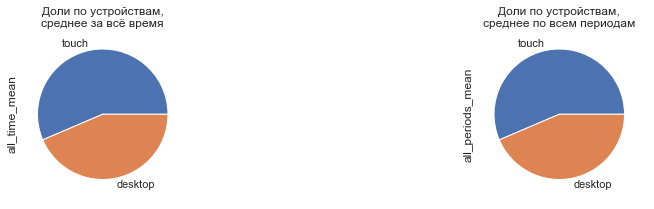

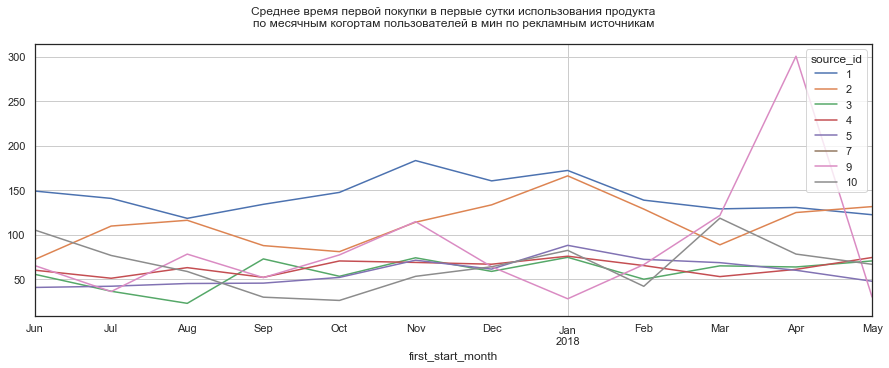

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
first_start_month,,,,,,,,,,,,,,,,
2017-06-01,149.0,73.0,56.0,60.0,41.0,NaN,65.0,105.0,217.0,106.0,81.0,88.0,60.0,NaN,95.0,153.0
2017-07-01,141.0,110.0,37.0,51.0,42.0,NaN,36.0,77.0,223.0,174.0,58.0,81.0,67.0,NaN,57.0,122.0
2017-08-01,119.0,116.0,23.0,63.0,45.0,52.0,78.0,59.0,201.0,197.0,39.0,107.0,77.0,88.0,133.0,100.0
2017-09-01,134.0,88.0,73.0,52.0,46.0,NaN,52.0,30.0,197.0,129.0,107.0,77.0,67.0,NaN,76.0,44.0
2017-10-01,148.0,81.0,54.0,71.0,52.0,NaN,78.0,26.0,213.0,117.0,77.0,102.0,75.0,NaN,112.0,38.0
2017-11-01,184.0,114.0,74.0,69.0,72.0,NaN,115.0,53.0,205.0,128.0,83.0,77.0,80.0,NaN,129.0,60.0
2017-12-01,161.0,134.0,59.0,67.0,62.0,NaN,64.0,64.0,200.0,167.0,74.0,84.0,77.0,NaN,80.0,80.0
2018-01-01,172.0,166.0,75.0,76.0,88.0,NaN,28.0,83.0,183.0,176.0,79.0,81.0,93.0,NaN,30.0,87.0
2018-02-01,139.0,129.0,50.0,66.0,73.0,NaN,67.0,42.0,186.0,172.0,67.0,88.0,97.0,NaN,89.0,57.0


Среднее время первой покупки в первые сутки использования продукта
по месячным когортам пользователей в мин за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_mean,147.0,113.0,61.0,65.0,59.0,52.0,80.0,66.0,192.0,147.0,79.0,85.0,77.0,68.0,104.0,87.0
all_periods_mean,144.0,113.0,58.0,64.0,58.0,52.0,86.0,67.0,191.0,150.0,78.0,85.0,77.0,69.0,115.0,89.0


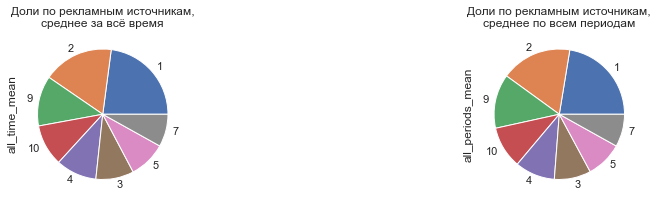

In [58]:
values_by_periods(table=orders_advance_first_buy_only.query('first_buy_minutes <= 1440'),
                  period='first_start_month',
                  title='Среднее время первой покупки в первые сутки использования продукта' + '\n' +
                  'по месячным когортам пользователей в мин',
                  values='first_buy_minutes',
                  agg='mean',)

Среднее время первой покупки в течение первых суток использования продукта за всё время составляет 77 мин. По устройствам: десктопные 73 мин, мобильные 94 мин. Топ-3 рекламных источников: 1 (147 мин), 2 (113 мин), 9 (80 мин).

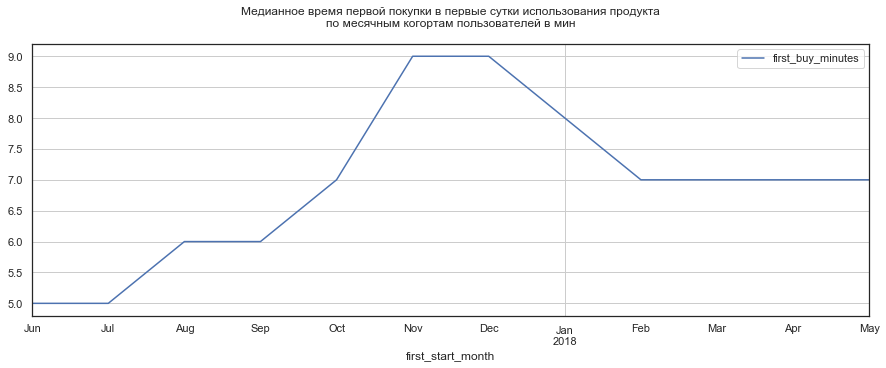

,first_buy_minutes
first_start_month,
2017-06-01,5.0
2017-07-01,5.0
2017-08-01,6.0
2017-09-01,6.0
2017-10-01,7.0
2017-11-01,9.0
2017-12-01,9.0
2018-01-01,8.0
2018-02-01,7.0


Медианное время первой покупки в первые сутки использования продукта
по месячным когортам пользователей в мин за всё время:


,first_buy_minutes
all_time_median,7.0
all_periods_median,7.0


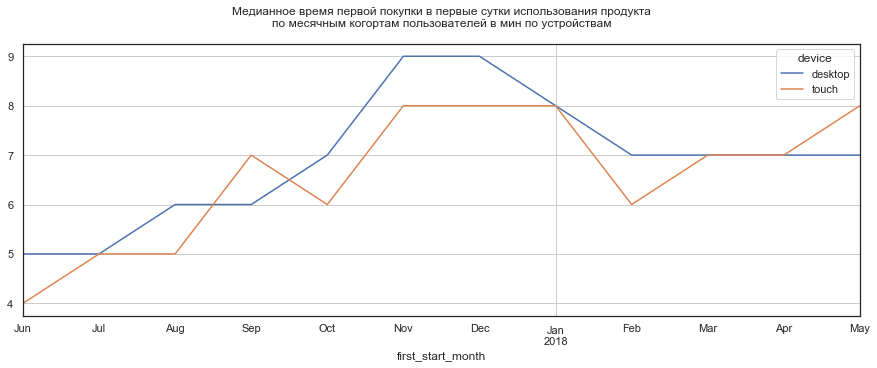

,desktop,touch,desktop_%,touch_%
first_start_month,,,,
2017-06-01,5.0,4.0,100.0,80.0
2017-07-01,5.0,5.0,100.0,100.0
2017-08-01,6.0,5.0,100.0,83.3
2017-09-01,6.0,7.0,100.0,116.7
2017-10-01,7.0,6.0,100.0,85.7
2017-11-01,9.0,8.0,100.0,88.9
2017-12-01,9.0,8.0,100.0,88.9
2018-01-01,8.0,8.0,100.0,100.0
2018-02-01,7.0,6.0,100.0,85.7


Медианное время первой покупки в первые сутки использования продукта
по месячным когортам пользователей в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,7.0,7.0,100.0,100.0
all_periods_median,7.0,7.0,100.0,100.0


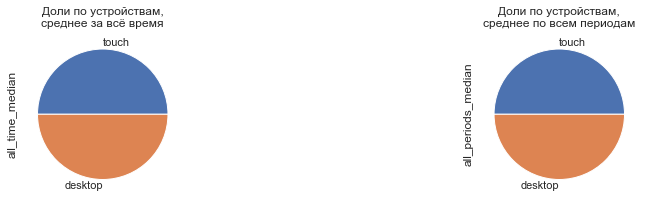

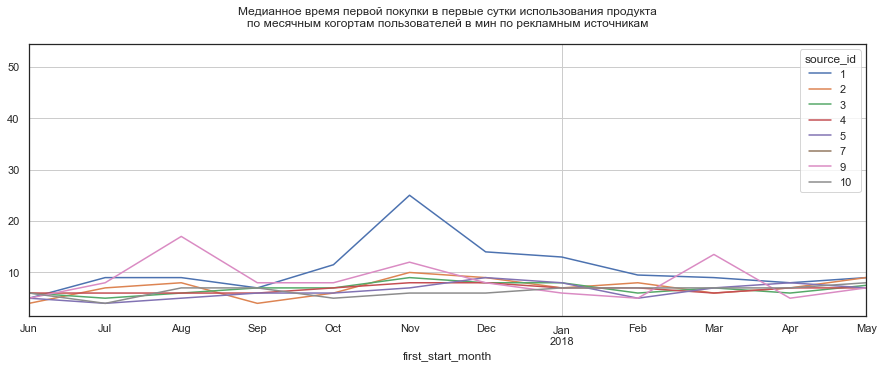

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
first_start_month,,,,,,,,,,,,,,,,
2017-06-01,5.0,4.0,6.0,6.0,5.0,NaN,5.0,6.0,100.0,80.0,120.0,120.0,100.0,NaN,100.0,120.0
2017-07-01,9.0,7.0,5.0,6.0,4.0,NaN,8.0,4.0,180.0,140.0,100.0,120.0,80.0,NaN,160.0,80.0
2017-08-01,9.0,8.0,6.0,6.0,5.0,52.0,17.0,7.0,150.0,133.3,100.0,100.0,83.3,866.7,283.3,116.7
2017-09-01,7.0,4.0,7.0,6.0,6.0,NaN,8.0,7.0,116.7,66.7,116.7,100.0,100.0,NaN,133.3,116.7
2017-10-01,11.5,6.0,7.0,7.0,6.0,NaN,8.0,5.0,164.3,85.7,100.0,100.0,85.7,NaN,114.3,71.4
2017-11-01,25.0,10.0,9.0,8.0,7.0,NaN,12.0,6.0,277.8,111.1,100.0,88.9,77.8,NaN,133.3,66.7
2017-12-01,14.0,9.0,8.0,8.0,9.0,NaN,8.0,6.0,155.6,100.0,88.9,88.9,100.0,NaN,88.9,66.7
2018-01-01,13.0,7.0,8.0,7.0,8.0,NaN,6.0,7.0,162.5,87.5,100.0,87.5,100.0,NaN,75.0,87.5
2018-02-01,9.5,8.0,6.0,7.0,5.0,NaN,5.0,7.0,135.7,114.3,85.7,100.0,71.4,NaN,71.4,100.0


Медианное время первой покупки в первые сутки использования продукта
по месячным когортам пользователей в мин за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_median,11.0,7.0,7.0,7.0,6.0,52.0,8.0,6.0,157.1,100.0,100.0,100.0,85.7,742.9,114.3,85.7
all_periods_median,9.0,7.0,7.0,7.0,6.5,52.0,8.0,7.0,128.6,100.0,100.0,100.0,92.9,742.9,114.3,100.0


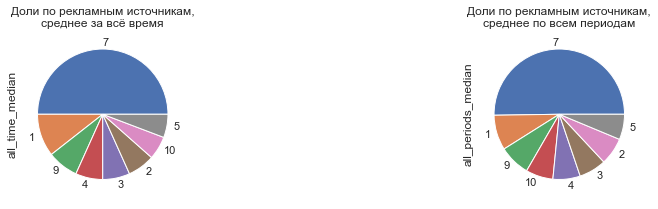

In [59]:
values_by_periods(table=orders_advance_first_buy_only.query('first_buy_minutes <= 1440'),
                  period='first_start_month',
                  title='Медианное время первой покупки в первые сутки использования продукта' + '\n' +
                  'по месячным когортам пользователей в мин',
                  values='first_buy_minutes',
                  agg='median',
                  round=1,)

Медианное время первой покупки в течение первых суток использования продукта за всё время составляет 7 мин. По устройствам: десктопные и мобильные по 7 мин. Топ-3 рекламных источников: 5 и 10 (6 мин), 2, 3 и 4 (7 мин).

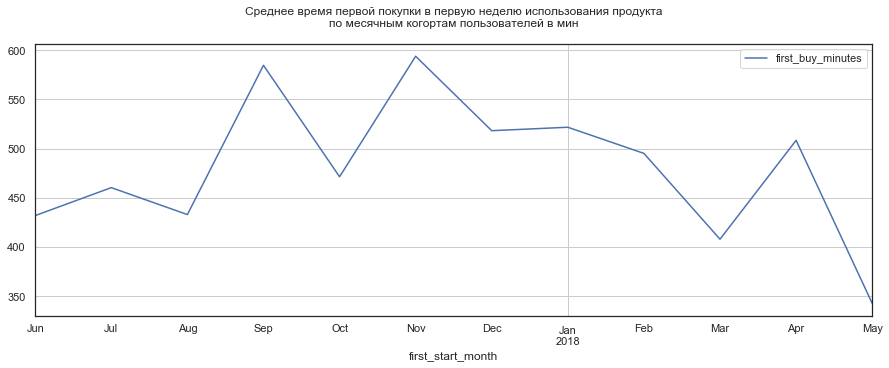

,first_buy_minutes
first_start_month,
2017-06-01,432.0
2017-07-01,460.0
2017-08-01,433.0
2017-09-01,585.0
2017-10-01,471.0
2017-11-01,594.0
2017-12-01,518.0
2018-01-01,522.0
2018-02-01,495.0


Среднее время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин за всё время:


,first_buy_minutes
all_time_mean,487.0
all_periods_mean,481.0


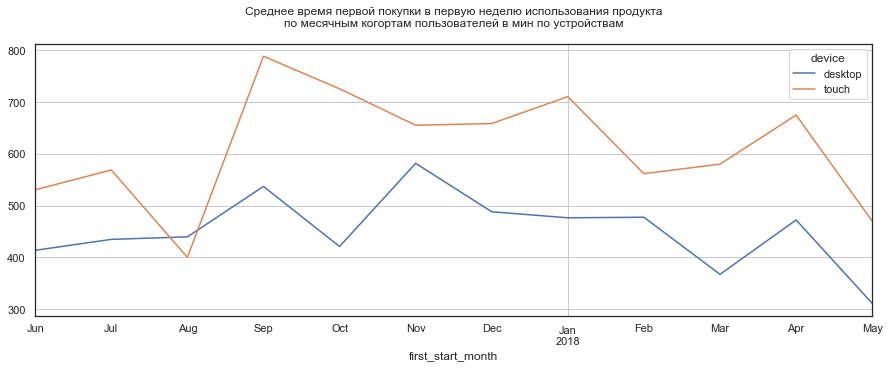

,desktop,touch,desktop_%,touch_%
first_start_month,,,,
2017-06-01,414.0,531.0,96.0,123.0
2017-07-01,435.0,569.0,95.0,124.0
2017-08-01,440.0,400.0,102.0,92.0
2017-09-01,537.0,789.0,92.0,135.0
2017-10-01,421.0,726.0,89.0,154.0
2017-11-01,582.0,655.0,98.0,110.0
2017-12-01,488.0,659.0,94.0,127.0
2018-01-01,477.0,711.0,91.0,136.0
2018-02-01,478.0,562.0,97.0,113.0


Среднее время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,457.0,626.0,94.0,128.0
all_periods_mean,452.0,611.0,94.0,127.0


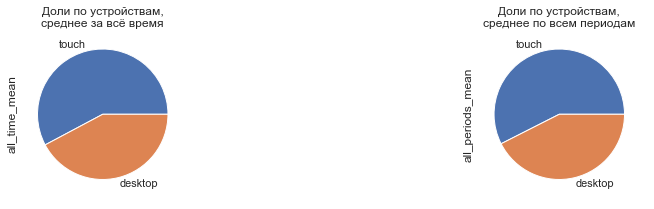

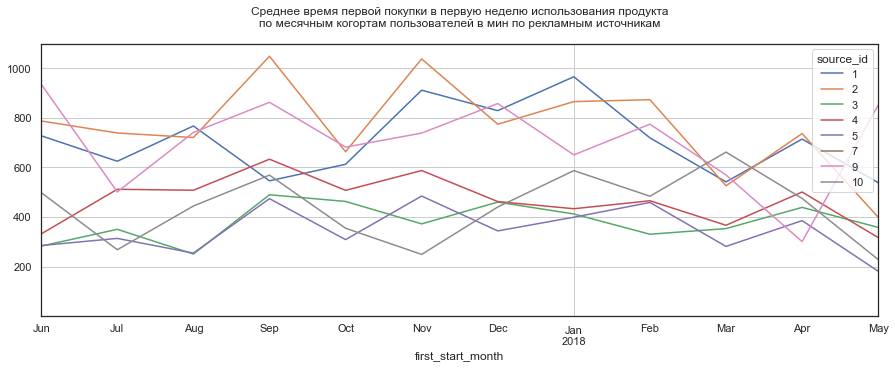

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
first_start_month,,,,,,,,,,,,,,,,
2017-06-01,727.0,787.0,283.0,332.0,285.0,NaN,935.0,498.0,168.0,182.0,65.0,77.0,66.0,NaN,216.0,115.0
2017-07-01,624.0,738.0,350.0,512.0,314.0,NaN,501.0,268.0,136.0,160.0,76.0,111.0,68.0,NaN,109.0,58.0
2017-08-01,767.0,720.0,251.0,508.0,254.0,52.0,741.0,444.0,177.0,166.0,58.0,117.0,59.0,12.0,171.0,103.0
2017-09-01,546.0,1048.0,489.0,633.0,474.0,NaN,862.0,569.0,93.0,179.0,84.0,108.0,81.0,NaN,147.0,97.0
2017-10-01,612.0,663.0,463.0,507.0,309.0,NaN,682.0,355.0,130.0,141.0,98.0,108.0,66.0,NaN,145.0,75.0
2017-11-01,911.0,1037.0,372.0,587.0,484.0,NaN,738.0,249.0,153.0,175.0,63.0,99.0,82.0,NaN,124.0,42.0
2017-12-01,828.0,774.0,460.0,462.0,344.0,NaN,857.0,440.0,160.0,149.0,89.0,89.0,66.0,NaN,165.0,85.0
2018-01-01,965.0,865.0,412.0,433.0,399.0,NaN,650.0,587.0,185.0,166.0,79.0,83.0,77.0,NaN,125.0,113.0
2018-02-01,719.0,872.0,330.0,465.0,458.0,NaN,774.0,484.0,145.0,176.0,67.0,94.0,93.0,NaN,156.0,98.0


Среднее время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_mean,717.0,757.0,390.0,470.0,356.0,52.0,728.0,445.0,147.0,155.0,80.0,96.0,73.0,11.0,149.0,91.0
all_periods_mean,708.0,764.0,380.0,469.0,347.0,52.0,705.0,438.0,147.0,159.0,79.0,97.0,72.0,11.0,147.0,91.0


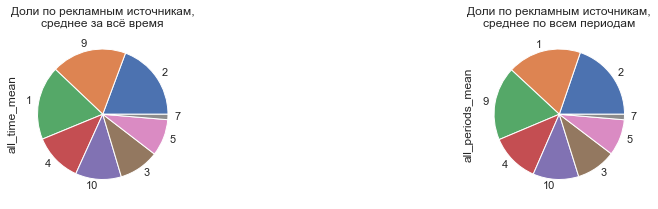

In [60]:
values_by_periods(table=orders_advance_first_buy_only.query('first_buy_minutes <= 10080'),
                  period='first_start_month',
                  title='Среднее время первой покупки в первую неделю использования продукта' + '\n' +
                  'по месячным когортам пользователей в мин',
                  values='first_buy_minutes',
                  agg='mean',)

Среднее время первой покупки в течение первой недели использования продукта за всё время составляет 487 мин. По устройствам: десктопные 457 мин, мобильные 626 мин. Топ-3 рекламных источников: 7 (52 мин), 5 (356 мин), 3 (390 мин).

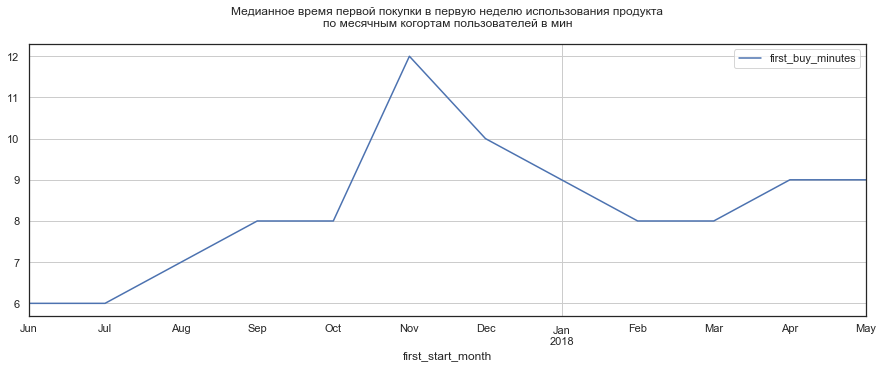

,first_buy_minutes
first_start_month,
2017-06-01,6.0
2017-07-01,6.0
2017-08-01,7.0
2017-09-01,8.0
2017-10-01,8.0
2017-11-01,12.0
2017-12-01,10.0
2018-01-01,9.0
2018-02-01,8.0


Медианное время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин за всё время:


,first_buy_minutes
all_time_median,9.0
all_periods_median,8.0


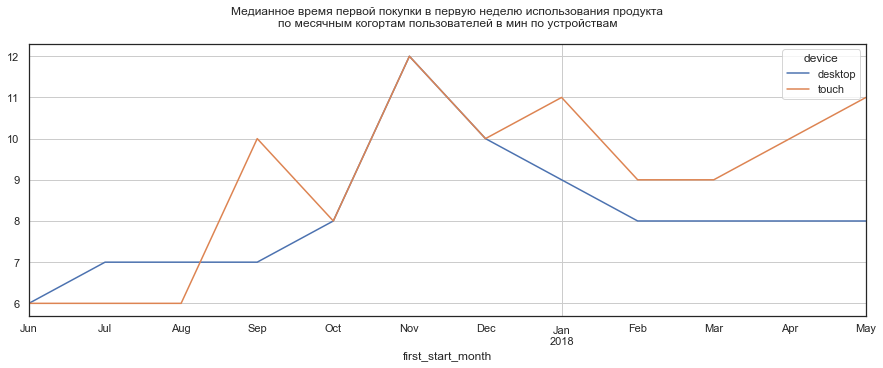

,desktop,touch,desktop_%,touch_%
first_start_month,,,,
2017-06-01,6.0,6.0,100.0,100.0
2017-07-01,7.0,6.0,116.7,100.0
2017-08-01,7.0,6.0,100.0,85.7
2017-09-01,7.0,10.0,87.5,125.0
2017-10-01,8.0,8.0,100.0,100.0
2017-11-01,12.0,12.0,100.0,100.0
2017-12-01,10.0,10.0,100.0,100.0
2018-01-01,9.0,11.0,100.0,122.2
2018-02-01,8.0,9.0,100.0,112.5


Медианное время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,9.0,9.0,100.0,100.0
all_periods_median,8.0,9.5,100.0,118.8


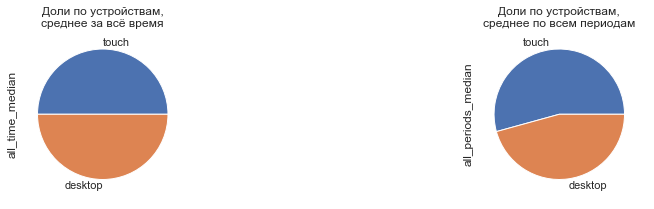

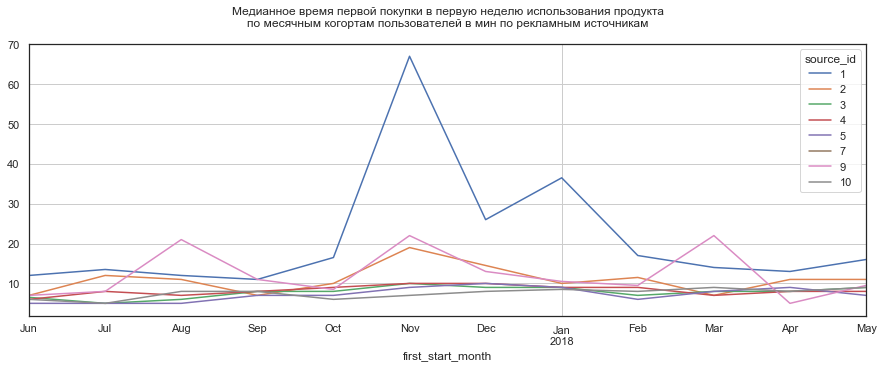

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
first_start_month,,,,,,,,,,,,,,,,
2017-06-01,12.0,7.0,6.5,6.0,5.0,NaN,7.0,6.0,200.0,116.7,108.3,100.0,83.3,NaN,116.7,100.0
2017-07-01,13.5,12.0,5.0,8.0,5.0,NaN,8.0,5.0,225.0,200.0,83.3,133.3,83.3,NaN,133.3,83.3
2017-08-01,12.0,11.0,6.0,7.0,5.0,52.0,21.0,8.0,171.4,157.1,85.7,100.0,71.4,742.9,300.0,114.3
2017-09-01,11.0,7.0,8.0,8.0,7.0,NaN,11.0,8.0,137.5,87.5,100.0,100.0,87.5,NaN,137.5,100.0
2017-10-01,16.5,10.0,8.0,9.0,7.0,NaN,8.5,6.0,206.2,125.0,100.0,112.5,87.5,NaN,106.2,75.0
2017-11-01,67.0,19.0,10.0,10.0,9.0,NaN,22.0,7.0,558.3,158.3,83.3,83.3,75.0,NaN,183.3,58.3
2017-12-01,26.0,14.5,9.0,10.0,10.0,NaN,13.0,8.0,260.0,145.0,90.0,100.0,100.0,NaN,130.0,80.0
2018-01-01,36.5,10.0,9.0,9.0,9.0,NaN,10.5,8.5,405.6,111.1,100.0,100.0,100.0,NaN,116.7,94.4
2018-02-01,17.0,11.5,7.0,9.0,6.0,NaN,9.5,8.0,212.5,143.8,87.5,112.5,75.0,NaN,118.8,100.0


Медианное время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_median,19.0,10.0,8.0,8.0,7.0,52.0,12.0,7.0,211.1,111.1,88.9,88.9,77.8,577.8,133.3,77.8
all_periods_median,15.0,11.0,8.0,8.0,7.0,52.0,10.0,8.0,187.5,137.5,100.0,100.0,87.5,650.0,125.0,100.0


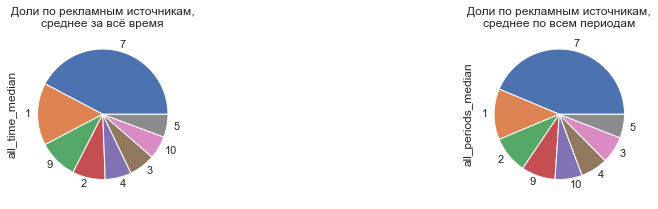

In [61]:
values_by_periods(table=orders_advance_first_buy_only.query('first_buy_minutes <= 10080'),
                  period='first_start_month',
                  title='Медианное время первой покупки в первую неделю использования продукта' + '\n' +
                  'по месячным когортам пользователей в мин',
                  values='first_buy_minutes',
                  agg='median',
                  round=1,)

Медианное время первой покупки в течение первой недели использования продукта за всё время составляет 9 мин. По устройствам: десктопные и мобильные по 9 мин. Топ-3 рекламных источников: 5 и 10 (7 мин), 3 и 4 (8 мин).

Медианное время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин на дату 2017-09-22
Распределение данных за период:


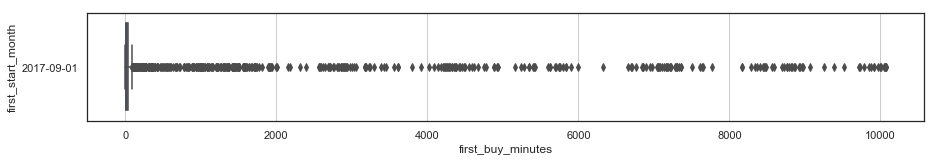

,first_buy_minutes
first_start_month,
2017-09-01,8.0


Медианное время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
first_start_month,,,,
2017-09-01,7.0,10.0,87.5,125.0


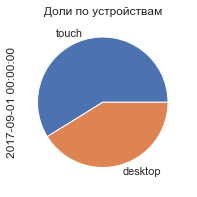

Медианное время первой покупки в первую неделю использования продукта
по месячным когортам пользователей в мин на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
first_start_month,,,,,,,,,,,,,,,,
2017-09-01,11.0,7.0,8.0,8.0,7.0,NaN,11.0,8.0,137.5,87.5,100.0,100.0,87.5,NaN,137.5,100.0


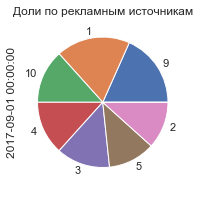

In [62]:
values_by_periods(table=orders_advance_first_buy_only.query('first_buy_minutes <= 10080'),
                  period='first_start_month',
                  title='Медианное время первой покупки в первую неделю использования продукта' + '\n' +
                  'по месячным когортам пользователей в мин на дату',
                  values='first_buy_minutes',
                  agg='median',
                  date='2017-09-22',
                  round=1,)

#### Продажи: когда люди начинают покупать? Вывод

Доля повторных покупок от общего количества покупок 26.5%

Не имеет смысла рассчитывать начало покупок на больших периодах: всего одна покупка в конце рассматриваемого периода очень сильно сместит среднее и исказит результат.

Среднее время первой покупки в течение первых суток использования продукта за всё время составляет 77 мин. По устройствам: десктопные 73 мин, мобильные 94 мин. Топ-3 рекламных источников: 1 (147 мин), 2 (113 мин), 9 (80 мин).

Среднее время первой покупки в течение первой недели использования продукта за всё время составляет 487 мин. По устройствам: десктопные 457 мин, мобильные 626 мин. Топ-3 рекламных источников: 7 (52 мин), 5 (356 мин), 3 (390 мин).

Медианное время первой покупки в течение первых суток использования продукта за всё время составляет 7 мин. По устройствам: десктопные и мобильные по 7 мин. Топ-3 рекламных источников: 5 и 10 (6 мин), 2, 3 и 4 (7 мин).

Медианное время первой покупки в течение первой недели использования продукта за всё время составляет 9 мин. По устройствам: десктопные и мобильные по 9 мин. Топ-3 рекламных источников: 5 и 10 (7 мин), 3 и 4 (8 мин).

### Продажи: сколько раз покупают за период?

#### Продажи: сколько раз покупают за период? (недели)

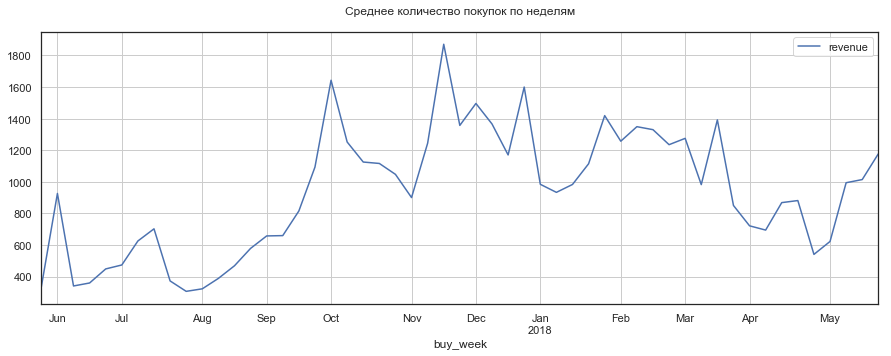

,revenue
buy_week,
2017-05-29,334
2017-06-05,926
2017-06-12,340
2017-06-19,359
2017-06-26,448
2017-07-03,473
2017-07-10,625
2017-07-17,702
2017-07-24,372


Среднее количество покупок по неделям за всё время:


,revenue
all_time_count,49666.0
all_time_mean,937.0
all_periods_mean,937.0


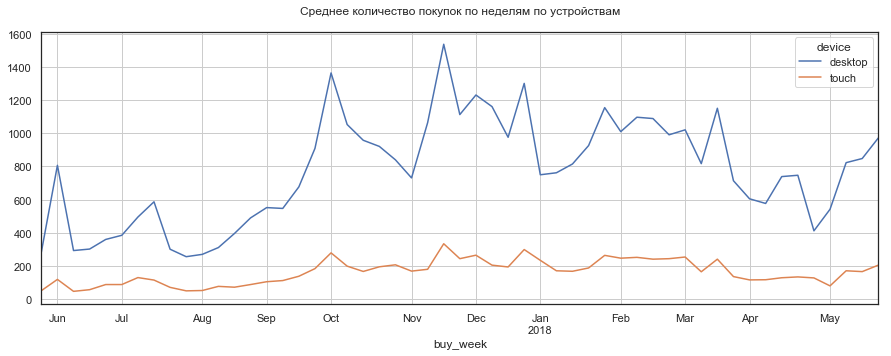

,desktop,touch,desktop_%,touch_%
buy_week,,,,
2017-05-29,283,51,85.0,15.0
2017-06-05,807,119,87.0,13.0
2017-06-12,293,47,86.0,14.0
2017-06-19,302,57,84.0,16.0
2017-06-26,360,88,80.0,20.0
2017-07-03,385,88,81.0,19.0
2017-07-10,495,130,79.0,21.0
2017-07-17,587,115,84.0,16.0
2017-07-24,301,71,81.0,19.0


Среднее количество покупок по неделям за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_count,41034.0,8632.0,83.0,17.0
all_time_mean,774.0,163.0,83.0,17.0
all_periods_mean,774.0,163.0,83.0,17.0


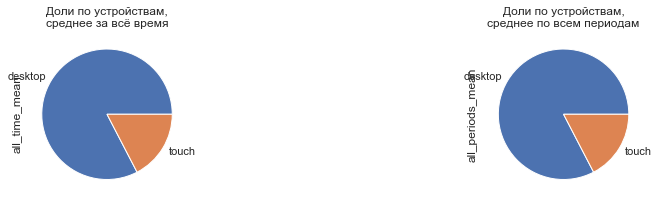

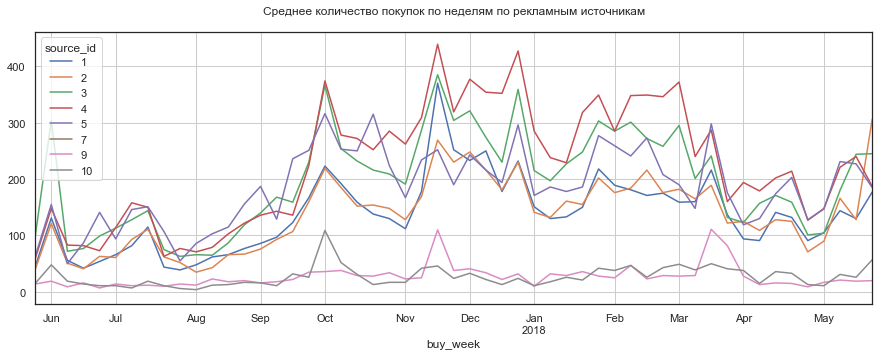

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_week,,,,,,,,,,,,,,,,
2017-05-29,45.0,40.0,98.0,59.0,63.0,NaN,14.0,15.0,13.0,12.0,29.0,18.0,19.0,NaN,4.0,4.0
2017-06-05,131.0,121.0,304.0,148.0,155.0,NaN,19.0,48.0,14.0,13.0,33.0,16.0,17.0,NaN,2.0,5.0
2017-06-12,56.0,51.0,72.0,83.0,50.0,NaN,9.0,19.0,16.0,15.0,21.0,24.0,15.0,NaN,3.0,6.0
2017-06-19,42.0,41.0,77.0,82.0,87.0,NaN,16.0,14.0,12.0,11.0,21.0,23.0,24.0,NaN,4.0,4.0
2017-06-26,54.0,63.0,99.0,73.0,141.0,NaN,7.0,11.0,12.0,14.0,22.0,16.0,31.0,NaN,2.0,2.0
2017-07-03,66.0,61.0,113.0,114.0,94.0,NaN,14.0,11.0,14.0,13.0,24.0,24.0,20.0,NaN,3.0,2.0
2017-07-10,82.0,93.0,128.0,158.0,146.0,NaN,11.0,7.0,13.0,15.0,20.0,25.0,23.0,NaN,2.0,1.0
2017-07-17,115.0,111.0,144.0,150.0,151.0,NaN,12.0,19.0,16.0,16.0,21.0,21.0,22.0,NaN,2.0,3.0
2017-07-24,44.0,62.0,75.0,63.0,107.0,NaN,10.0,11.0,12.0,17.0,20.0,17.0,29.0,NaN,3.0,3.0


Среднее количество покупок по неделям за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_count,7322.0,7320.0,10494.0,11839.0,9797.0,1.0,1447.0,1446.0,15.0,15.0,21.0,24.0,20.0,0.0,3.0,3.0
all_time_mean,138.0,138.0,198.0,223.0,185.0,0.0,27.0,27.0,15.0,15.0,21.0,24.0,20.0,0.0,3.0,3.0
all_periods_mean,138.0,138.0,198.0,223.0,185.0,1.0,27.0,27.0,15.0,15.0,21.0,24.0,20.0,0.0,3.0,3.0


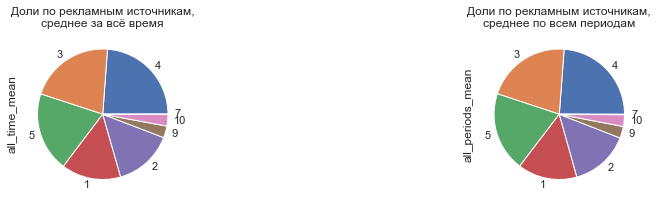

In [63]:
values_by_periods(table=orders_advance,
                  period='buy_week',
                  title='Среднее количество покупок по неделям',
                  values='revenue',
                  agg='count',)

В среднем за всё время, количество покупок в неделю составляет 937. По устройствам: десктопные 83%, мобильные 17%. Топ-3 рекламных источников: 4 (24%), 3 (21%), 5 (20%).

За всё время сделано 49666 покупок, перед которыми покупатели пользовались продуктом.

Среднее количество покупок по неделям на дату 2017-09-22


,revenue
buy_week,
2017-09-18,815


Среднее количество покупок по неделям на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
buy_week,,,,
2017-09-18,677,138,83.0,17.0


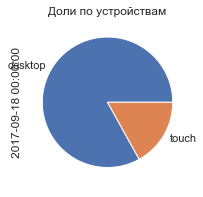

Среднее количество покупок по неделям на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_week,,,,,,,,,,,,,,,,
2017-09-18,123.0,107.0,159.0,136.0,236.0,NaN,22.0,32.0,15.0,13.0,20.0,17.0,29.0,NaN,3.0,4.0


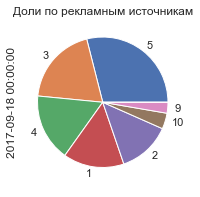

In [64]:
values_by_periods(table=orders_advance,
                  period='buy_week',
                  title='Среднее количество покупок по неделям на дату',
                  values='revenue',
                  agg='count',
                  date='2017-09-22',)

#### Продажи: сколько раз покупают за период? (месяцы)

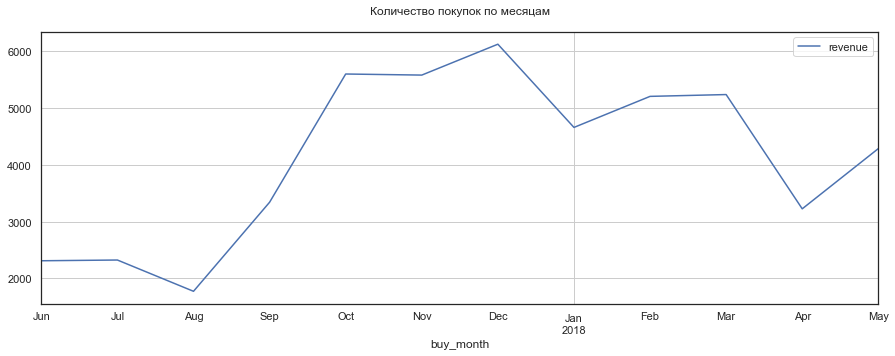

,revenue
buy_month,
2017-06-01,2310
2017-07-01,2323
2017-08-01,1772
2017-09-01,3341
2017-10-01,5600
2017-11-01,5581
2017-12-01,6125
2018-01-01,4659
2018-02-01,5206


Количество покупок по месяцам за всё время:


,revenue
all_time_count,49666.0
all_time_mean,4139.0
all_periods_mean,4139.0


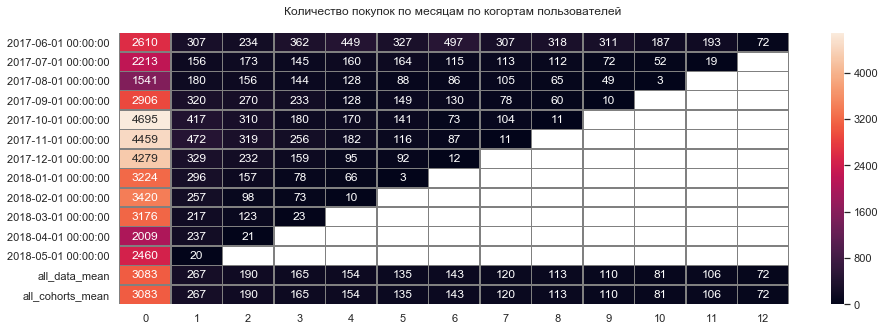

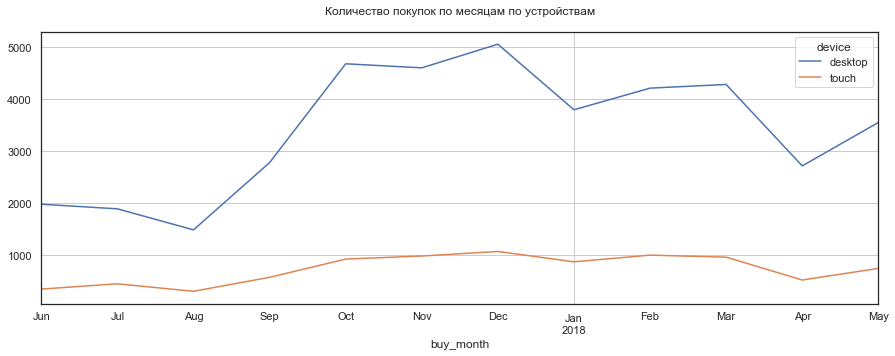

,desktop,touch,desktop_%,touch_%
buy_month,,,,
2017-06-01,1974,336,85.0,15.0
2017-07-01,1885,438,81.0,19.0
2017-08-01,1479,293,83.0,17.0
2017-09-01,2778,563,83.0,17.0
2017-10-01,4685,915,84.0,16.0
2017-11-01,4607,974,83.0,17.0
2017-12-01,5063,1062,83.0,17.0
2018-01-01,3797,862,81.0,19.0
2018-02-01,4215,991,81.0,19.0


Количество покупок по месяцам за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_count,41034.0,8632.0,83.0,17.0
all_time_mean,3420.0,719.0,83.0,17.0
all_periods_mean,3420.0,719.0,83.0,17.0


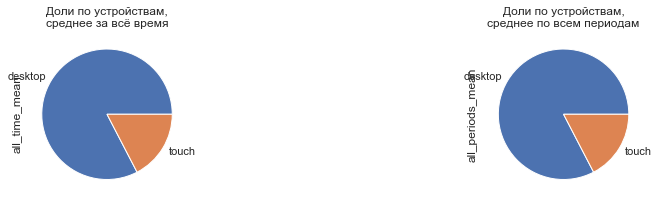

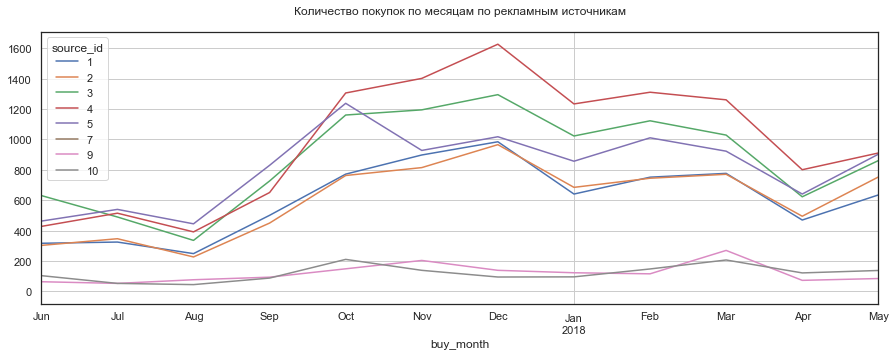

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_month,,,,,,,,,,,,,,,,
2017-06-01,317.0,303.0,631.0,428.0,463.0,NaN,64.0,104.0,14.0,13.0,27.0,19.0,20.0,NaN,3.0,5.0
2017-07-01,325.0,347.0,490.0,515.0,540.0,NaN,53.0,53.0,14.0,15.0,21.0,22.0,23.0,NaN,2.0,2.0
2017-08-01,249.0,227.0,336.0,392.0,445.0,1.0,77.0,45.0,14.0,13.0,19.0,22.0,25.0,0.0,4.0,3.0
2017-09-01,501.0,450.0,727.0,651.0,830.0,NaN,94.0,88.0,15.0,13.0,22.0,19.0,25.0,NaN,3.0,3.0
2017-10-01,772.0,763.0,1161.0,1306.0,1238.0,NaN,149.0,211.0,14.0,14.0,21.0,23.0,22.0,NaN,3.0,4.0
2017-11-01,898.0,815.0,1195.0,1402.0,928.0,NaN,204.0,139.0,16.0,15.0,21.0,25.0,17.0,NaN,4.0,2.0
2017-12-01,985.0,966.0,1295.0,1627.0,1018.0,NaN,139.0,95.0,16.0,16.0,21.0,27.0,17.0,NaN,2.0,2.0
2018-01-01,641.0,685.0,1023.0,1234.0,857.0,NaN,123.0,96.0,14.0,15.0,22.0,26.0,18.0,NaN,3.0,2.0
2018-02-01,752.0,745.0,1123.0,1311.0,1011.0,NaN,116.0,148.0,14.0,14.0,22.0,25.0,19.0,NaN,2.0,3.0


Количество покупок по месяцам за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_count,7322.0,7320.0,10494.0,11839.0,9797.0,1.0,1447.0,1446.0,15.0,15.0,21.0,24.0,20.0,0.0,3.0,3.0
all_time_mean,610.0,610.0,874.0,987.0,816.0,0.0,121.0,120.0,15.0,15.0,21.0,24.0,20.0,0.0,3.0,3.0
all_periods_mean,610.0,610.0,874.0,987.0,816.0,1.0,121.0,120.0,15.0,15.0,21.0,24.0,20.0,0.0,3.0,3.0


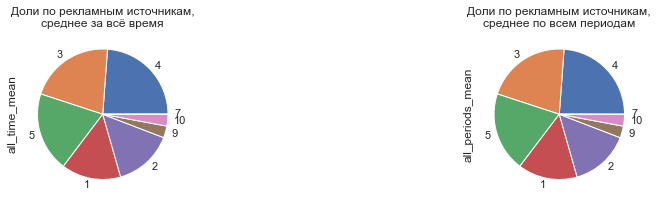

In [65]:
values_by_periods(table=orders_advance,
                  period='buy_month',
                  title='Количество покупок по месяцам',
                  values='revenue',
                  agg='count',
                  show_cohorts=True,)

В среднем за всё время, количество покупок в месяц составляет 4139.

В среднем по когортам, число покупок в месяц уменьшается со временем.

Максимальное количество покупок в месяц было на нулевом месяце использования продукта по всем когортам. Максимум был 4695 у когорты октября 17 года, после чего количество снижалось у следующих когорт до 2460 у когорты мая 18 года. За этот период падение количества покупок в месяц составило 48%.

Количество покупок по месяцам на дату 2017-09-22


,revenue
buy_month,
2017-09-01,3341


Количество покупок по месяцам на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
buy_month,,,,
2017-09-01,2778,563,83.0,17.0


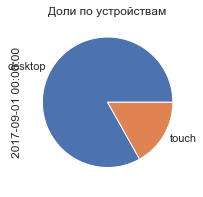

Количество покупок по месяцам на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_month,,,,,,,,,,,,,,,,
2017-09-01,501.0,450.0,727.0,651.0,830.0,NaN,94.0,88.0,15.0,13.0,22.0,19.0,25.0,NaN,3.0,3.0


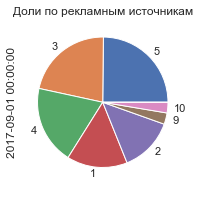

In [66]:
values_by_periods(table=orders_advance,
                  period='buy_month',
                  title='Количество покупок по месяцам на дату',
                  values='revenue',
                  agg='count',
                  date='2017-09-22',)

#### Продажи: сколько раз покупают за период? Вывод

В среднем за всё время, количество покупок в неделю составляет 937. По устройствам: десктопные 83%, мобильные 17%. Топ-3 рекламных источников: 4 (24%), 3 (21%), 5 (20%).

За всё время сделано 49666 покупок, перед которыми покупатели пользовались продуктом.

В среднем за всё время, количество покупок в месяц составляет 4139.

В среднем по когортам, число покупок в месяц уменьшается со временем.

Максимальное количество покупок в месяц было на нулевом месяце использования продукта по всем когортам. Максимум был 4695 у когорты октября 17 года, после чего количество снижалось у следующих когорт до 2460 у когорты мая 18 года. За этот период падение количества покупок в месяц составило 48%.

### Продажи: какой средний чек?

#### Продажи: какой средний чек? (недели)

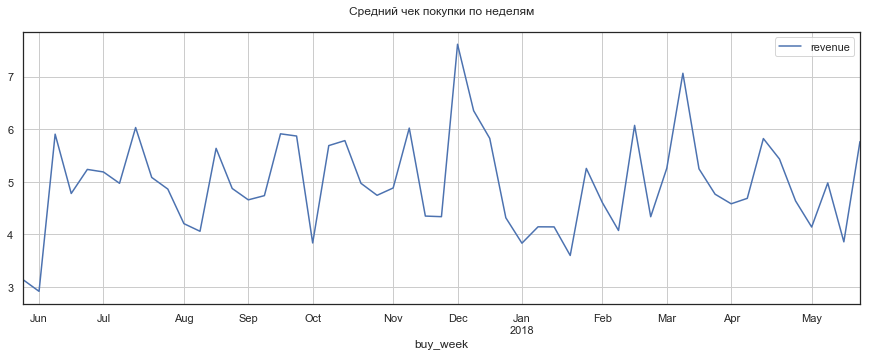

,revenue
buy_week,
2017-05-29,3.1
2017-06-05,2.9
2017-06-12,5.9
2017-06-19,4.8
2017-06-26,5.2
2017-07-03,5.2
2017-07-10,5.0
2017-07-17,6.0
2017-07-24,5.1


Средний чек покупки по неделям за всё время:


,revenue
all_time_mean,5.0
all_periods_mean,5.0


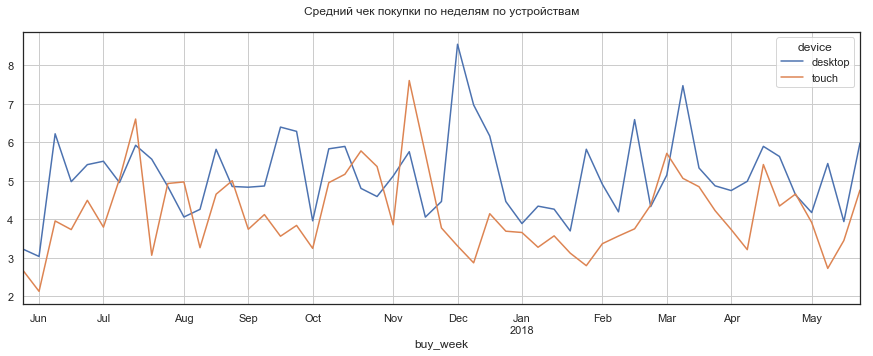

,desktop,touch,desktop_%,touch_%
buy_week,,,,
2017-05-29,3.2,2.7,102.7,85.1
2017-06-05,3.0,2.1,104.0,72.9
2017-06-12,6.2,4.0,105.3,67.0
2017-06-19,5.0,3.7,104.1,78.1
2017-06-26,5.4,4.5,103.5,85.8
2017-07-03,5.5,3.8,106.1,73.1
2017-07-10,5.0,5.0,99.6,101.5
2017-07-17,5.9,6.6,98.2,109.4
2017-07-24,5.6,3.1,109.4,60.3


Средний чек покупки по неделям за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,5.2,4.2,103.5,83.2
all_periods_mean,5.1,4.2,103.3,83.8


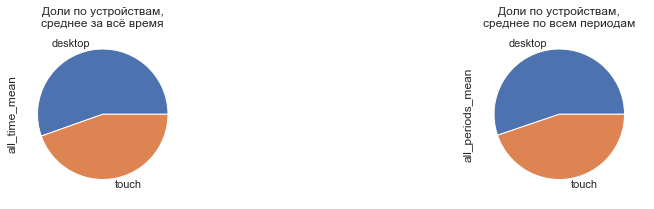

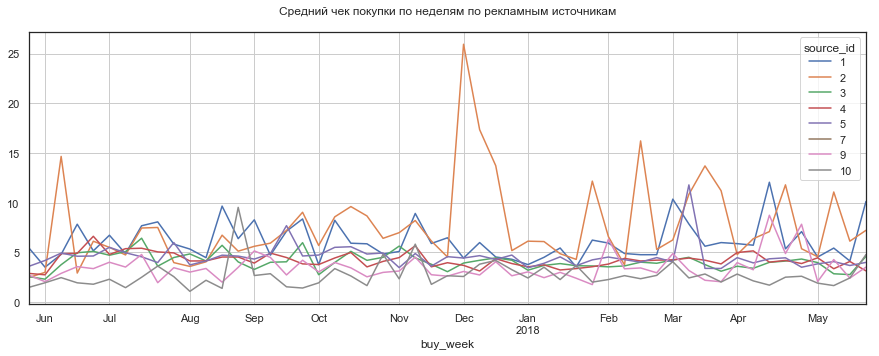

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_week,,,,,,,,,,,,,,,,
2017-05-29,5.4,2.5,2.5,2.9,3.6,NaN,2.7,1.5,173.1,78.5,81.2,91.5,114.4,NaN,85.8,46.9
2017-06-05,3.5,3.0,2.3,2.7,4.2,NaN,2.0,1.9,120.1,102.3,78.7,93.7,143.2,NaN,70.0,66.2
2017-06-12,4.8,14.6,3.7,4.9,4.9,NaN,2.9,2.4,81.1,248.1,63.5,82.5,83.3,NaN,48.7,41.5
2017-06-19,7.8,2.9,5.0,4.9,4.6,NaN,3.6,1.9,163.8,60.9,103.7,102.5,96.3,NaN,74.4,40.3
2017-06-26,5.1,6.1,5.1,6.6,4.6,NaN,3.4,1.8,98.3,116.8,97.3,126.3,88.4,NaN,64.1,34.1
2017-07-03,6.7,5.5,4.7,4.8,5.5,NaN,4.0,2.3,129.5,105.9,90.7,92.2,106.0,NaN,77.1,44.1
2017-07-10,4.9,4.7,5.1,5.4,5.0,NaN,3.5,1.4,97.8,95.2,101.9,107.9,99.7,NaN,70.7,28.9
2017-07-17,7.7,7.4,6.4,5.4,4.5,NaN,4.8,2.5,127.2,123.4,106.4,89.6,75.4,NaN,79.2,41.2
2017-07-24,8.1,7.5,3.6,5.0,4.0,NaN,1.9,3.6,158.6,147.5,70.8,99.1,78.1,NaN,38.2,71.1


Средний чек покупки по неделям за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_mean,6.0,8.4,4.0,4.1,4.5,1.2,3.2,2.7,120.2,168.1,79.1,81.7,90.6,24.3,63.7,54.4
all_periods_mean,6.1,7.6,4.1,4.2,4.6,1.2,3.5,2.7,122.4,153.6,81.8,84.8,91.8,24.6,69.8,54.2


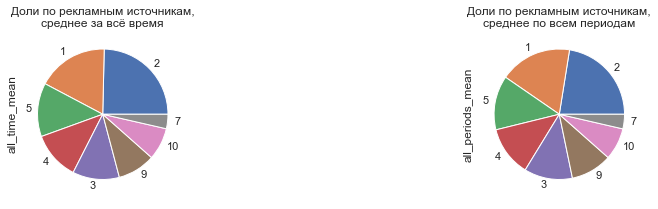

In [67]:
values_by_periods(table=orders_advance,
                  period='buy_week',
                  title='Средний чек покупки по неделям',
                  values='revenue',
                  agg='mean',
                  round=1,)

Средний чек покупки по неделям на дату 2017-06-22 2017-09-22
Распределение данных за период:


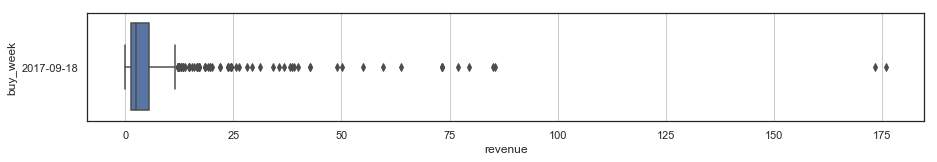

,revenue
buy_week,
2017-09-18,5.9


Средний чек покупки по неделям на дату 2017-06-22 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
buy_week,,,,
2017-09-18,6.4,3.6,108.1,60.2


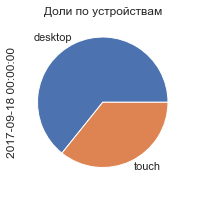

Средний чек покупки по неделям на дату 2017-06-22 2017-09-22 по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_week,,,,,,,,,,,,,,,,
2017-09-18,7.1,7.2,4.0,4.5,7.7,NaN,2.7,1.5,120.5,121.6,68.4,75.7,129.9,NaN,46.0,25.8


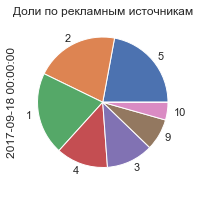

In [68]:
values_by_periods(table=orders_advance,
                  period='buy_week',
                  title='Средний чек покупки по неделям на дату 2017-06-22',
                  values='revenue',
                  agg='mean',
                  date='2017-09-22',
                  round=1)

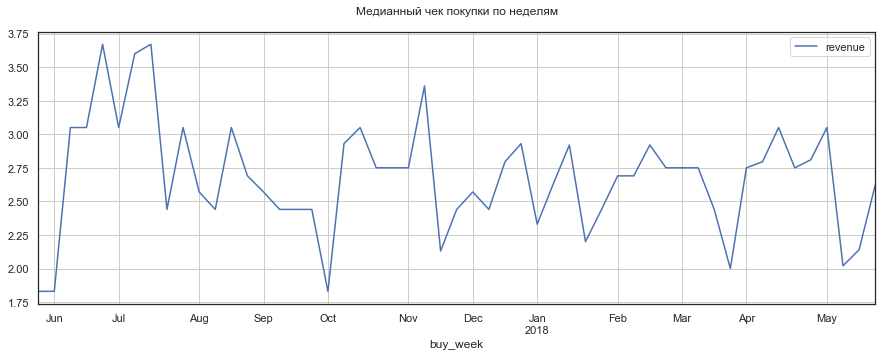

,revenue
buy_week,
2017-05-29,1.8
2017-06-05,1.8
2017-06-12,3.0
2017-06-19,3.0
2017-06-26,3.7
2017-07-03,3.0
2017-07-10,3.6
2017-07-17,3.7
2017-07-24,2.4


Медианный чек покупки по неделям за всё время:


,revenue
all_time_median,2.5
all_periods_median,2.8


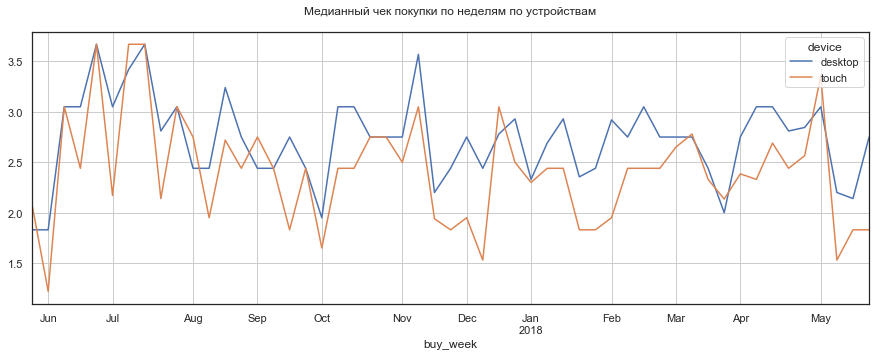

,desktop,touch,desktop_%,touch_%
buy_week,,,,
2017-05-29,1.8,2.1,100.0,113.7
2017-06-05,1.8,1.2,100.0,66.7
2017-06-12,3.0,3.0,100.0,100.0
2017-06-19,3.0,2.4,100.0,80.0
2017-06-26,3.7,3.7,100.0,100.0
2017-07-03,3.0,2.2,100.0,71.1
2017-07-10,3.4,3.7,95.0,101.9
2017-07-17,3.7,3.7,100.0,100.0
2017-07-24,2.8,2.1,115.2,87.7


Медианный чек покупки по неделям за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,2.7,2.4,107.6,97.6
all_periods_median,2.8,2.4,100.0,88.7


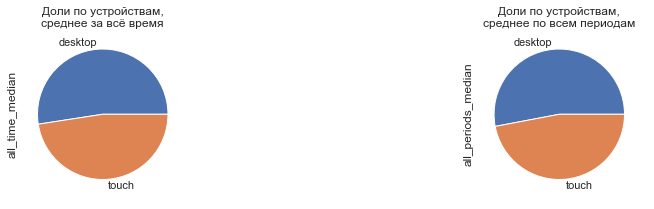

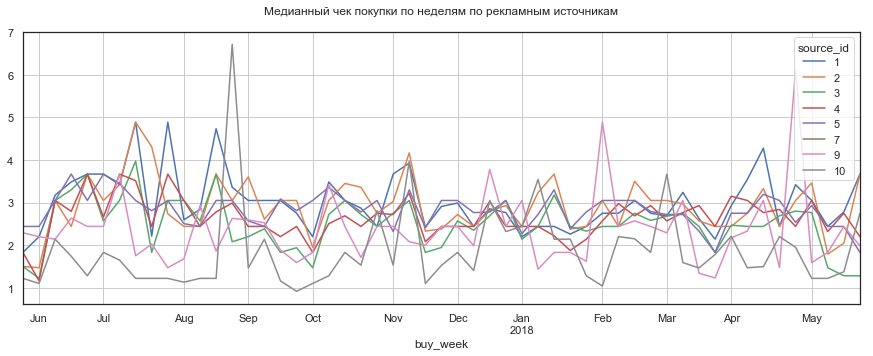

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_week,,,,,,,,,,,,,,,,
2017-05-29,1.8,1.5,1.5,1.8,2.4,NaN,2.3,1.2,100.0,82.0,82.0,100.0,133.3,NaN,125.1,66.7
2017-06-05,2.2,1.5,1.2,1.2,2.4,NaN,2.2,1.1,120.2,80.3,66.7,63.4,133.3,NaN,120.2,60.1
2017-06-12,3.2,3.0,3.0,3.0,3.0,NaN,2.1,2.1,104.1,100.0,100.0,100.0,100.0,NaN,70.2,70.2
2017-06-19,3.5,2.4,3.3,2.8,3.7,NaN,2.6,1.7,114.3,80.0,108.2,91.6,120.3,NaN,86.4,57.0
2017-06-26,3.7,3.7,3.7,3.7,3.0,NaN,2.4,1.3,100.0,100.0,100.0,100.0,83.1,NaN,66.5,34.9
2017-07-03,3.7,3.0,2.6,2.7,3.7,NaN,2.4,1.8,120.3,100.0,84.3,87.2,120.3,NaN,80.0,60.0
2017-07-10,3.4,3.4,3.0,3.7,3.4,NaN,3.7,1.6,95.0,95.0,84.7,101.9,95.8,NaN,101.9,45.8
2017-07-17,4.9,4.9,4.0,3.5,3.0,NaN,1.8,1.2,133.2,133.2,108.3,95.8,83.1,NaN,47.7,33.2
2017-07-24,2.2,4.3,1.8,2.4,2.8,NaN,2.0,1.2,90.6,176.6,75.0,100.0,115.2,NaN,83.0,50.0


Медианный чек покупки по неделям за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_median,2.8,2.8,2.4,2.4,2.8,1.2,2.1,1.7,112.4,112.4,97.6,97.6,112.4,48.8,85.6,69.2
all_periods_median,2.9,3.0,2.5,2.6,2.8,1.2,2.3,1.5,104.4,108.0,89.8,93.5,102.2,44.4,83.3,55.6


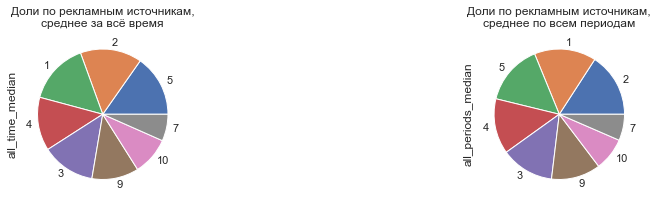

In [69]:
values_by_periods(table=orders_advance,
                  period='buy_week',
                  title='Медианный чек покупки по неделям',
                  values='revenue',
                  agg='median',
                  round=1)

#### Продажи: какой средний чек? (месяцы)

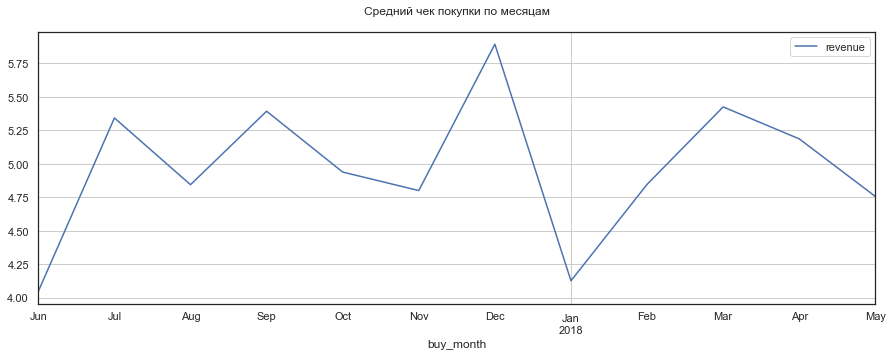

,revenue
buy_month,
2017-06-01,4.0
2017-07-01,5.3
2017-08-01,4.8
2017-09-01,5.4
2017-10-01,4.9
2017-11-01,4.8
2017-12-01,5.9
2018-01-01,4.1
2018-02-01,4.8


Средний чек покупки по месяцам за всё время:


,revenue
all_time_mean,5.0
all_periods_mean,5.0


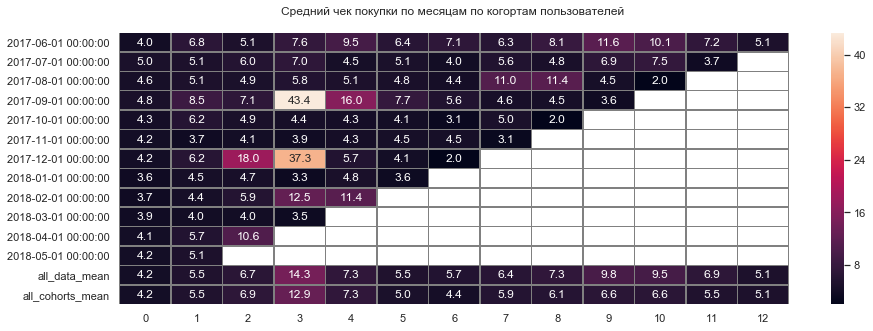

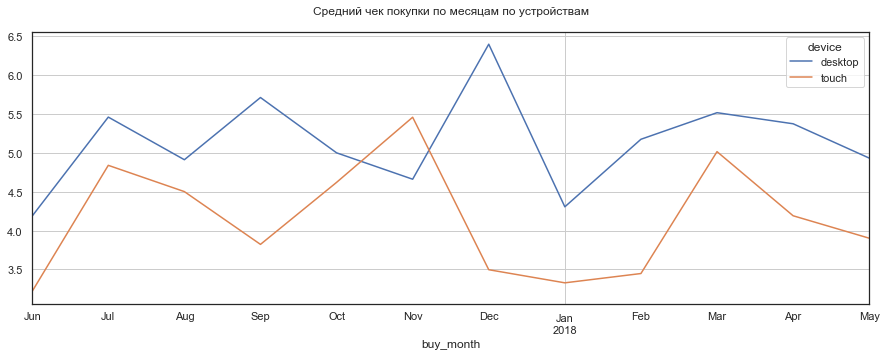

,desktop,touch,desktop_%,touch_%
buy_month,,,,
2017-06-01,4.2,3.2,103.5,79.6
2017-07-01,5.5,4.8,102.2,90.6
2017-08-01,4.9,4.5,101.4,92.9
2017-09-01,5.7,3.8,105.9,70.9
2017-10-01,5.0,4.6,101.3,93.6
2017-11-01,4.7,5.5,97.1,113.7
2017-12-01,6.4,3.5,108.5,59.3
2018-01-01,4.3,3.3,104.4,80.7
2018-02-01,5.2,3.4,106.8,71.2


Средний чек покупки по месяцам за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_mean,5.2,4.2,103.5,83.2
all_periods_mean,5.1,4.2,103.4,83.6


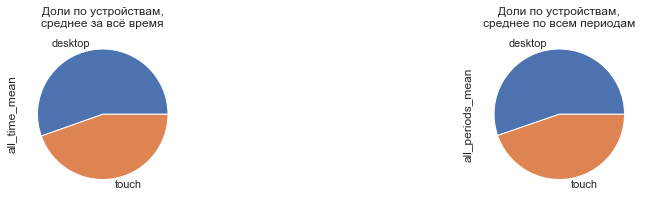

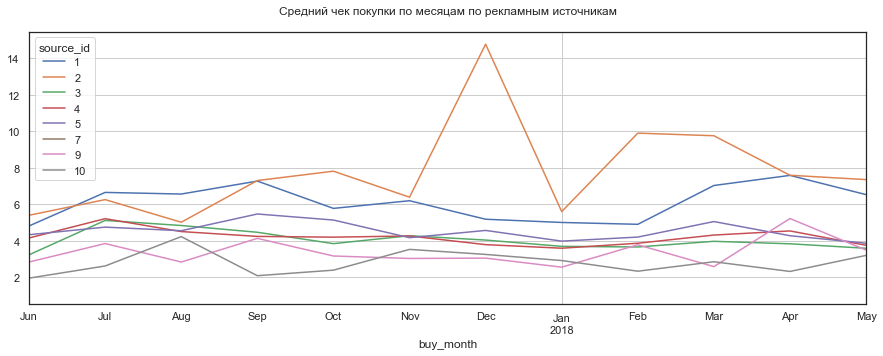

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_month,,,,,,,,,,,,,,,,
2017-06-01,4.8,5.4,3.2,4.1,4.3,NaN,2.8,1.9,118.7,133.2,79.7,102.4,106.8,NaN,69.8,48.0
2017-07-01,6.6,6.2,5.1,5.2,4.7,NaN,3.8,2.6,124.3,117.0,95.6,97.4,88.7,NaN,71.9,48.8
2017-08-01,6.6,5.0,4.8,4.5,4.5,1.2,2.8,4.2,135.3,103.4,99.7,92.8,93.8,25.2,58.3,87.1
2017-09-01,7.3,7.3,4.5,4.2,5.5,NaN,4.1,2.1,134.7,135.3,82.6,78.4,101.2,NaN,76.5,38.5
2017-10-01,5.8,7.8,3.8,4.2,5.1,NaN,3.2,2.4,116.8,158.1,77.7,84.8,103.8,NaN,63.9,48.2
2017-11-01,6.2,6.4,4.3,4.3,4.2,NaN,3.0,3.5,128.9,133.0,88.9,88.6,86.7,NaN,62.9,73.3
2017-12-01,5.2,14.8,4.0,3.8,4.6,NaN,3.0,3.2,87.7,250.6,68.4,64.1,77.3,NaN,51.6,55.0
2018-01-01,5.0,5.6,3.7,3.6,4.0,NaN,2.5,2.9,121.1,135.6,89.3,86.9,96.3,NaN,61.7,70.5
2018-02-01,4.9,9.9,3.7,3.9,4.2,NaN,3.8,2.3,101.0,204.2,75.3,79.6,86.5,NaN,77.8,47.9


Средний чек покупки по месяцам за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_mean,6.0,8.4,4.0,4.1,4.5,1.2,3.2,2.7,120.2,168.1,79.1,81.7,90.6,24.3,63.7,54.4
all_periods_mean,6.1,7.8,4.0,4.2,4.5,1.2,3.4,2.8,123.2,156.2,81.3,84.4,91.0,24.6,67.8,56.3


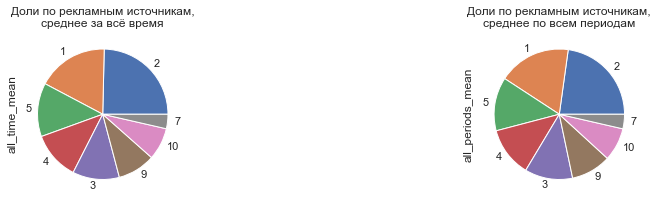

In [70]:
values_by_periods(table=orders_advance,
                  period='buy_month',
                  title='Средний чек покупки по месяцам',
                  values='revenue',
                  agg='mean',
                  round=1,
                  show_cohorts=True,)

За всё время средний чек равняется 5.0. По устройствам: десктопные 5.2, мобильные 4.2. Топ-3 рекламных источников: 2 (8.4), 1 (6.0), 5 (4.5).

Особенно выделяются по большому среднему чеку когорты сентября и декабря 17 года.

Средний чек покупки по месяцам на дату 2017-09-22
Распределение данных за период:


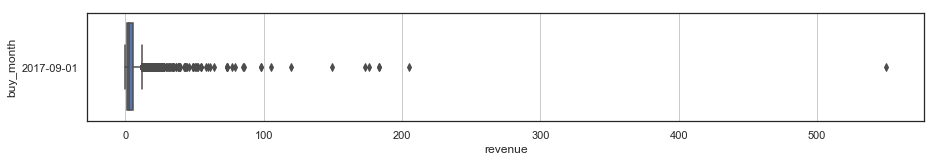

,revenue
buy_month,
2017-09-01,5.4


Средний чек покупки по месяцам на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
buy_month,,,,
2017-09-01,5.7,3.8,105.9,70.9


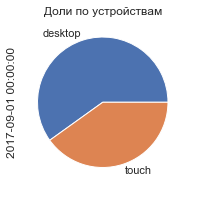

Средний чек покупки по месяцам на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_month,,,,,,,,,,,,,,,,
2017-09-01,7.3,7.3,4.5,4.2,5.5,NaN,4.1,2.1,134.7,135.3,82.6,78.4,101.2,NaN,76.5,38.5


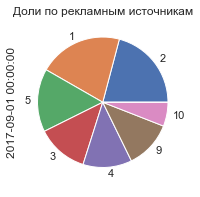

In [71]:
values_by_periods(table=orders_advance,
                  period='buy_month',
                  title='Средний чек покупки по месяцам на дату',
                  values='revenue',
                  agg='mean',
                  date='2017-09-22',
                  round=1)

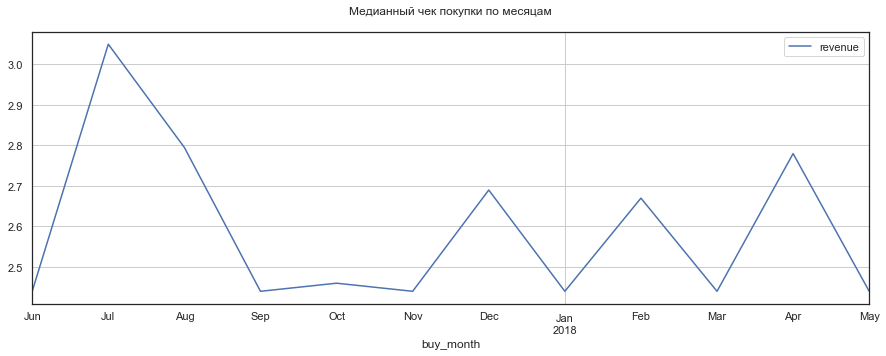

,revenue
buy_month,
2017-06-01,2.4
2017-07-01,3.0
2017-08-01,2.8
2017-09-01,2.4
2017-10-01,2.5
2017-11-01,2.4
2017-12-01,2.7
2018-01-01,2.4
2018-02-01,2.7


Медианный чек покупки по месяцам за всё время:


,revenue
all_time_median,2.5
all_periods_median,2.4


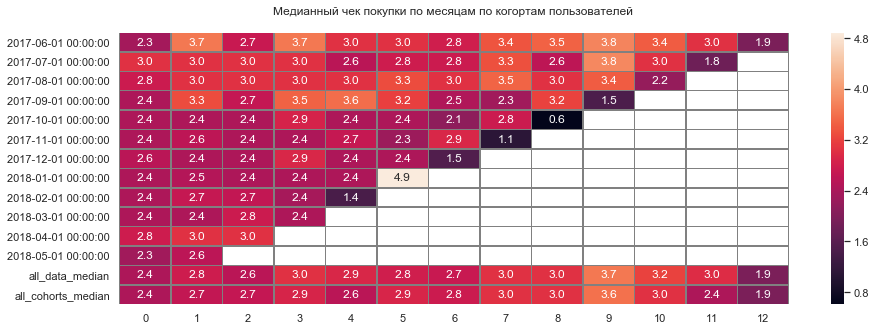

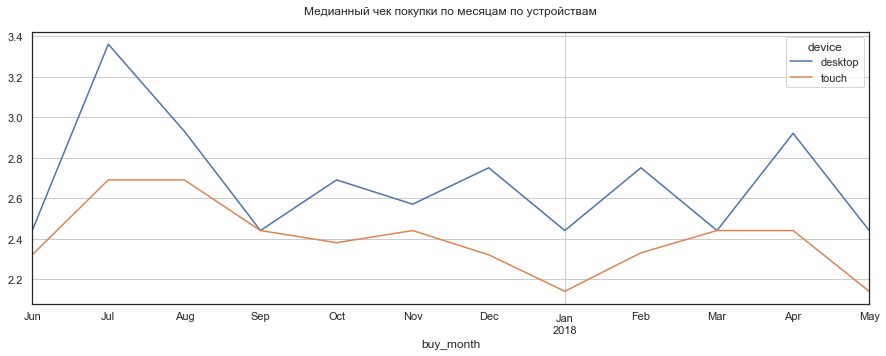

,desktop,touch,desktop_%,touch_%
buy_month,,,,
2017-06-01,2.4,2.3,100.0,95.1
2017-07-01,3.4,2.7,110.2,88.2
2017-08-01,2.9,2.7,104.8,96.2
2017-09-01,2.4,2.4,100.0,100.0
2017-10-01,2.7,2.4,109.3,96.7
2017-11-01,2.6,2.4,105.3,100.0
2017-12-01,2.8,2.3,102.2,86.2
2018-01-01,2.4,2.1,100.0,87.7
2018-02-01,2.8,2.3,103.0,87.3


Медианный чек покупки по месяцам за всё время по устройствам:


,desktop,touch,desktop_%,touch_%
all_time_median,2.7,2.4,107.6,97.6
all_periods_median,2.6,2.4,107.3,98.4


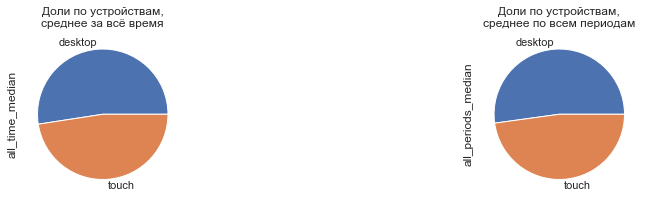

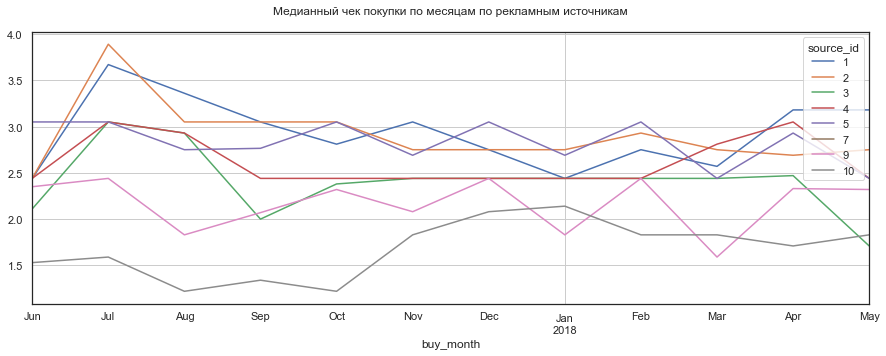

,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_month,,,,,,,,,,,,,,,,
2017-06-01,2.4,2.4,2.1,2.4,3.0,NaN,2.3,1.5,100.0,100.0,86.5,100.0,125.0,NaN,96.3,62.7
2017-07-01,3.7,3.9,3.0,3.0,3.0,NaN,2.4,1.6,120.3,127.5,100.0,100.0,100.0,NaN,80.0,52.1
2017-08-01,3.4,3.0,2.9,2.9,2.8,1.2,1.8,1.2,120.2,109.1,104.8,104.8,98.4,43.6,65.5,43.6
2017-09-01,3.0,3.0,2.0,2.4,2.8,NaN,2.1,1.3,125.0,125.0,82.0,100.0,113.3,NaN,84.8,54.9
2017-10-01,2.8,3.0,2.4,2.4,3.0,NaN,2.3,1.2,114.2,124.0,96.7,99.2,124.0,NaN,94.3,49.6
2017-11-01,3.0,2.8,2.4,2.4,2.7,NaN,2.1,1.8,125.0,112.7,100.0,100.0,110.2,NaN,85.2,75.0
2017-12-01,2.8,2.8,2.4,2.4,3.0,NaN,2.4,2.1,102.2,102.2,90.7,90.7,113.4,NaN,90.7,77.3
2018-01-01,2.4,2.8,2.4,2.4,2.7,NaN,1.8,2.1,100.0,112.7,100.0,100.0,110.2,NaN,75.0,87.7
2018-02-01,2.8,2.9,2.4,2.4,3.0,NaN,2.4,1.8,103.0,109.7,91.4,91.4,114.2,NaN,91.4,68.5


Медианный чек покупки по месяцам за всё время по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
all_time_median,2.8,2.8,2.4,2.4,2.8,1.2,2.1,1.7,112.4,112.4,97.6,97.6,112.4,48.8,85.6,69.2
all_periods_median,2.9,2.8,2.4,2.4,2.8,1.2,2.3,1.8,119.6,112.2,99.6,99.6,116.2,49.8,94.7,72.2


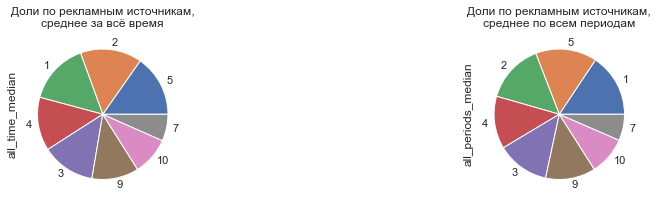

In [72]:
values_by_periods(table=orders_advance,
                  period='buy_month',
                  title='Медианный чек покупки по месяцам',
                  values='revenue',
                  agg='median',
                  round=1,
                  show_cohorts=True,)

За всё время медианный чек равняется 2.5. По устройствам: десктопные 2.7, мобильные 2.4. Топ-3 рекламных источников: 1, 2 и 5 (2.8).

Со временем медианный чек по когортам немного увеличивается.

Медианны чек покупки по месяцам на дату 2017-09-22
Распределение данных за период:


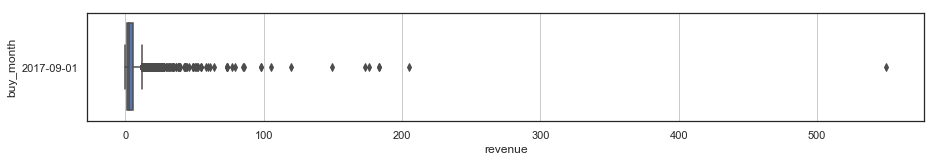

,revenue
buy_month,
2017-09-01,2.4


Медианны чек покупки по месяцам на дату 2017-09-22 по устройствам:


,desktop,touch,desktop_%,touch_%
buy_month,,,,
2017-09-01,2.4,2.4,100.0,100.0


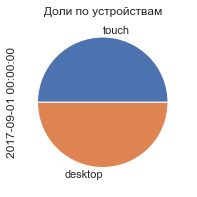

Медианны чек покупки по месяцам на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,7,9,10,1_%,2_%,3_%,4_%,5_%,7_%,9_%,10_%
buy_month,,,,,,,,,,,,,,,,
2017-09-01,3.0,3.0,2.0,2.4,2.8,NaN,2.1,1.3,125.0,125.0,82.0,100.0,113.3,NaN,84.8,54.9


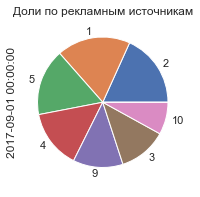

In [73]:
values_by_periods(table=orders_advance,
                  period='buy_month',
                  title='Медианны чек покупки по месяцам на дату',
                  values='revenue',
                  agg='median',
                  date='2017-09-22',
                  round=1)

#### Продажи: какой средний чек? Вывод

За всё время средний чек равняется 5.0. По устройствам: десктопные 5.2, мобильные 4.2. Топ-3 рекламных источников: 2 (8.4), 1 (6.0), 5 (4.5).

Особенно выделяются по большому среднему чеку когорты сентября и декабря 17 года.

За всё время медианный чек равняется 2.5. По устройствам: десктопные 2.7, мобильные 2.4. Топ-3 рекламных источников: 1, 2 и 5 (2.8).

Со временем медианный чек по когортам немного увеличивается.

### Продажи: сколько денег приносят? (LTV)

#### Продажи: сколько денег приносят? (LTV) (месячные когорты)

Все посетители 

Средний накопительный LTV за 12 месяцев после первого визита: 1.8


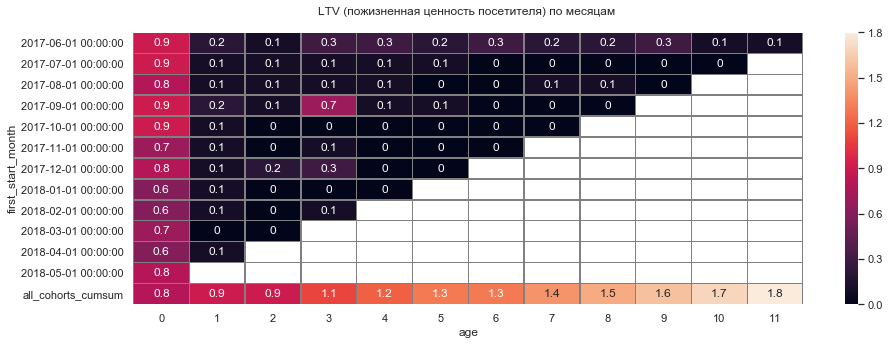

In [74]:
print('Все посетители', '\n')
cohorts(table=visits_advance_with_buys,
        metrics='ltv',
        period='start_month',
        title='LTV (пожизненная ценность посетителя) по месяцам',
        title_6_months='после первого визита',
        heatmap=True,)

Когорты посетителей. Средний накопительный LTV по всем когортам увеличился с 0.8 в нулевом месяце до 1.8 в 11 месяце.  Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV в разы больше, чем у других когорт.

Только покупатели 

Средний накопительный LTV за 12 месяцев после первой покупки: 9.2


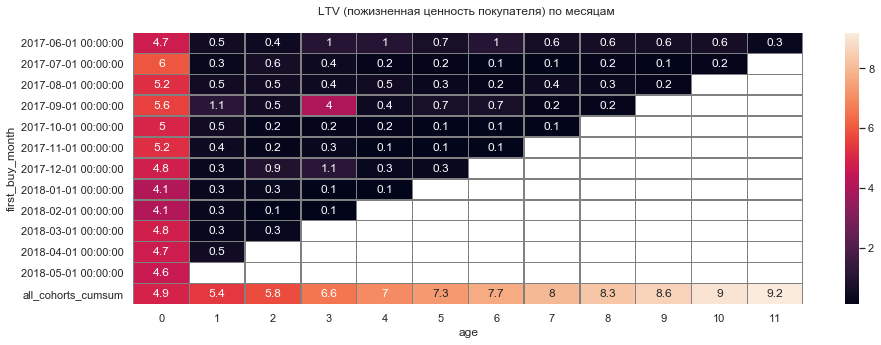

In [75]:
print('Только покупатели', '\n')
cohorts(table=orders_advance,
        metrics='ltv',
        period='buy_month',
        title='LTV (пожизненная ценность покупателя) по месяцам',
        title_6_months='после первой покупки',
        heatmap=True,)

Когорты покупателей. Средний накопительный LTV по всем когортам увеличился с 4.9 в нулевом месяце до 9.2 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

Все посетители 

source_id = 1:

Средний накопительный LTV за 12 месяцев после первого визита: 4.4


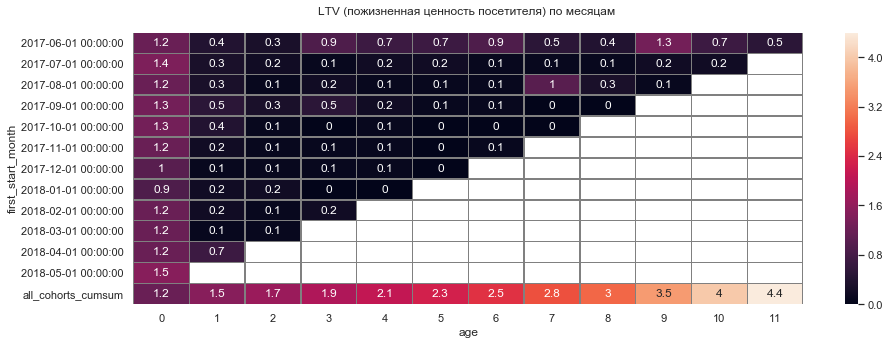

source_id = 2:

Средний накопительный LTV за 12 месяцев после первого визита: 3.6


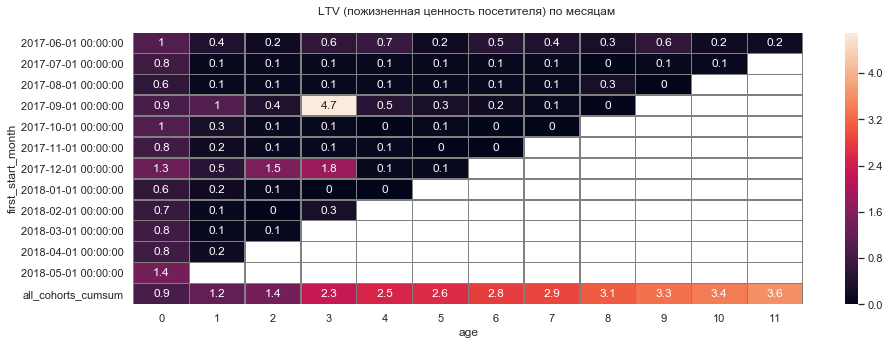

source_id = 3:

Средний накопительный LTV за 12 месяцев после первого визита: 0.7


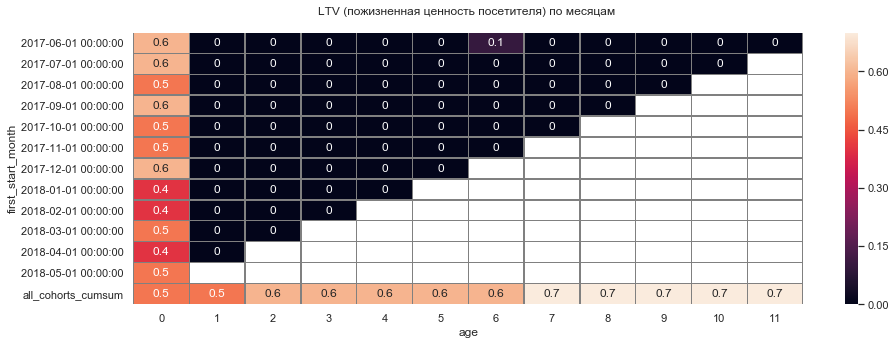

source_id = 4:

Средний накопительный LTV за 12 месяцев после первого визита: 0.8


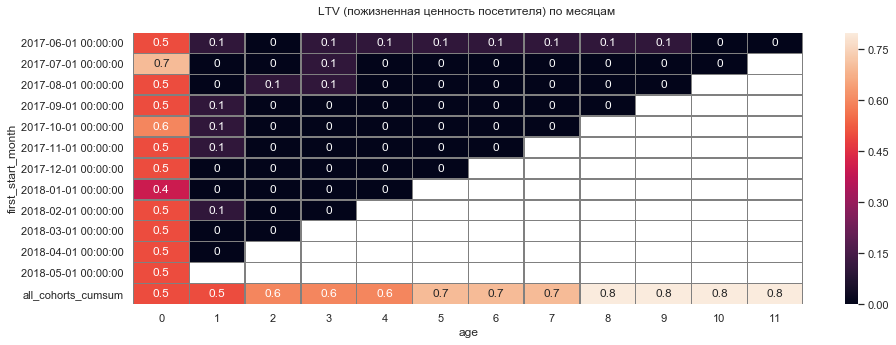

source_id = 5:

Средний накопительный LTV за 12 месяцев после первого визита: 1.1


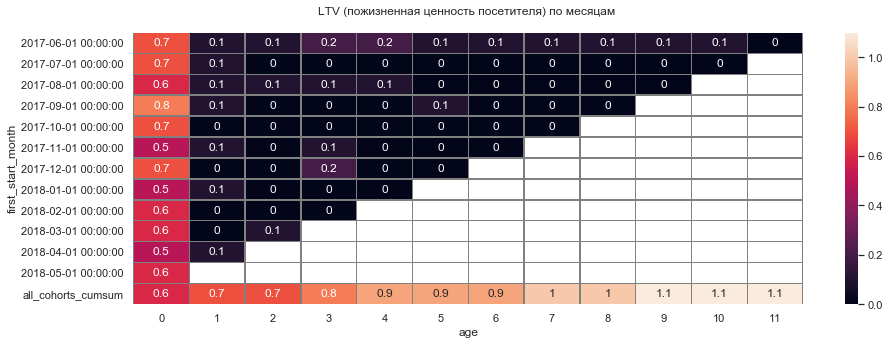

source_id = 6:

There are no much values to calculate 

source_id = 7:

There are no much values to calculate 

source_id = 9:

Средний накопительный LTV за 12 месяцев после первого визита: 0.7


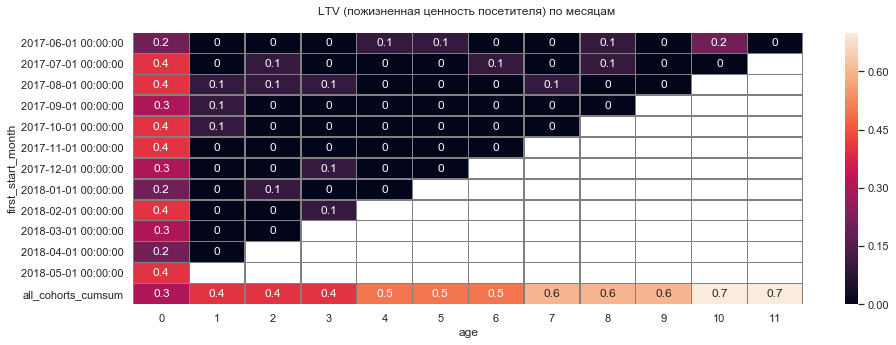

source_id = 10:

Средний накопительный LTV за 12 месяцев после первого визита: 0.6


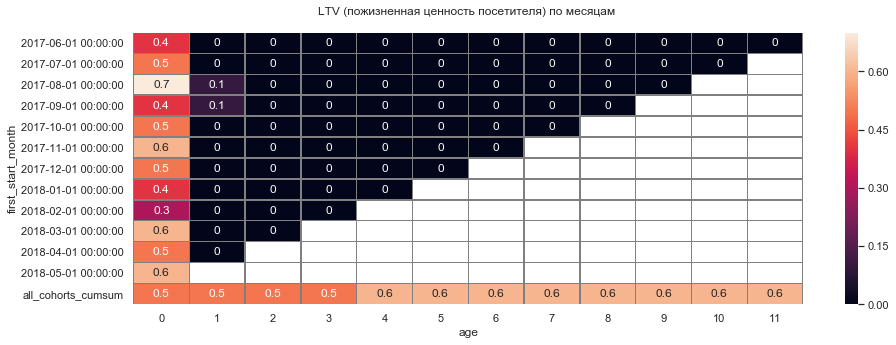

device = desktop:

Средний накопительный LTV за 12 месяцев после первого визита: 2.1


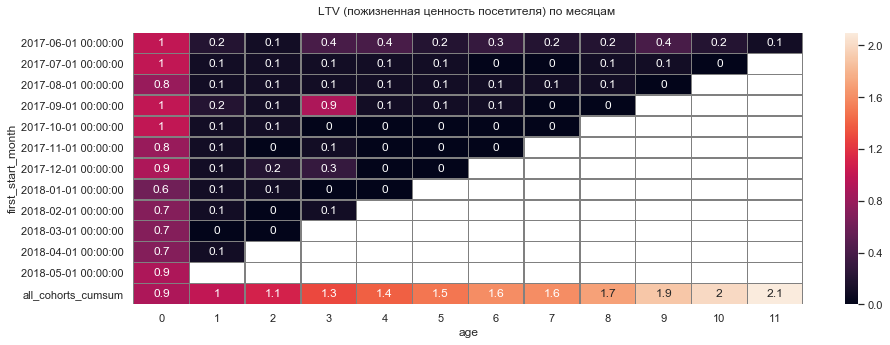

device = touch:

Средний накопительный LTV за 12 месяцев после первого визита: 0.8


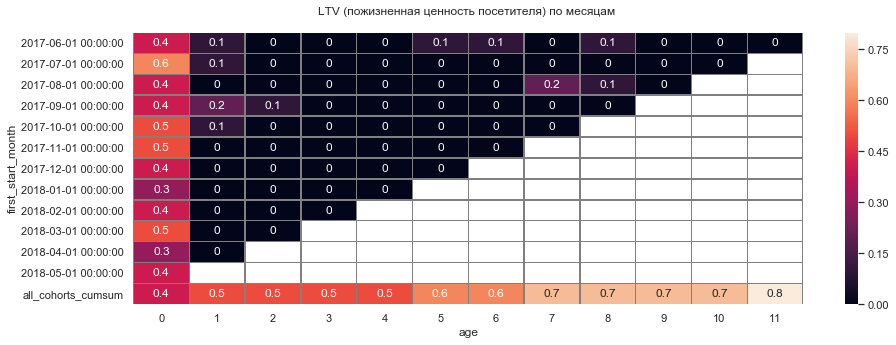

In [76]:
print('Все посетители', '\n')
for j in visits_advance_with_buys['source_id'].sort_values().unique():
    print(f'source_id = {j}:\n')
    cohorts(table=visits_advance_with_buys.query('source_id == @j'),
            metrics='ltv',
            period='start_month',
            title='LTV (пожизненная ценность посетителя) по месяцам',
            title_6_months='после первого визита',
            heatmap=True,)
for j in visits_advance_with_buys['device'].sort_values().unique():
    print(f'device = {j}:\n')
    cohorts(table=visits_advance_with_buys.query('device == @j'),
            metrics='ltv',
            period='start_month',
            title='LTV (пожизненная ценность посетителя) по месяцам',
            title_6_months='после первого визита',
            heatmap=True,)

Когорты посетителей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 1, увеличился с 1.2 в нулевом месяце до 4.4 в 11 месяце.

Только покупатели 

source_id = 1:

Средний накопительный LTV за 12 месяцев после первой покупки: 14.3


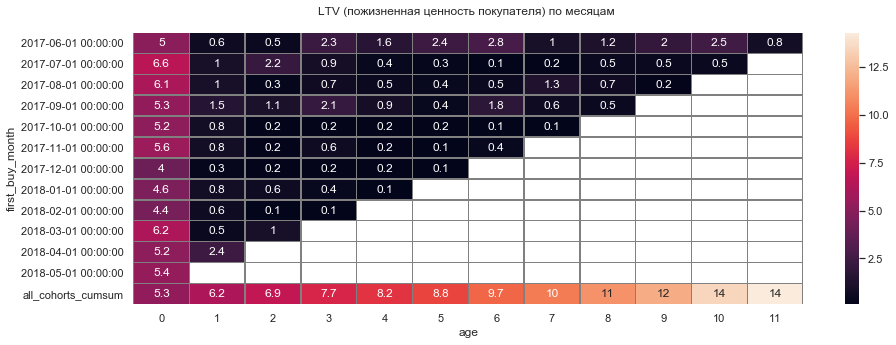

source_id = 2:

Средний накопительный LTV за 12 месяцев после первой покупки: 17.5


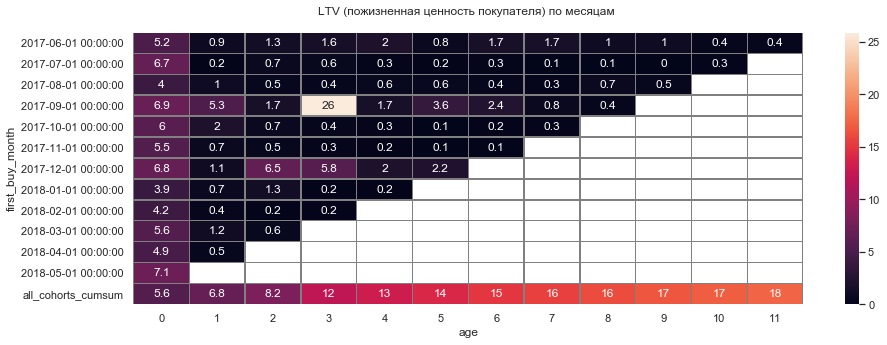

source_id = 3:

Средний накопительный LTV за 12 месяцев после первой покупки: 4.9


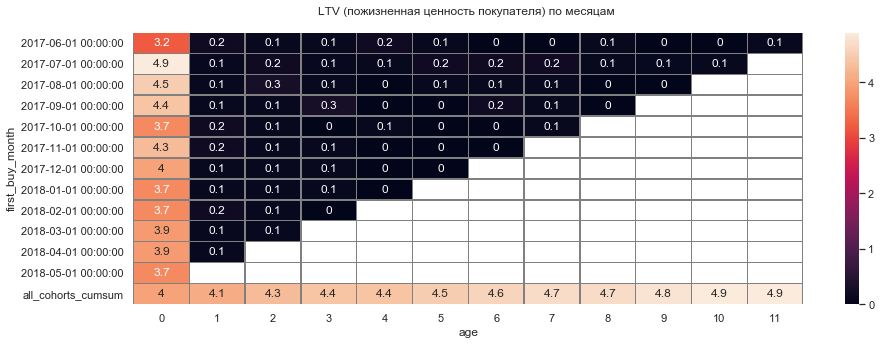

source_id = 4:

Средний накопительный LTV за 12 месяцев после первой покупки: 5.5


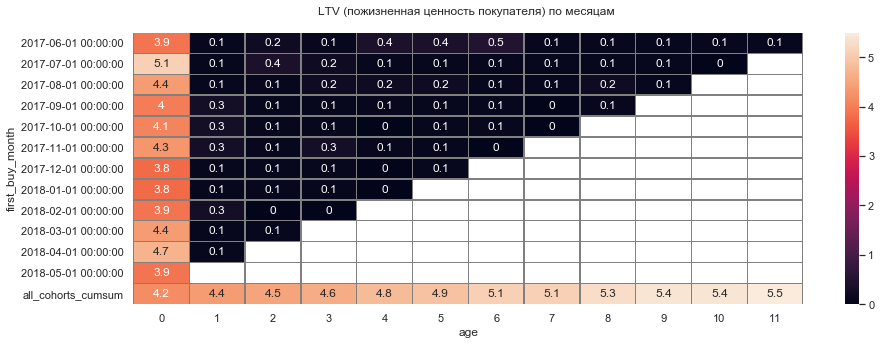

source_id = 5:

Средний накопительный LTV за 12 месяцев после первой покупки: 7.1


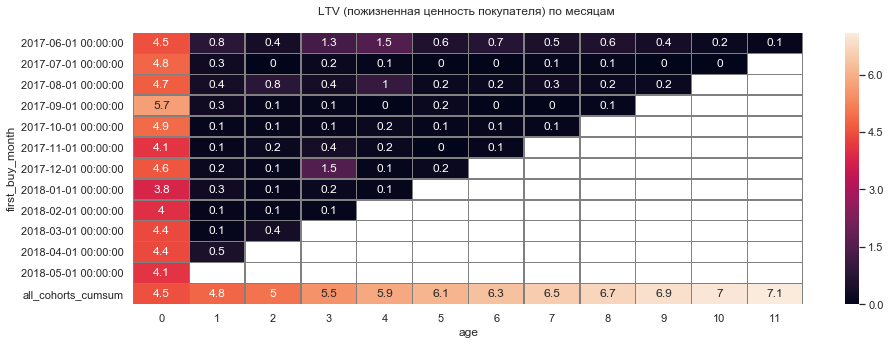

source_id = 7:

There are no much values to calculate 

source_id = 9:

There are no much values to calculate 

source_id = 10:

Средний накопительный LTV за 12 месяцев после первой покупки: 3.4


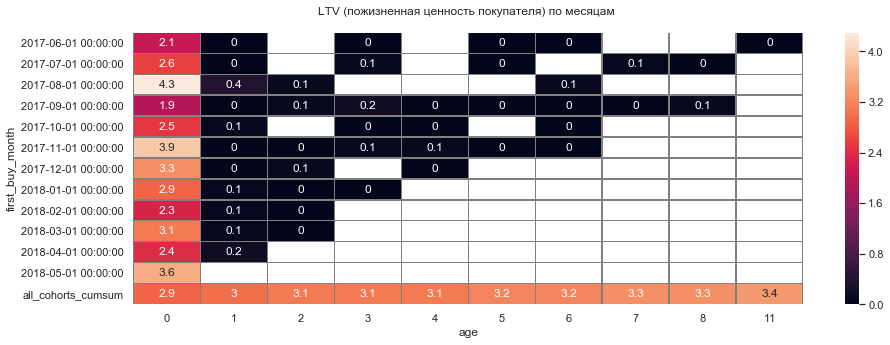

device = desktop:

Средний накопительный LTV за 12 месяцев после первой покупки: 9.8


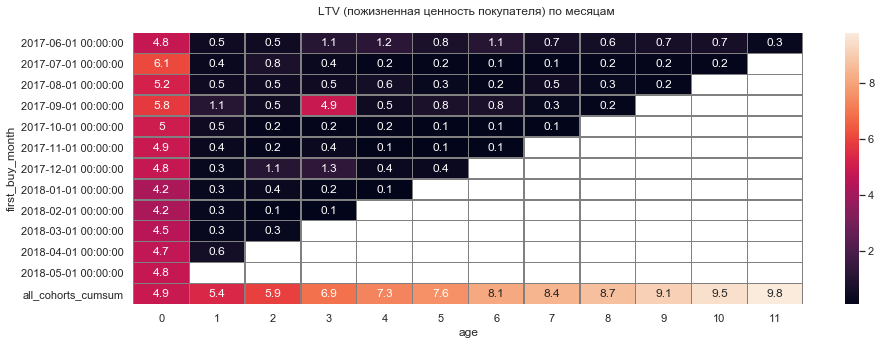

device = touch:

Средний накопительный LTV за 12 месяцев после первой покупки: 5.7


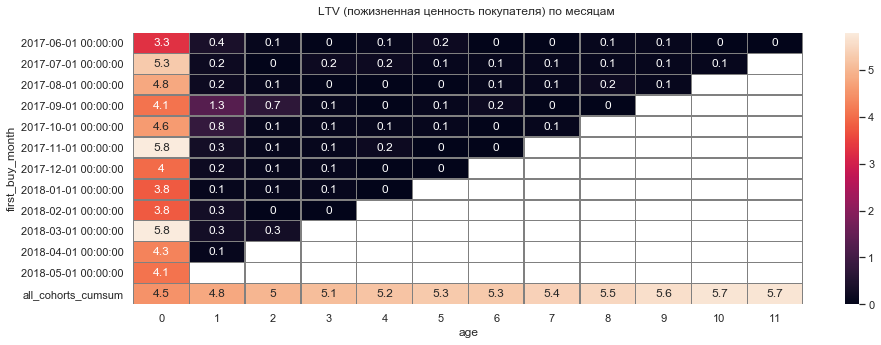

In [77]:
print('Только покупатели', '\n')
for j in orders_advance['source_id'].sort_values().unique():
    print(f'source_id = {j}:\n')
    cohorts(table=orders_advance.query('source_id == @j'),
            metrics='ltv',
            period='buy_month',
            title='LTV (пожизненная ценность покупателя) по месяцам',
            title_6_months='после первой покупки',
            heatmap=True,)
for j in orders_advance['device'].sort_values().unique():
    print(f'device = {j}:\n')
    cohorts(table=orders_advance.query('device == @j'),
            metrics='ltv',
            period='buy_month',
            title='LTV (пожизненная ценность покупателя) по месяцам',
            title_6_months='после первой покупки',
            heatmap=True,)

Когорты покупателей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 2, увеличился с 5.6 в нулевом месяце до 18 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

#### Продажи: сколько денег приносят? (LTV) Вывод

Когорты посетителей. Средний накопительный LTV по всем когортам увеличился с 0.8 в нулевом месяце до 1.8 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV в разы больше, чем у других когорт.

Когорты посетителей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 1, увеличился с 1.2 в нулевом месяце до 4.4 в 11 месяце.

Когорты покупателей. Средний накопительный LTV по всем когортам увеличился с 4.9 в нулевом месяце до 9.2 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

Когорты покупателей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 2, увеличился с 5.6 в нулевом месяце до 18 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

### Продажи. Вывод

#### Продажи:  когда люди начинают покупать?

Доля повторных покупок от общего количества покупок 26.5%

Не имеет смысла рассчитывать начало покупок на больших периодах: всего одна покупка в конце рассматриваемого периода очень сильно сместит среднее и исказит результат.

Среднее время первой покупки в течение первых суток использования продукта за всё время составляет 77 мин. По устройствам: десктопные 73 мин, мобильные 94 мин. Топ-3 рекламных источников: 1 (147 мин), 2 (113 мин), 9 (80 мин).

Среднее время первой покупки в течение первой недели использования продукта за всё время составляет 487 мин. По устройствам: десктопные 457 мин, мобильные 626 мин. Топ-3 рекламных источников: 7 (52 мин), 5 (356 мин), 3 (390 мин).

Медианное время первой покупки в течение первых суток использования продукта за всё время составляет 7 мин. По устройствам: десктопные и мобильные по 7 мин. Топ-3 рекламных источников: 5 и 10 (6 мин), 2, 3 и 4 (7 мин).

Медианное время первой покупки в течение первой недели использования продукта за всё время составляет 9 мин. По устройствам: десктопные и мобильные по 9 мин. Топ-3 рекламных источников: 5 и 10 (7 мин), 3 и 4 (8 мин).

#### Продажи:  сколько раз покупают за период?

В среднем за всё время, количество покупок в неделю составляет 937. По устройствам: десктопные 83%, мобильные 17%. Топ-3 рекламных источников: 4 (24%), 3 (21%), 5 (20%).

За всё время сделано 49666 покупок, перед которыми покупатели пользовались продуктом.

В среднем за всё время, количество покупок в месяц составляет 4139.

В среднем по когортам, число покупок в месяц уменьшается со временем.

Максимальное количество покупок в месяц было на нулевом месяце использования продукта по всем когортам. Максимум был 4695 у когорты октября 17 года, после чего количество снижалось у следующих когорт до 2460 у когорты мая 18 года. За этот период падение количества покупок в месяц составило 48%.

#### Продажи:  какой средний чек?

За всё время средний чек равняется 5.0. По устройствам: десктопные 5.2, мобильные 4.2. Топ-3 рекламных источников: 2 (8.4), 1 (6.0), 5 (4.5).

Особенно выделяются по большому среднему чеку когорты сентября и декабря 17 года.

За всё время медианный чек равняется 2.5. По устройствам: десктопные 2.7, мобильные 2.4. Топ-3 рекламных источников: 1, 2 и 5 (2.8).

Со временем медианный чек по когортам немного увеличивается.

#### Продажи:  сколько денег приносят? (LTV)

Когорты посетителей. Средний накопительный LTV по всем когортам увеличился с 0.8 в нулевом месяце до 1.8 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV в разы больше, чем у других когорт.

Когорты посетителей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 1, увеличился с 1.2 в нулевом месяце до 4.4 в 11 месяце.

Когорты покупателей. Средний накопительный LTV по всем когортам увеличился с 4.9 в нулевом месяце до 9.2 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

Когорты покупателей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 2, увеличился с 5.6 в нулевом месяце до 18 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

### Маркетинг: сколько денег потратили? Всего / на каждый источник / по времени

#### Маркетинг: сколько денег потратили? Всего / на каждый источник / по времени (дни)

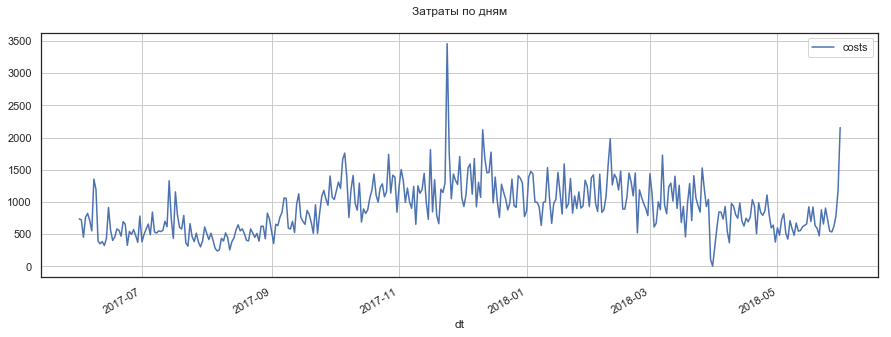

,costs
dt,
2017-06-01,735.0
2017-06-02,721.0
2017-06-03,451.0
2017-06-04,761.0
2017-06-05,821.0
...,...
2018-05-27,533.0
2018-05-28,619.0
2018-05-29,785.0


Затраты по дням за всё время:


,costs
all_time_sum,329132.0
all_time_mean,904.0
all_periods_mean,904.0


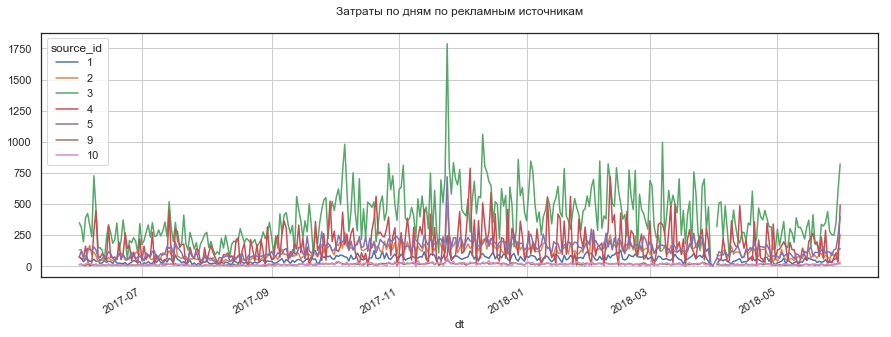

,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
dt,,,,,,,,,,,,,,
2017-06-01,75.0,133.0,349.0,77.0,73.0,13.0,15.0,10.0,18.0,48.0,10.0,10.0,2.0,2.0
2017-06-02,62.0,132.0,314.0,59.0,124.0,18.0,11.0,9.0,18.0,44.0,8.0,17.0,3.0,2.0
2017-06-03,37.0,77.0,196.0,59.0,65.0,7.0,10.0,8.0,17.0,44.0,13.0,14.0,2.0,2.0
2017-06-04,55.0,79.0,390.0,162.0,53.0,5.0,18.0,7.0,10.0,51.0,21.0,7.0,1.0,2.0
2017-06-05,57.0,109.0,424.0,45.0,144.0,15.0,27.0,7.0,13.0,52.0,5.0,18.0,2.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-05-27,31.0,113.0,255.0,28.0,85.0,11.0,10.0,6.0,21.0,48.0,5.0,16.0,2.0,2.0
2018-05-28,54.0,83.0,248.0,69.0,132.0,12.0,21.0,9.0,13.0,40.0,11.0,21.0,2.0,3.0
2018-05-29,61.0,106.0,348.0,104.0,138.0,17.0,11.0,8.0,13.0,44.0,13.0,18.0,2.0,1.0


Затраты по дням за всё время по рекламным источникам:


,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
all_time_sum,20833.0,42806.0,141322.0,61074.0,51757.0,5517.0,5822.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0
all_time_mean,57.0,118.0,388.0,168.0,142.0,15.0,16.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0
all_periods_mean,57.0,118.0,389.0,168.0,142.0,15.0,16.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0


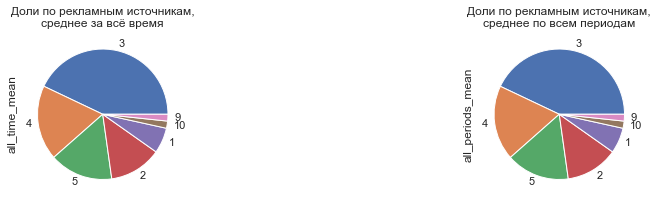

In [78]:
values_by_periods(table=costs_advance_buyers_only,
                  period='dt',
                  title='Затраты по дням',
                  values='costs',
                  agg='sum',)

Затраты по дням на дату 2017-09-22


,costs
dt,
2017-09-22,956.0


Затраты по дням на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
dt,,,,,,,,,,,,,,
2017-09-22,59.0,97.0,281.0,359.0,128.0,9.0,23.0,6.0,10.0,29.0,38.0,13.0,1.0,2.0


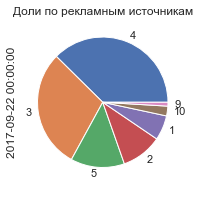

In [79]:
values_by_periods(table=costs_advance_buyers_only,
                  period='dt',
                  title='Затраты по дням на дату',
                  values='costs',
                  agg='sum',
                  date='2017-09-22',)

#### Маркетинг: сколько денег потратили? Всего / на каждый источник / по времени (недели)

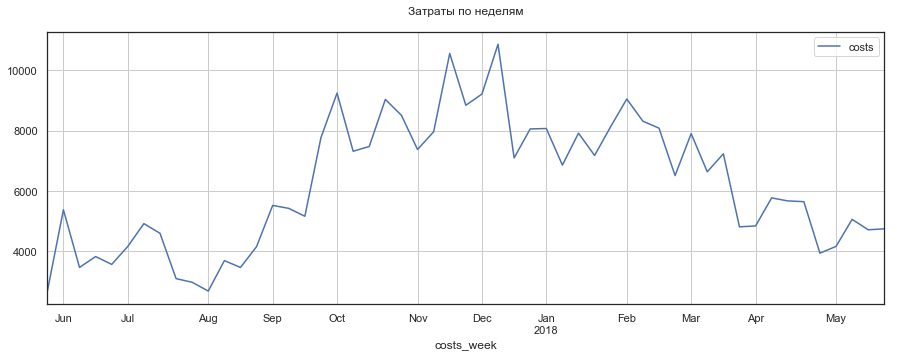

,costs
costs_week,
2017-05-29,2668.0
2017-06-05,5373.0
2017-06-12,3462.0
2017-06-19,3822.0
2017-06-26,3563.0
2017-07-03,4158.0
2017-07-10,4914.0
2017-07-17,4593.0
2017-07-24,3090.0


Затраты по неделям за всё время:


,costs
all_time_sum,329132.0
all_time_mean,6210.0
all_periods_mean,6210.0


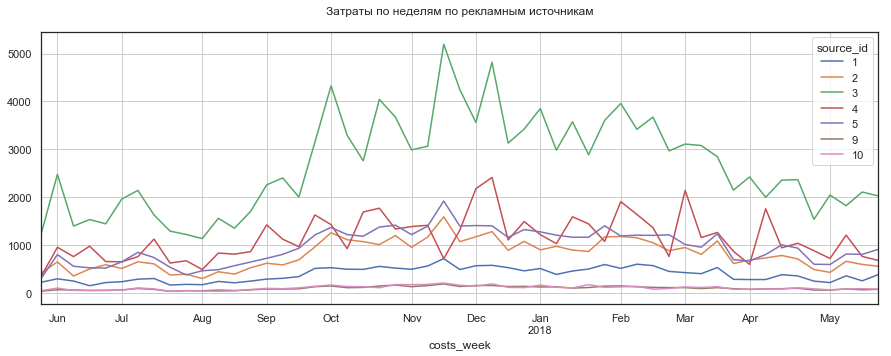

,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
costs_week,,,,,,,,,,,,,,
2017-05-29,229.0,421.0,1250.0,357.0,315.0,43.0,54.0,9.0,16.0,47.0,13.0,12.0,2.0,2.0
2017-06-05,300.0,653.0,2480.0,958.0,806.0,71.0,105.0,6.0,12.0,46.0,18.0,15.0,1.0,2.0
2017-06-12,253.0,359.0,1401.0,763.0,562.0,67.0,58.0,7.0,10.0,40.0,22.0,16.0,2.0,2.0
2017-06-19,156.0,506.0,1537.0,981.0,529.0,57.0,56.0,4.0,13.0,40.0,26.0,14.0,1.0,1.0
2017-06-26,221.0,594.0,1447.0,660.0,524.0,60.0,56.0,6.0,17.0,41.0,19.0,15.0,2.0,2.0
2017-07-03,239.0,515.0,1965.0,654.0,654.0,67.0,64.0,6.0,12.0,47.0,16.0,16.0,2.0,2.0
2017-07-10,293.0,654.0,2144.0,763.0,853.0,98.0,110.0,6.0,13.0,44.0,16.0,17.0,2.0,2.0
2017-07-17,306.0,612.0,1633.0,1130.0,743.0,79.0,91.0,7.0,13.0,36.0,25.0,16.0,2.0,2.0
2017-07-24,170.0,379.0,1295.0,629.0,541.0,38.0,38.0,6.0,12.0,42.0,20.0,18.0,1.0,1.0


Затраты по неделям за всё время по рекламным источникам:


,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
all_time_sum,20833.0,42806.0,141322.0,61074.0,51757.0,5517.0,5822.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0
all_time_mean,393.0,808.0,2666.0,1152.0,977.0,104.0,110.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0
all_periods_mean,393.0,808.0,2666.0,1152.0,977.0,104.0,110.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0


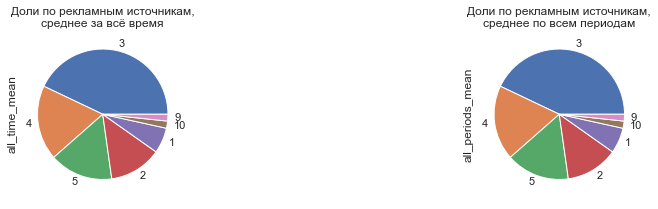

In [80]:
values_by_periods(table=costs_advance_buyers_only,
                  period='costs_week',
                  title='Затраты по неделям',
                  values='costs',
                  agg='sum',)

Затраты по неделям на дату 2017-09-22


,costs
costs_week,
2017-09-18,5158.0


Затраты по неделям на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
costs_week,,,,,,,,,,,,,,
2017-09-18,346.0,696.0,2005.0,970.0,938.0,92.0,111.0,7.0,14.0,39.0,19.0,18.0,2.0,2.0


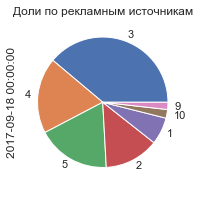

In [81]:
values_by_periods(table=costs_advance_buyers_only,
                  period='costs_week',
                  title='Затраты по неделям на дату',
                  values='costs',
                  agg='sum',
                  date='2017-09-22',)

#### Маркетинг: сколько денег потратили? Всего / на каждый источник / по времени (месяцы)

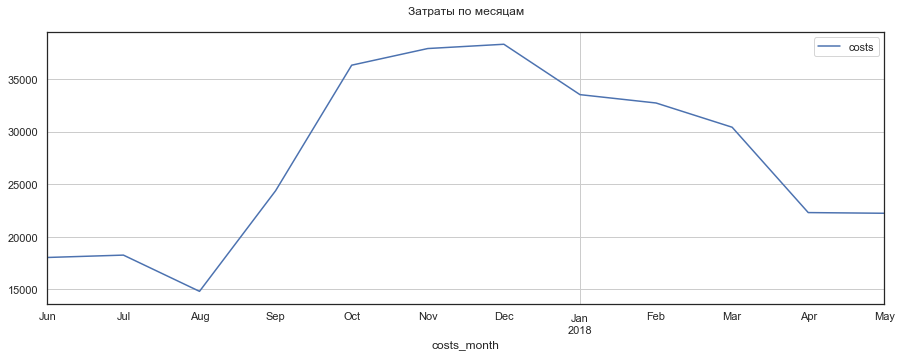

,costs
costs_month,
2017-06-01,18015.0
2017-07-01,18241.0
2017-08-01,14791.0
2017-09-01,24369.0
2017-10-01,36323.0
2017-11-01,37908.0
2017-12-01,38315.0
2018-01-01,33519.0
2018-02-01,32723.0


Затраты по месяцам за всё время:


,costs
all_time_sum,329132.0
all_time_mean,27428.0
all_periods_mean,27428.0


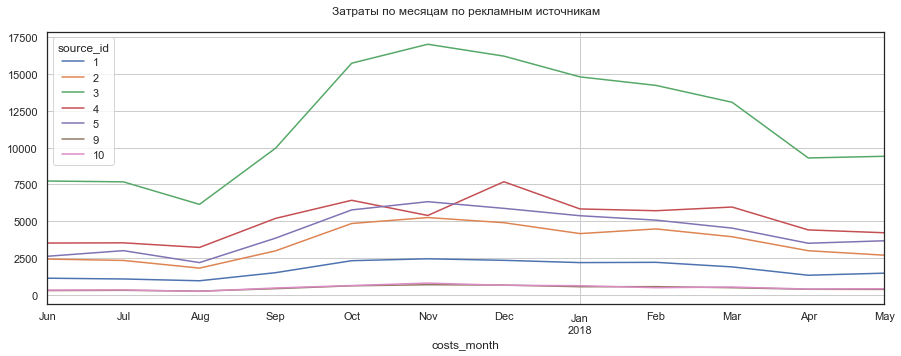

,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
costs_month,,,,,,,,,,,,,,
2017-06-01,1126.0,2427.0,7732.0,3515.0,2616.0,285.0,314.0,6.0,13.0,43.0,20.0,15.0,2.0,2.0
2017-07-01,1073.0,2333.0,7674.0,3530.0,2998.0,303.0,330.0,6.0,13.0,42.0,19.0,16.0,2.0,2.0
2017-08-01,952.0,1811.0,6144.0,3217.0,2185.0,249.0,233.0,6.0,12.0,42.0,22.0,15.0,2.0,2.0
2017-09-01,1502.0,2986.0,9964.0,5192.0,3849.0,416.0,461.0,6.0,12.0,41.0,21.0,16.0,2.0,2.0
2017-10-01,2316.0,4845.0,15737.0,6421.0,5767.0,609.0,627.0,6.0,13.0,43.0,18.0,16.0,2.0,2.0
2017-11-01,2445.0,5248.0,17025.0,5389.0,6325.0,683.0,792.0,6.0,14.0,45.0,14.0,17.0,2.0,2.0
2017-12-01,2341.0,4898.0,16220.0,7680.0,5873.0,658.0,646.0,6.0,13.0,42.0,20.0,15.0,2.0,2.0
2018-01-01,2186.0,4158.0,14809.0,5833.0,5372.0,547.0,614.0,7.0,12.0,44.0,17.0,16.0,2.0,2.0
2018-02-01,2204.0,4474.0,14229.0,5712.0,5071.0,552.0,481.0,7.0,14.0,43.0,17.0,15.0,2.0,1.0


Затраты по месяцам за всё время по рекламным источникам:


,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
all_time_sum,20833.0,42806.0,141322.0,61074.0,51757.0,5517.0,5822.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0
all_time_mean,1736.0,3567.0,11777.0,5089.0,4313.0,460.0,485.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0
all_periods_mean,1736.0,3567.0,11777.0,5089.0,4313.0,460.0,485.0,6.0,13.0,43.0,19.0,16.0,2.0,2.0


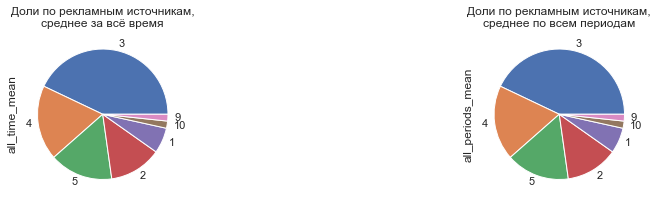

In [82]:
values_by_periods(table=costs_advance_buyers_only,
                  period='costs_month',
                  title='Затраты по месяцам',
                  values='costs',
                  agg='sum',)

Затраты по месяцам на дату 2017-09-22


,costs
costs_month,
2017-09-01,24369.0


Затраты по месяцам на дату 2017-09-22 по рекламным источникам:


,1,2,3,4,5,9,10,1_%,2_%,3_%,4_%,5_%,9_%,10_%
costs_month,,,,,,,,,,,,,,
2017-09-01,1502.0,2986.0,9964.0,5192.0,3849.0,416.0,461.0,6.0,12.0,41.0,21.0,16.0,2.0,2.0


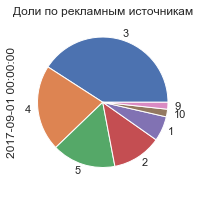

In [83]:
values_by_periods(table=costs_advance_buyers_only,
                  period='costs_month',
                  title='Затраты по месяцам на дату',
                  values='costs',
                  agg='sum',
                  date='2017-09-22',)

#### Маркетинг: сколько денег потратили? Вывод

В среднем за всё время, траты в месяц составляли 27428. Топ-3 рекламных источников: 3 (43%), 4 (19%), 5 (16%).

Минимальные траты были в августе 17 года (14791), максимальные в декабре 17 года (38315). За всё время потрачено 329132.

### Маркетинг: сколько стоило привлечение одного покупателя из каждого источника?

#### Маркетинг: сколько стоило привлечение одного покупателя из каждого источника? (недели)

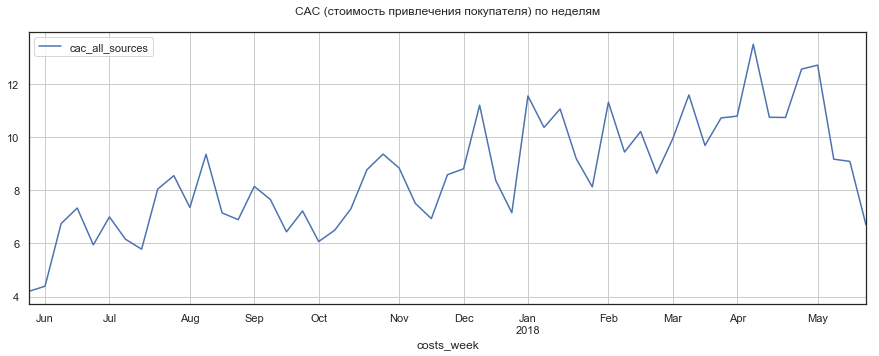

,cac_all_sources
costs_week,
2017-05-29,4.2
2017-06-05,4.4
2017-06-12,6.7
2017-06-19,7.3
2017-06-26,5.9
2017-07-03,7.0
2017-07-10,6.2
2017-07-17,5.8
2017-07-24,8.0


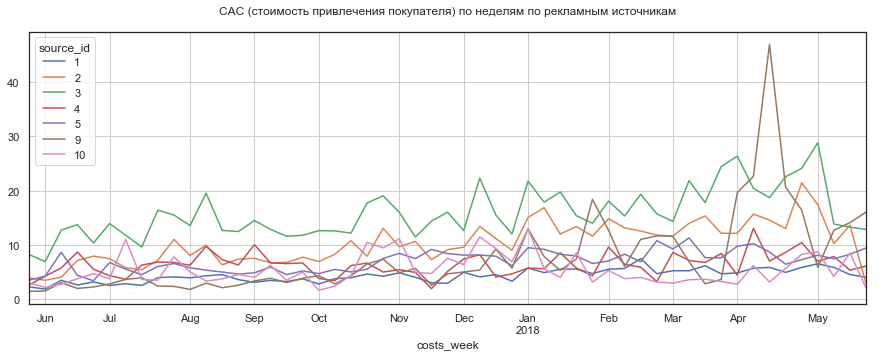

source_id,1,2,3,4,5,9,10
costs_week,,,,,,,
2017-05-29,2.3,3.9,8.2,2.6,3.5,1.4,3.0
2017-06-05,1.8,3.5,6.9,4.2,4.2,1.5,2.2
2017-06-12,3.5,4.0,12.7,5.7,8.6,3.0,2.8
2017-06-19,2.6,7.1,13.7,8.7,4.4,2.0,3.7
2017-06-26,3.2,7.9,10.3,5.5,3.4,2.2,4.7
2017-07-03,2.5,7.5,13.9,4.3,6.7,2.8,3.8
2017-07-10,2.8,5.8,11.8,3.6,5.5,3.6,11.0
2017-07-17,2.5,5.4,9.6,6.3,4.5,3.9,3.6
2017-07-24,4.0,7.2,16.4,6.8,6.0,2.4,3.5


In [84]:
values_by_periods(table=cac_week_buyers_only,
                  period='costs_week',
                  title='CAC (стоимость привлечения покупателя) по неделям',
                  values='cac_by_source',
                  values_ct_in='cac_all_sources',
                  agg='mean',
                  round=1)

CAC (стоимость привлечения покупателя) по неделям 2017-09-22
Распределение данных за период:


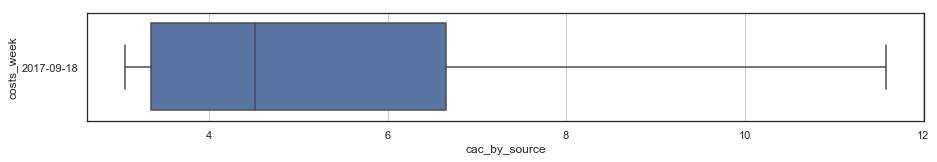

,cac_all_sources
costs_week,
2017-09-18,6.4


CAC (стоимость привлечения покупателя) по неделям 2017-09-22 по рекламным источникам:


source_id,1,2,3,4,5,9,10
costs_week,,,,,,,
2017-09-18,3.2,6.8,11.6,6.6,4.5,3.1,3.5


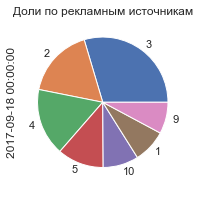

In [85]:
values_by_periods(table=cac_week_buyers_only,
                  period='costs_week',
                  title='CAC (стоимость привлечения покупателя) по неделям',
                  values='cac_by_source',
                  values_ct_in='cac_all_sources',
                  agg='mean',
                  date='2017-09-22',
                  round=1)

#### Маркетинг: сколько стоило привлечение одного покупателя из каждого источника? (месяцы)

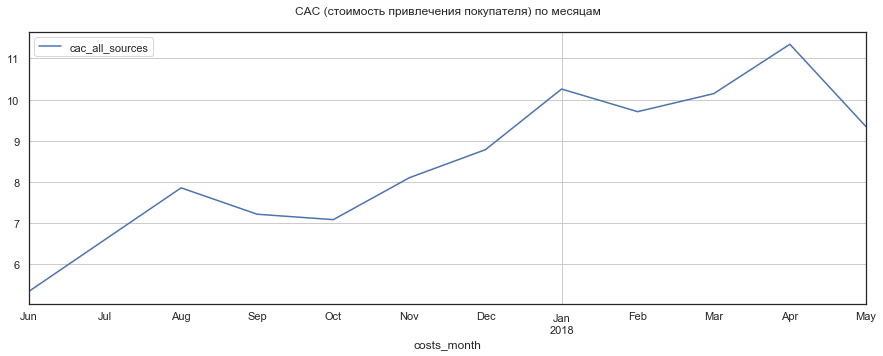

,cac_all_sources
costs_month,
2017-06-01,5.3
2017-07-01,6.6
2017-08-01,7.9
2017-09-01,7.2
2017-10-01,7.1
2017-11-01,8.1
2017-12-01,8.8
2018-01-01,10.3
2018-02-01,9.7


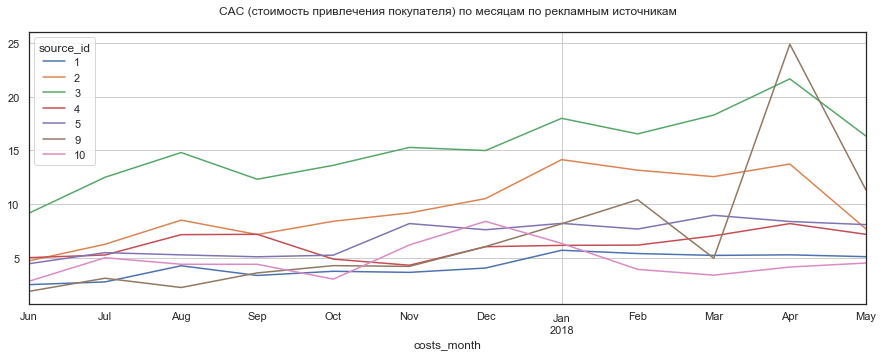

source_id,1,2,3,4,5,9,10
costs_month,,,,,,,
2017-06-01,2.5,4.7,9.1,5.0,4.4,1.9,2.8
2017-07-01,2.7,6.3,12.5,5.3,5.5,3.1,5.0
2017-08-01,4.2,8.5,14.8,7.1,5.3,2.2,4.4
2017-09-01,3.3,7.2,12.3,7.2,5.1,3.6,4.4
2017-10-01,3.7,8.4,13.6,4.9,5.2,4.3,3.0
2017-11-01,3.6,9.2,15.3,4.3,8.2,4.2,6.2
2017-12-01,4.0,10.5,15.0,6.0,7.6,6.0,8.4
2018-01-01,5.7,14.1,18.0,6.2,8.2,8.2,6.3
2018-02-01,5.4,13.2,16.5,6.2,7.7,10.4,3.9


In [86]:
values_by_periods(table=cac_month_buyers_only,
                  period='costs_month',
                  title='CAC (стоимость привлечения покупателя) по месяцам',
                  values='cac_by_source',
                  values_ct_in='cac_all_sources',
                  agg='mean',
                  round=1)

CAC (стоимость привлечения покупателя) по месяцам 2017-09-22
Распределение данных за период:


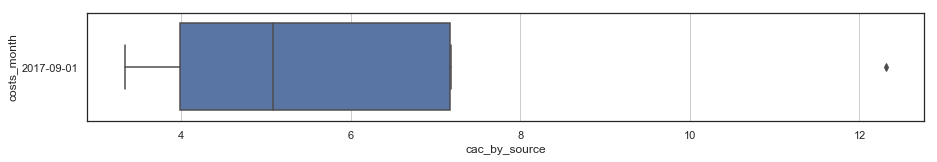

,cac_all_sources
costs_month,
2017-09-01,7.2


CAC (стоимость привлечения покупателя) по месяцам 2017-09-22 по рекламным источникам:


source_id,1,2,3,4,5,9,10
costs_month,,,,,,,
2017-09-01,3.3,7.2,12.3,7.2,5.1,3.6,4.4


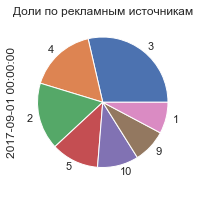

In [87]:
values_by_periods(table=cac_month_buyers_only,
                  period='costs_month',
                  title='CAC (стоимость привлечения покупателя) по месяцам',
                  values='cac_by_source',
                  values_ct_in='cac_all_sources',
                  agg='mean',
                  date='2017-09-22',
                  round=1)

In [88]:
cac_mean = (cac_month_all_visitors
 .agg({'costs': 'sum', 'members': 'sum'})
 .reset_index()
)
print('CAC (стоимость привлечения посетителя) за всё время')
print(round(cac_mean.loc[0, 0] / cac_mean.loc[1, 0], 2))

CAC (стоимость привлечения посетителя) за всё время
1.31


In [89]:
cac_mean = (cac_month_all_visitors
 .groupby('source_id')
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac = lambda x: x.costs / x.members)
 .sort_values(by='cac', ascending=False)
)
print('CAC (стоимость привлечения посетителя) по источникам рекламы за всё время')
display(cac_mean.round(2))

CAC (стоимость привлечения посетителя) по источникам рекламы за всё время


,costs,members,cac
source_id,,,
3,141321.63,67284.0,2.10
2,42806.04,24152.0,1.77
1,20833.27,17959.0,1.16
5,51757.10,50921.0,1.02
4,61073.60,75080.0,0.81
10,5822.49,7208.0,0.81
9,5517.49,8504.0,0.65


In [90]:
cac_mean = (cac_month_buyers_only
 .agg({'costs': 'sum', 'members': 'sum'})
 .reset_index()
)
print('CAC (стоимость привлечения покупателя) за всё время')
print(round(cac_mean.loc[0, 0] / cac_mean.loc[1, 0], 2))

CAC (стоимость привлечения покупателя) за всё время
8.33


In [91]:
cac_mean = (cac_month_buyers_only
 .groupby('source_id')
 .agg({'costs': 'sum', 'members': 'sum'})
 .assign(cac = lambda x: x.costs / x.members)
 .sort_values(by='cac', ascending=False)
)
print('CAC (стоимость привлечения покупателя) по источникам рекламы за всё время')
display(cac_mean.round(2))

CAC (стоимость привлечения покупателя) по источникам рекламы за всё время


,costs,members,cac
source_id,,,
3,141321.63,9438.0,14.97
2,42806.04,4650.0,9.21
5,51757.10,7649.0,6.77
4,61073.60,10241.0,5.96
9,5517.49,1158.0,4.76
10,5822.49,1311.0,4.44
1,20833.27,5085.0,4.10


#### Маркетинг: сколько стоило привлечение одного покупателя из каждого источника? Вывод

В среднем за всё время, стоимость привлечения одного посетителя составила 1.31. Топ-3 рекламных источников: 3 (2.10), 2 (1.77), 1 (1.16).

В среднем за всё время, стоимость привлечения одного покупателя составила 8.33. Топ-3 рекламных источников: 3 (14.97), 2 (9.21), 5 (6.77).

Минимальный CAC был в июне 17 года (5.3), максимальный в апреле 18 года (11.3).

### Маркетинг: на сколько окупились расходы? (ROI)

#### Маркетинг: на сколько окупились расходы? (ROI) (месячные когорты)

Все посетители 

ROMI за всё время 0.76


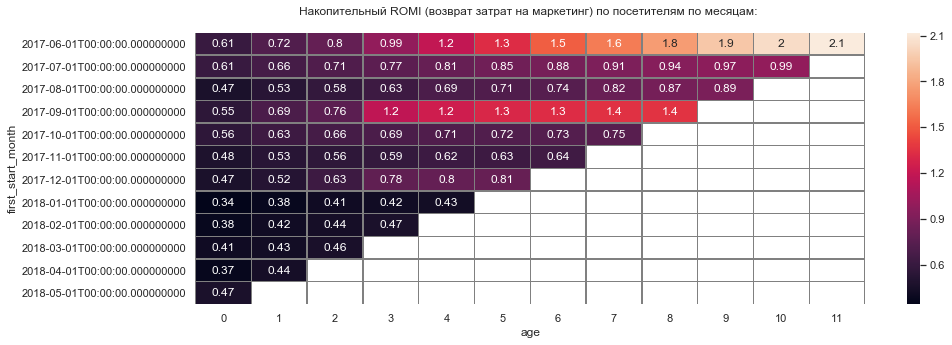

In [92]:
print('Все посетители', '\n')
cohorts(table=visits_advance_with_buys,
        table_costs=costs_advance_all_visitors,
        metrics='romi',
        period='start_month',
        title='Накопительный ROMI (возврат затрат на маркетинг) по посетителям по месяцам:',
        heatmap=True,)

Когорты посетителей. Расходы окупились только у первой и четвертой когорт. ROMI за всё время по всем когортам составляет 0.76.

Только покупатели 

ROMI за всё время 0.76


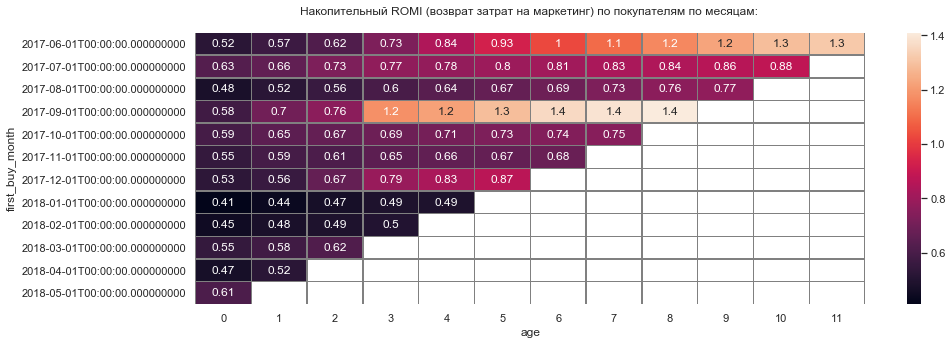

In [93]:
print('Только покупатели', '\n')
cohorts(table=orders_advance,
        table_costs=costs_advance_buyers_only,
        metrics='romi',
        period='buy_month',
        title='Накопительный ROMI (возврат затрат на маркетинг) по покупателям по месяцам:',
        heatmap=True,)

Когорты покупателей. Расходы окупились только у первой и четвертой когорт. ROMI за всё время по всем когортам составляет 0.76.

Все посетители 

source_id = 1:
ROMI за всё время 2.12


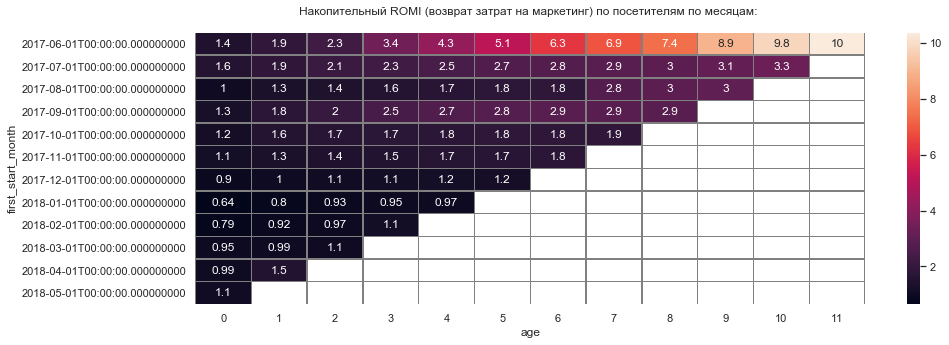

source_id = 2:
ROMI за всё время 1.44


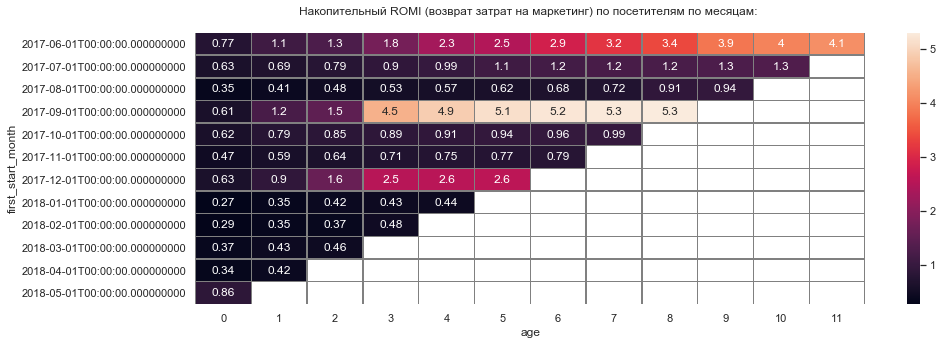

source_id = 3:
ROMI за всё время 0.29


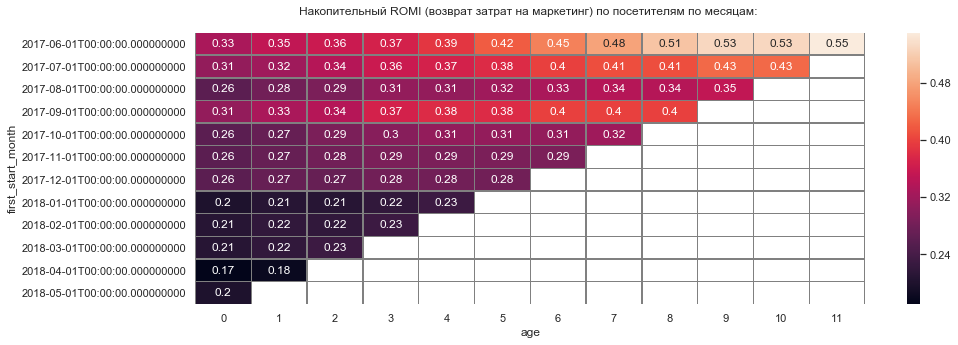

source_id = 4:
ROMI за всё время 0.79


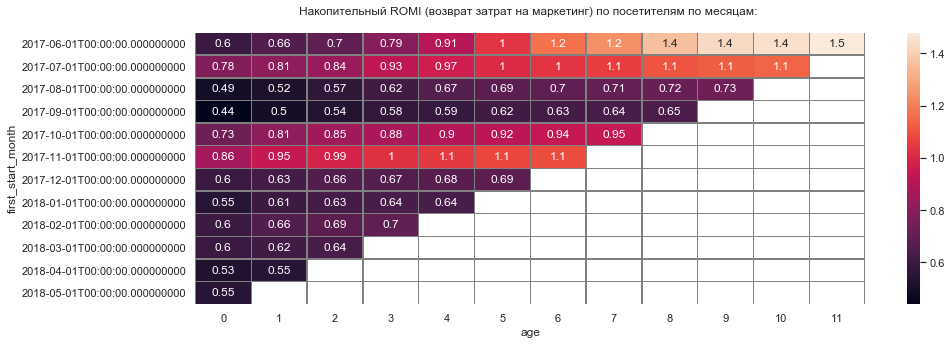

source_id = 5:
ROMI за всё время 0.86


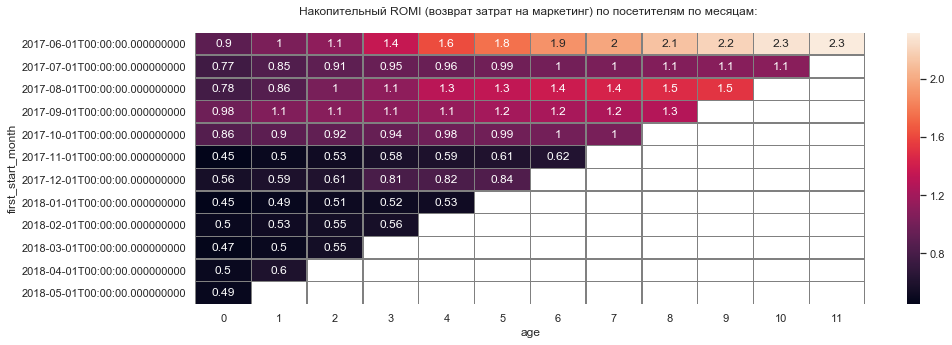

source_id = 6:
ROMI за всё время nan
There are no much values to calculate 

source_id = 7:


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: invalid value encountered in double_scalars
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: divide by zero encountered in double_scalars


ROMI за всё время inf
There are no much values to calculate 

source_id = 9:
ROMI за всё время 0.84


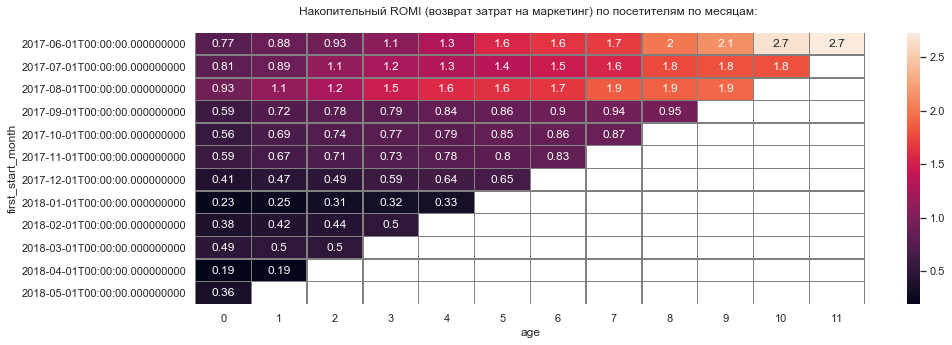

source_id = 10:
ROMI за всё время 0.68


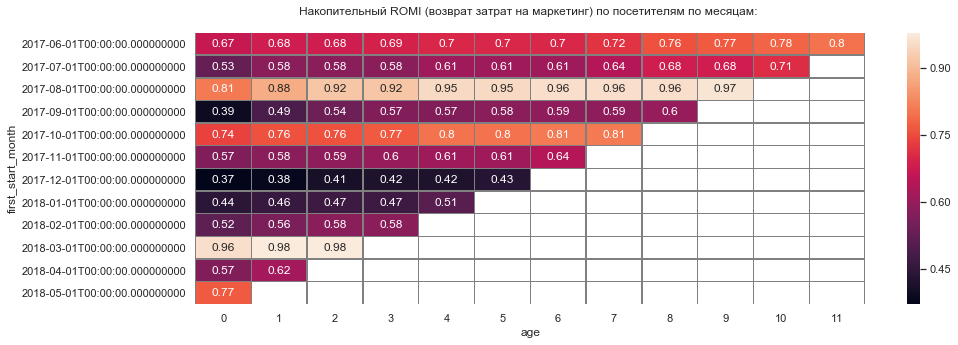

In [94]:
print('Все посетители', '\n')
for j in visits_advance_with_buys['source_id'].sort_values().unique():
    print(f'source_id = {j}:')
    cohorts(table=visits_advance_with_buys,
            table_costs=costs_advance_all_visitors,
            query='source_id == @j',
            metrics='romi',
            period='start_month',
            title='Накопительный ROMI (возврат затрат на маркетинг) по посетителям по месяцам:',
            heatmap=True,)    

Когорты посетителей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам (0.97 у когорты января 18 года). Худший рекламный источник 3 с ROMI 0.29.

Только покупатели 

source_id = 1:
ROMI за всё время 2.12


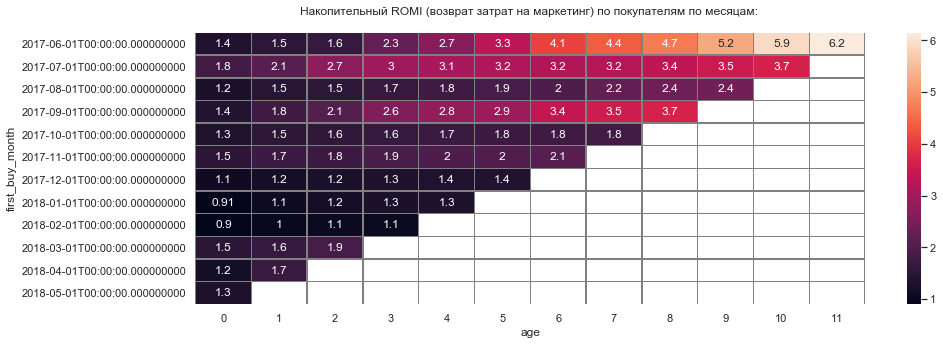

source_id = 2:
ROMI за всё время 1.44


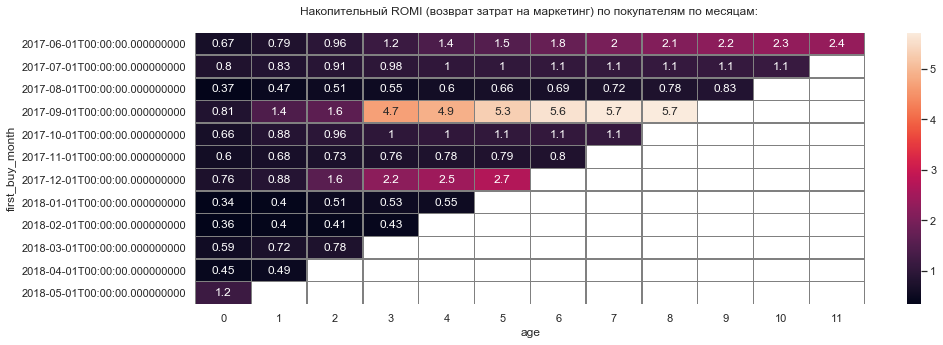

source_id = 3:
ROMI за всё время 0.29


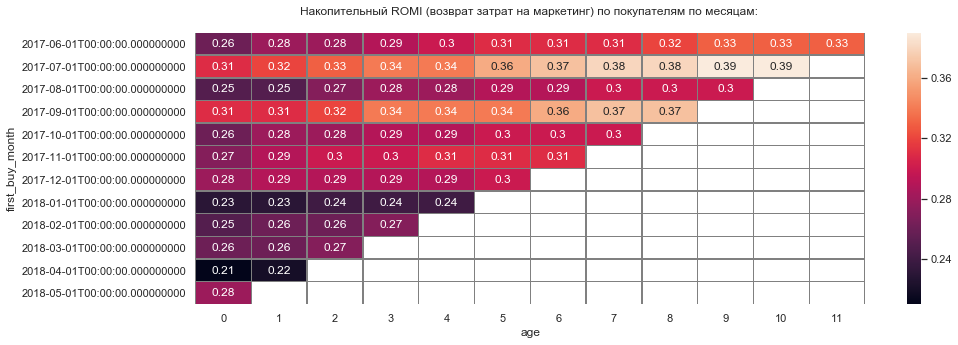

source_id = 4:
ROMI за всё время 0.79


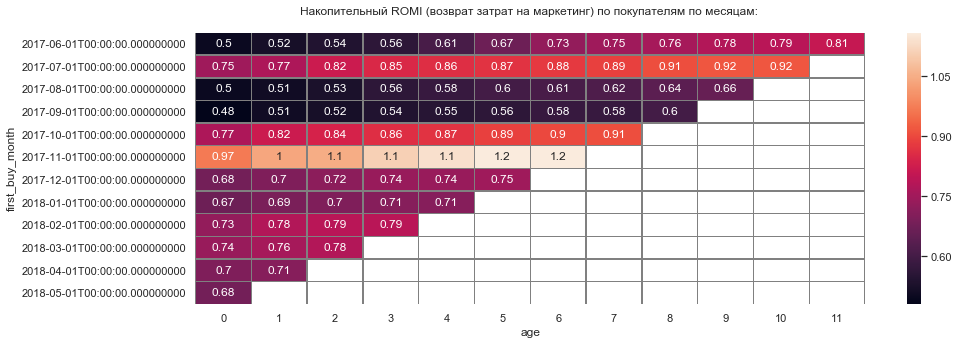

source_id = 5:
ROMI за всё время 0.86


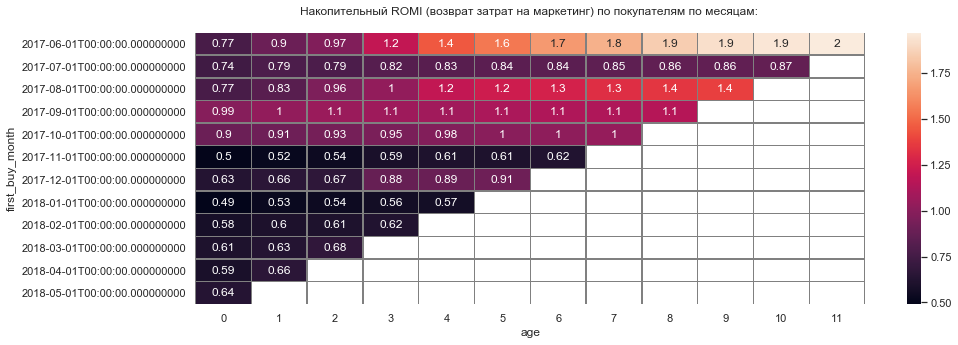

source_id = 7:
ROMI за всё время inf
There are no much values to calculate 

source_id = 9:
ROMI за всё время 0.84


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: divide by zero encountered in double_scalars


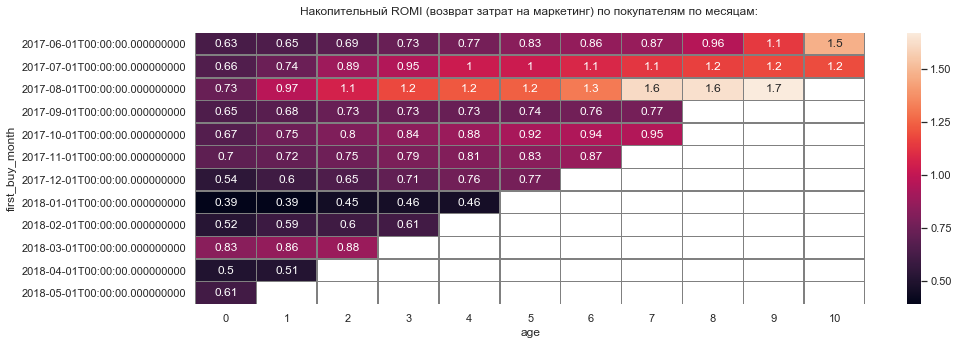

source_id = 10:
ROMI за всё время 0.68


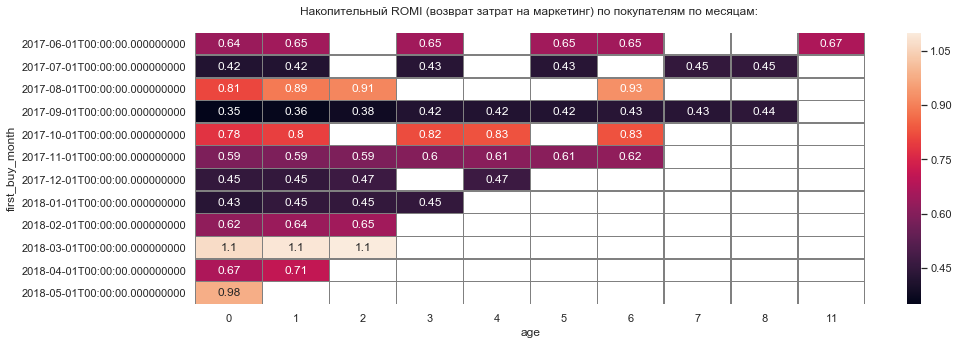

In [95]:
print('Только покупатели', '\n')
for j in orders_advance['source_id'].sort_values().unique():
    print(f'source_id = {j}:')
    cohorts(table=orders_advance,
            table_costs=costs_advance_buyers_only,
            query=f'source_id == @j',
            metrics='romi',
            period='buy_month',
            title='Накопительный ROMI (возврат затрат на маркетинг) по покупателям по месяцам:',
            heatmap=True,)    

Когорты покупателей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам. У десяти когорт расходы окупились уже в нулевой месяц, у оставшихся двух когорт расходы окупились в первый месяц.

#### Маркетинг: на сколько окупились расходы? Вывод

ROMI за всё время по всем когортам составляет 0.76. Расходы окупились только у первой и четвертой когорт.

Когорты посетителей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам (0.97 у когорты января 18 года). Худший рекламный источник 3 с ROMI 0.29.

Когорты покупателей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам. У десяти когорт расходы окупились уже в нулевой месяц, у оставшихся двух когорт расходы окупились в первый месяц.

### Маркетинг. Вывод

#### Маркетинг:  сколько денег потратили?

В среднем за всё время, траты в месяц составляли 27428. Топ-3 рекламных источников: 3 (43%), 4 (19%), 5 (16%).

Минимальные траты были в августе 17 года (14791), максимальные в декабре 17 года (38315). За всё время потрачено 329132.

#### Маркетинг:  сколько стоило привлечение одного покупателя из каждого источника?

В среднем за всё время, стоимость привлечения одного посетителя составила 1.31. Топ-3 рекламных источников: 3 (2.10), 2 (1.77), 1 (1.16).

В среднем за всё время, стоимость привлечения одного покупателя составила 8.33. Топ-3 рекламных источников: 3 (14.97), 2 (9.21), 5 (6.77).

Минимальный CAC был в июне 17 года (5.3), максимальный в апреле 18 года (11.3).

#### Маркетинг:  на сколько окупились расходы?

ROMI за всё время по всем когортам составляет 0.76. Расходы окупились только у первой и четвертой когорт.

Когорты посетителей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам (0.97 у когорты января 18 года). Худший рекламный источник 3 с ROMI 0.29.

Когорты покупателей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам. У десяти когорт расходы окупились уже в нулевой месяц, у оставшихся двух когорт расходы окупились в первый месяц.

### Шаг 2. Вывод

#### Продукт:   сколько людей пользуются в день, неделю, месяц?

DAU: в среднем по дневным периодам, продуктом пользуются 818 человек в день, из них 73% десктопными и 27% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (30%), 3 (25%), 5 (19%).

В среднем за всё время, продуктом пользуются 569 человек в день, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (25%), 5 (19%).

WAU: в среднем по недельным периодам, продуктом пользуются 5148 человек в неделю, из них 73% десктопными и 28% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (32%), 3 (27%), 5 (20%).

В среднем за всё время, продуктом пользуются 3907 человек в неделю, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

MAU: в среднем по месячным периодам, продуктом пользуются 20956 человек в месяц, из них 73% десктопными и 29% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (33%), 3 (29%), 5 (21%).

В среднем за всё время, продуктом пользуются 17254 человек в месяц, из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

За всё время продуктом воспользовались 207051 человек, из них из них 73% десктопными и 30% мобильными версиями. Топ-3 рекламных источников этих пользователей: 4 (36%), 3 (32%), 5 (25%).

Количество пользователей снижается в 10-30 раз по разным когортам уже через месяц использования продукта.

Количество пользователей в нулевом месяце использования продукта было максимальным в ноябре 17 года (24852), после чего стало снижаться до 13828 в мае 18 года. Падение за этот период составило 44%

#### Продукт:   сколько сессий в день?

В среднем за всё время, количество сессий составляет 889 в день, из них 74% десктопные и 26% мобильные версиии. Топ-3 рекламных источников: 4 (28%), 3 (24%), 5 (18%).

За весь период продуктом воспользовались 238876 раза.

#### Продукт:   сколько длится одна сессия?

Средняя длительность сессии за всё время составляет 12 мин. По устройствам: десктопные 13 мин, мобильные 9 мин. Топ-3 рекламных источников: 6 (27 мин), 1 (18 мин), 2 (15 мин).

Медианная длительность сессии за всё время составляет 6 мин. По устройствам: десктопные 7 мин, мобильные 4 мин. Топ-3 рекламных источников: 1 (11 мин), 6 (8 мин), 2 (8 мин).

Средняя длительность сессии по когортам пользователей увеличивается со временем с 11 до 22 мин.

Медианная длительность сессии по когортам пользователей увеличивается со временем с 6 до 11 мин.

#### Продукт:   как часто люди возвращаются?

Доля вернувшихся пользователей уменьшается по всем когортам, в среднем по когортам с 5.4% пользователей на первом месяце использования продукта (именно первом, есть еще нулевой) до 1.3% на двенадцатом месяце.

Топ-3 по доле вернувшихся пользователей по рекламным источникам: 9 (7.8%), 2 (7.6%), 1 (6.3%).

В среднем, чаще возвращаются на десктопах (3.3%), чем на мобильных (2.7%).

#### Продажи:   когда люди начинают покупать?

Доля повторных покупок от общего количества покупок 26.5%

Не имеет смысла рассчитывать начало покупок на больших периодах: всего одна покупка в конце рассматриваемого периода очень сильно сместит среднее и исказит результат.

Среднее время первой покупки в течение первых суток использования продукта за всё время составляет 77 мин. По устройствам: десктопные 73 мин, мобильные 94 мин. Топ-3 рекламных источников: 1 (147 мин), 2 (113 мин), 9 (80 мин).

Среднее время первой покупки в течение первой недели использования продукта за всё время составляет 487 мин. По устройствам: десктопные 457 мин, мобильные 626 мин. Топ-3 рекламных источников: 7 (52 мин), 5 (356 мин), 3 (390 мин).

Медианное время первой покупки в течение первых суток использования продукта за всё время составляет 7 мин. По устройствам: десктопные и мобильные по 7 мин. Топ-3 рекламных источников: 5 и 10 (6 мин), 2, 3 и 4 (7 мин).

Медианное время первой покупки в течение первой недели использования продукта за всё время составляет 9 мин. По устройствам: десктопные и мобильные по 9 мин. Топ-3 рекламных источников: 5 и 10 (7 мин), 3 и 4 (8 мин).

#### Продажи:   сколько раз покупают за период?

В среднем за всё время, количество покупок в неделю составляет 937. По устройствам: десктопные 83%, мобильные 17%. Топ-3 рекламных источников: 4 (24%), 3 (21%), 5 (20%).

За всё время сделано 49666 покупок, перед которыми покупатели пользовались продуктом.

В среднем за всё время, количество покупок в месяц составляет 4139.

В среднем по когортам, число покупок в месяц уменьшается со временем.

Максимальное количество покупок в месяц было на нулевом месяце использования продукта по всем когортам. Максимум был 4695 у когорты октября 17 года, после чего количество снижалось у следующих когорт до 2460 у когорты мая 18 года. За этот период падение количества покупок в месяц составило 48%.

#### Продажи:   какой средний чек?

За всё время средний чек равняется 5.0. По устройствам: десктопные 5.2, мобильные 4.2. Топ-3 рекламных источников: 2 (8.4), 1 (6.0), 5 (4.5).

Особенно выделяются по большому среднему чеку когорты сентября и декабря 17 года.

За всё время медианный чек равняется 2.5. По устройствам: десктопные 2.7, мобильные 2.4. Топ-3 рекламных источников: 1, 2 и 5 (2.8).

Со временем медианный чек по когортам немного увеличивается.

#### Продажи:   сколько денег приносят? (LTV)

Когорты посетителей. Средний накопительный LTV по всем когортам увеличился с 0.8 в нулевом месяце до 1.8 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV в разы больше, чем у других когорт.

Когорты посетителей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 1, увеличился с 1.2 в нулевом месяце до 4.4 в 11 месяце.

Когорты покупателей. Средний накопительный LTV по всем когортам увеличился с 4.9 в нулевом месяце до 9.2 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

Когорты покупателей. Максимальный средний накопительный LTV по всем когортам по рекламному источнику 2, увеличился с 5.6 в нулевом месяце до 18 в 11 месяце. Особенно выделяется когорта сентября 17 года на третьем месяце со значение LTV на порядок больше, чем у других когорт.

#### Маркетинг:   сколько денег потратили?

В среднем за всё время, траты в месяц составляли 27428. Топ-3 рекламных источников: 3 (43%), 4 (19%), 5 (16%).

Минимальные траты были в августе 17 года (14791), максимальные в декабре 17 года (38315). За всё время потрачено 329132.

#### Маркетинг:   сколько стоило привлечение одного покупателя из каждого источника?

В среднем за всё время, стоимость привлечения одного посетителя составила 1.31. Топ-3 рекламных источников: 3 (2.10), 2 (1.77), 1 (1.16).

В среднем за всё время, стоимость привлечения одного покупателя составила 8.33. Топ-3 рекламных источников: 3 (14.97), 2 (9.21), 5 (6.77).

Минимальный CAC был в июне 17 года (5.3), максимальный в апреле 18 года (11.3).

#### Маркетинг:   на сколько окупились расходы?

ROMI за всё время по всем когортам составляет 0.76. Расходы окупились только у первой и четвертой когорт.

Когорты посетителей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам (0.97 у когорты января 18 года). Худший рекламный источник 3 с ROMI 0.29.

Когорты покупателей. Лучший рекламный источник 1: ROMI за всё время по всем когортам составляет 2.12, расходы окупились по всем когортам. У десяти когорт расходы окупились уже в нулевой месяц, у оставшихся двух когорт расходы окупились в первый месяц.

## Шаг 3. Напишите вывод: порекомендуйте маркетологам, куда и сколько им стоит вкладывать денег?

Рекомендация маркетологам владывать деньги в рекламный источник 1, от остальных источников отказаться.